In [2]:
API_KEY = "upb98SkWvvfSwEWF0McM4NSKv1xtiyu8"

In [5]:
import pandas as pd

file_path = r"C:\Users\qwero\OneDrive - Delft University of Technology\Desktop\Master Thisis\jupyter\gas_consumption_data.csv"
gas_data = pd.read_csv(file_path)

# Now you can work with the data_frame object, which represents the contents of the Excel file
# For example, you can print the first few rows of the data_frame
print(gas_data.head())


gas_data['datetime'] = pd.to_datetime(gas_data['datetime'], utc=True)

   meter_id                   datetime  value
0      4902  2020-01-01 01:00:00+01:00   43.0
1      4902  2020-01-01 02:00:00+01:00   42.0
2      4902  2020-01-01 03:00:00+01:00   44.0
3      4902  2020-01-01 04:00:00+01:00   43.0
4      4902  2020-01-01 05:00:00+01:00   45.0


In [2]:
# List of ids and descriptions 
# got rid of this 55789: '4535e9b Uilenstede 405-461 (WKK BPM)',
ids_and_descriptions = {
    4902: '4531g0b Uilenstede 5-61 (Toren 1)',   
    4903: '4534g0b Uilenstede 155-211 (Toren 2)',   
    4904: '4535g0b Uilenstede 405-461 (Toren 3)',
    4905: '4520g0a Uilenstede 106-460',
    40752: '4504g0a UIlenstede 36-70',
    40773: '4501g0a Uilenstede 2-32',
    40812: '4511g0b Uilenstede 102 e-h (trad)',   
    41574: '4510g0b Uilenstede 102 a-d (H-inst)',   
}

# Dictionary mapping meter IDs to building numbers
id_and_building = {
    4902: '4531',
    4903: '4534',
    4904: '4535',
    4905: '4520',
    40752: '4504',
    40773: '4501',
    40812: '4511',
    41574: '4510',
}

# List of building numbers and their respective area (Som van NEN2580 GO)
buildings_and_area = {
    '4501': 1843,
    '4502': 831,
    '4503': 1432,
    '4504': 1801,
    '4505': 1112,
    '4506': 1605,
    '4508': 1665,
    '4510': 1798,
    '4511': 1534,
    '4520': 51766,
    '4521': None,
    '4522': 8553,
    '4523': 8553,
    '4524': 8203,
    '4525': 1448,
    '4531': 8555,
    '4534': 8553,
    '4535': 8552,
    '4536': 11101,
    '4537': 5425,
    '4538': 6860,
}
# Create a new dictionary that maps meter IDs to areas
ids_and_area = {}
for id, building in id_and_building.items():
    if building in buildings_and_area:
        ids_and_area[id] = buildings_and_area[building]
# Define a color for each meter ID
colors_dict = {
    4902: 'C0',  # blue
    4903: 'C1',  # orange
    4904: 'C2',  # green
    4905: 'C3',  # red
    40752: 'C4',  # purple
    40773: 'C5',  # brown
    40812: 'C6',  # pink
    41574: 'C7',  # gray
}

In [4]:
import requests
import xml.etree.ElementTree as ET
import pandas as pd
import numpy as np
import calendar

def get_gas_consumption(api_key, ids_and_descriptions, per, start_year, end_year):
    url = 'https://joulz.e-dataportal.nl/api/v3.1/aggregates/'
    params = {
        'apikey': api_key,
        'per': per,
    }

    gas_data = pd.DataFrame()
    for year in range(start_year, end_year):
        for month in range(1, 13):
            last_day_of_month = calendar.monthrange(year, month)[1]
            start_date = f'01-{month:02}-{year}'
            end_date = f'{last_day_of_month:02}-{month:02}-{year}'

            for meter_id, description in ids_and_descriptions.items():
                params['dap'] = str(meter_id)
                params['begin'] = start_date
                params['end'] = end_date

                response = requests.get(url, params=params)

                if response.status_code == 200:
                    df = pd.read_xml(response.content)
                    df['datetime'] = pd.to_datetime(df['datetime'])
                    df['meter_id'] = meter_id
                    df = df[['meter_id', 'datetime', 'value']]
                    gas_data = pd.concat([gas_data, df], ignore_index=True)
                else:
                    print(f'Request failed with status code {response.status_code}')
    
    return gas_data


In [7]:

gas_data_scaled = gas_data.copy()
gas_data_scaled['area'] = gas_data_scaled['meter_id'].map(ids_and_area)

# Scale the value by the area
gas_data_scaled['value'] = gas_data_scaled['value'] / gas_data_scaled['area']

In [4]:
gas_data

,meter_id,datetime,value
0,4902,2020-01-01 00:00:00+00:00,43.0
1,4902,2020-01-01 01:00:00+00:00,42.0
2,4902,2020-01-01 02:00:00+00:00,44.0
3,4902,2020-01-01 03:00:00+00:00,43.0
4,4902,2020-01-01 04:00:00+00:00,45.0
...,...,...,...
210427,41574,2022-12-31 19:00:00+00:00,4.5
210428,41574,2022-12-31 20:00:00+00:00,4.4
210429,41574,2022-12-31 21:00:00+00:00,4.8
210430,41574,2022-12-31 22:00:00+00:00,4.2


In [43]:
data = gas_data[gas_data['meter_id'] == 4902]

In [11]:
data1 = data[data['datetime'].dt.date == random_date]['value']
data2 = data[data['datetime'].dt.date == random_date + pd.DateOffset(days=1)]['value']


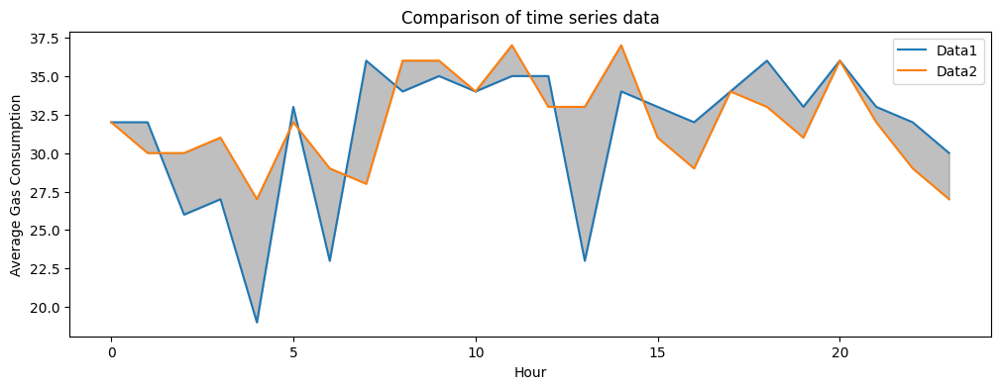

In [154]:
import numpy as np
import matplotlib.pyplot as plt

def plot_time_data_difference(data1, data2):
    # Create a new figure for each cluster
    fig, ax = plt.subplots(figsize=(12, 4))

    # Plot the average consumption for each cluster
    ax.plot(np.arange(24), data1, label='Data1')
    ax.plot(np.arange(24), data2, label='Data2')

    # Highlight the difference between the two groups
    ax.fill_between(np.arange(24), data1, data2, color='gray', alpha=0.5)

    ax.set_xlabel("Hour")
    ax.set_ylabel("Average Gas Consumption")
    ax.set_title(f"Comparison of time series data")
    ax.legend()

    plt.show()

# Select a random date
random_date = np.random.choice(data['datetime'].dt.date.unique())

# Filter the data for the selected date and the next day
data1 = data[data['datetime'].dt.date == random_date]['value']
data2 = data[data['datetime'].dt.date == random_date + pd.DateOffset(days=1)]['value']

# Plot the data difference
plot_time_data_difference(data1, data2)


In [ ]:
plot_time_data_difference(data1, data2)


## Caculating summer hot tap average

In [6]:
import pandas as pd

def calculate_non_heating_averages(data, ids_and_descriptions):
    non_heating_averages = {}  # Dictionary to store the non-heating averages for each location

    for id, description in ids_and_descriptions.items():
        # Filter the data for the current location
        location_data = data[data['meter_id'] == id]

        # Convert 'datetime' column to datetime format
        location_data['datetime'] = pd.to_datetime(location_data['datetime'], utc=True)

        # Set datetime column as index
        df = location_data.set_index('datetime')

        # Reshape the dataframe
        df_temp = df.reset_index().copy()
        df_temp['date'] = df_temp['datetime'].dt.date
        df_temp['month'] = df_temp['datetime'].dt.month
        df_temp['hour'] = df_temp['datetime'].dt.hour

        # Create a boolean mask for the heating months (October to April)
        heating_months = (df_temp['month'] >= 10) | (df_temp['month'] <= 4)

        heating_data = df_temp[heating_months]
        non_heating_data = df_temp[~heating_months]
        print(non_heating_data.month.unique())
        heating_average = heating_data['value'].mean()
        non_heating_average = non_heating_data['value'].mean()

        non_heating_averages[id] = non_heating_average

    return non_heating_averages


In [15]:
non_heating_averages = calculate_non_heating_averages(gas_data_scaled, ids_and_descriptions)

c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


[5 6 7 8 9]
[5 6 7 8 9]
[5 6 7 8 9]
[5 6 7 8 9]
[5 6 7 8 9]
[5 6 7 8 9]
[5 6 7 8 9]
[5 6 7 8 9]


              value  area building_id
meter_id                             
4902      26.878294  8555        4531
              value  area building_id
meter_id                             
4903      28.472303  8553        4534
              value  area building_id
meter_id                             
4904      29.927923  8552        4535
             value   area building_id
meter_id                             
4905      32.69884  51766        4520
              value  area building_id
meter_id                             
40752     67.219382  1801        4504
              value  area building_id
meter_id                             
40773     51.155489  1843        4501
              value  area building_id
meter_id                             
40812     27.112506  1534        4511
              value  area building_id
meter_id                             
41574     21.992504  1798        4510


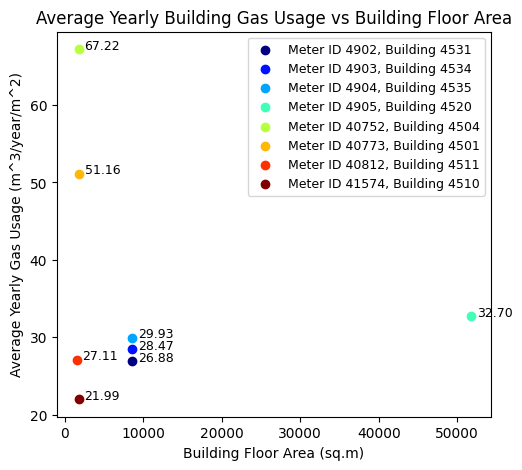

In [22]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Group data by meter_id and calculate average hourly consumption
average_hourly_usage = gas_data_scaled.groupby('meter_id')['value'].mean()

# Convert hourly consumption to yearly consumption
average_yearly_usage = average_hourly_usage * 8760  # convert to yearly consumption

# Map the building area and ID for each meter_id
average_yearly_usage = pd.DataFrame(average_yearly_usage)
average_yearly_usage['area'] = average_yearly_usage.index.map(ids_and_area)
average_yearly_usage['building_id'] = average_yearly_usage.index.map(id_and_building)  # Add building_id mapping

# Create a list of unique meter IDs
unique_meter_ids = gas_data_scaled['meter_id'].unique()

# Generate a color map
colors = plt.cm.jet(np.linspace(0, 1, len(unique_meter_ids)))

plt.figure(figsize=(8, 5))

# Plot each meter ID in a different color
for i, meter_id in enumerate(unique_meter_ids):

    data = average_yearly_usage[average_yearly_usage.index == meter_id]
    print(data)
    plt.scatter(data['area'], data['value'], color=colors[i], label=f'Meter ID {meter_id}, Building {data["building_id"].unique()[0]}')
    for index, row in data.iterrows():
        plt.text(row['area'] + 750, row['value'] + 0.0001, f'{row["value"]:.2f}', color='black', fontsize=9)

plt.xlabel('Building Floor Area (sq.m)')
plt.ylabel('Average Yearly Gas Usage (m^3/year/m^2)')
plt.title('Average Yearly Building Gas Usage vs Building Floor Area')

# Shrink current axis by 20% to place legend outside of plot
box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.7, box.height])

# Place legend outside of plot
plt.legend(fontsize=9)  # Specify the fontsize here

plt.show()


## filtering out winter months

In [8]:
def filter_heating_months(df):
    """Filter the dataframe to only include data from the heating months.

    Args:
    df (pandas.DataFrame): The input dataframe. Should include a 'datetime' column.

    Returns:
    pandas.DataFrame: A new dataframe that only includes data from the heating months (October to April).
    """
    # Make a copy to avoid modifying the original dataframe
    df_temp = df.copy()
    
    # Ensure the 'datetime' column is of datetime type
    df_temp['datetime'] = pd.to_datetime(df_temp['datetime'],utc=True)
    
    # Create new columns for 'date', 'month', and 'hour'
    df_temp['date'] = df_temp['datetime'].dt.date
    df_temp['month'] = df_temp['datetime'].dt.month
    df_temp['hour'] = df_temp['datetime'].dt.hour

    # Create a boolean mask for the heating months (October to April)
    heating_months = (df_temp['month'] >= 12) | (df_temp['month'] <= 2)

    # Apply the mask to the dataframe
    df_heating_months = df_temp[heating_months]

    return df_heating_months


In [9]:
df_winter_months = filter_heating_months(gas_data_scaled)


In [9]:
df_heating_months

,meter_id,datetime,value,area,date,month,hour
0,4902,2020-01-01 00:00:00+00:00,0.005026,8555,2020-01-01,1,0
1,4902,2020-01-01 01:00:00+00:00,0.004909,8555,2020-01-01,1,1
2,4902,2020-01-01 02:00:00+00:00,0.005143,8555,2020-01-01,1,2
3,4902,2020-01-01 03:00:00+00:00,0.005026,8555,2020-01-01,1,3
4,4902,2020-01-01 04:00:00+00:00,0.005260,8555,2020-01-01,1,4
...,...,...,...,...,...,...,...
210427,41574,2022-12-31 19:00:00+00:00,0.002503,1798,2022-12-31,12,19
210428,41574,2022-12-31 20:00:00+00:00,0.002447,1798,2022-12-31,12,20
210429,41574,2022-12-31 21:00:00+00:00,0.002670,1798,2022-12-31,12,21
210430,41574,2022-12-31 22:00:00+00:00,0.002336,1798,2022-12-31,12,22


## clustering on subtract_non_heating_averages

In [8]:
def subtract_non_heating_averages(gas_data_scaled, meter_id, non_heating_averages):
    # Filter the gas data by meter_id
    gas_data_meter = gas_data_scaled[gas_data_scaled['meter_id'] == meter_id]

    # Subtract the non-heating average from the gas consumption
    gas_data_meter['value'] = gas_data_meter['value'] - non_heating_averages[meter_id]

    return gas_data_meter

In [90]:
heating_months_scaled_subtracted = []
for meter_id in ids_and_descriptions:
    data = subtract_non_heating_averages(df_heating_months, meter_id, non_heating_averages)
    heating_months_scaled_subtracted.append(data)

# Concatenate all dataframes
heating_months_scaled_subtracted = pd.concat(heating_months_scaled_subtracted)


c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [91]:
heating_months_scaled_subtracted

,meter_id,datetime,value,area,date,month,hour
0,4902,2020-01-01 00:00:00+00:00,0.003711,8555,2020-01-01,1,0
1,4902,2020-01-01 01:00:00+00:00,0.003594,8555,2020-01-01,1,1
2,4902,2020-01-01 02:00:00+00:00,0.003828,8555,2020-01-01,1,2
3,4902,2020-01-01 03:00:00+00:00,0.003711,8555,2020-01-01,1,3
4,4902,2020-01-01 04:00:00+00:00,0.003944,8555,2020-01-01,1,4
...,...,...,...,...,...,...,...
210427,41574,2022-12-31 19:00:00+00:00,0.001304,1798,2022-12-31,12,19
210428,41574,2022-12-31 20:00:00+00:00,0.001248,1798,2022-12-31,12,20
210429,41574,2022-12-31 21:00:00+00:00,0.001471,1798,2022-12-31,12,21
210430,41574,2022-12-31 22:00:00+00:00,0.001137,1798,2022-12-31,12,22


In [81]:
heating_months_scaled_subtracted[4902]['month'].unique()


array([ 1,  2,  3,  4, 10, 11, 12], dtype=int64)

In [85]:
print(heating_months_scaled_subtracted[4902].columns)


Index(['meter_id', 'datetime', 'value', 'area', 'date', 'month', 'hour'], dtype='object')


## clustering on subtracted hot tap water averaged only winter months

### elbow method

In [10]:
from tslearn.clustering import TimeSeriesKMeans
from kneed import KneeLocator
from tslearn.clustering import TimeSeriesKMeans

def analyze_daily_meter_data_kmeans_elbow(gas_data, ids_and_area):
    # Copy gas_data and add area column
    gas_data_copy = gas_data.copy()
    gas_data_copy['area'] = gas_data_copy['meter_id'].map(ids_and_area)

    # Pivot the gas_data
    gas_data_copy['meter_id'] = gas_data_copy['meter_id'].map(str)
    gas_data_pivot = gas_data_copy.pivot_table(index='datetime', columns='meter_id', values='value', aggfunc='mean')

    # Preprocess data: Average values across all meter ids and group by date and hour
    data = gas_data_pivot.copy()
    data.index = pd.to_datetime(data.index, utc=True)
    data_daily_grouped = data.groupby([data.index.date, data.index.hour]).mean()
    data_daily_grouped.index.names = ['date', 'hour']
    data_daily_unstacked = data_daily_grouped.unstack(level=-2).transpose()
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked['meter_date'] = data_daily_unstacked['meter_id'].astype(str) + '_' + data_daily_unstacked['date'].astype(str)
    data_daily_unstacked = data_daily_unstacked.drop(columns=['meter_id','date'])
    data_daily_unstacked.set_index('meter_date', inplace=True)

    data_daily_unstacked.columns = [f'hour_{i}' for i in range(24)]
    # Prepare data for Time Series K-Means
    data_prepared = data_daily_unstacked.to_numpy().reshape((data_daily_unstacked.shape[0], -1, 1))
    
    # Fit Time Series K-Means with elbow method to find optimal number of clusters
    wcss = []
    for i in range(1, 11):
        tskmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", random_state=42)
        tskmeans.fit(data_prepared)
        wcss.append(tskmeans.inertia_)
    kneedle = KneeLocator(range(1, 11), wcss, S=1.0, curve="convex", direction="decreasing")
    optimal_k = kneedle.knee


    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Convert index to two separate columns
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked[['meter_id', 'date']] = data_daily_unstacked['meter_date'].str.split('_', expand=True)
    data_daily_unstacked.drop(columns='meter_date', inplace=True)
    data_daily_unstacked['date'] = pd.to_datetime(data_daily_unstacked['date'])

    # Group data by cluster
    cluster_groups = {}
    for cluster in range(optimal_k):
        cluster_data = data_daily_unstacked[cluster_labels == cluster]
        cluster_groups[cluster] = cluster_data

    return cluster_groups



In [10]:
from tslearn.clustering import TimeSeriesKMeans
from kneed import KneeLocator
from tslearn.clustering import TimeSeriesKMeans

def analyze_daily_meter_data_optimal(gas_data, ids_and_area,optimal_k):
    # Copy gas_data and add area column
    gas_data_copy = gas_data.copy()
    gas_data_copy['area'] = gas_data_copy['meter_id'].map(ids_and_area)

    # Pivot the gas_data
    gas_data_copy['meter_id'] = gas_data_copy['meter_id'].map(str)
    gas_data_pivot = gas_data_copy.pivot_table(index='datetime', columns='meter_id', values='value', aggfunc='mean')

    # Preprocess data: Average values across all meter ids and group by date and hour
    data = gas_data_pivot.copy()
    data.index = pd.to_datetime(data.index, utc=True)
    data_daily_grouped = data.groupby([data.index.date, data.index.hour]).mean()
    data_daily_grouped.index.names = ['date', 'hour']
    data_daily_unstacked = data_daily_grouped.unstack(level=-2).transpose()
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked['meter_date'] = data_daily_unstacked['meter_id'].astype(str) + '_' + data_daily_unstacked['date'].astype(str)
    data_daily_unstacked = data_daily_unstacked.drop(columns=['meter_id','date'])
    data_daily_unstacked.set_index('meter_date', inplace=True)

    data_daily_unstacked.columns = [f'hour_{i}' for i in range(24)]
    # Prepare data for Time Series K-Means
    data_prepared = data_daily_unstacked.to_numpy().reshape((data_daily_unstacked.shape[0], -1, 1))


    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Convert index to two separate columns
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked[['meter_id', 'date']] = data_daily_unstacked['meter_date'].str.split('_', expand=True)
    data_daily_unstacked.drop(columns='meter_date', inplace=True)
    data_daily_unstacked['date'] = pd.to_datetime(data_daily_unstacked['date'])

    # Group data by cluster
    cluster_groups = {}
    for cluster in range(optimal_k):
        cluster_data = data_daily_unstacked[cluster_labels == cluster]
        cluster_groups[cluster] = cluster_data

    return cluster_groups



In [13]:
cluster_groups_winter_months_scaled = analyze_daily_meter_data_kmeans_elbow(df_winter_months, ids_and_area)

In [13]:
cluster_groups_scaled = analyze_daily_meter_data_kmeans_elbow(gas_data_scaled, ids_and_area)

In [17]:
cluster_groups_scaled

{0:         hour_0    hour_1    hour_2    hour_3    hour_4    hour_5    hour_6  \
 95    0.009106  0.008440  0.009051  0.008495  0.008495  0.009661  0.008440   
 96    0.007274  0.006607  0.006052  0.006052  0.007274  0.009661  0.006052   
 97    0.007274  0.007885  0.007829  0.007274  0.007885  0.009661  0.007829   
 98    0.005441  0.005441  0.005441  0.005441  0.006052  0.008440  0.006663   
 99    0.006052  0.006052  0.006052  0.005441  0.006052  0.007218  0.006052   
 ...        ...       ...       ...       ...       ...       ...       ...   
 8763  0.004733  0.004211  0.004231  0.004057  0.004211  0.004057  0.004366   
 8764  0.004733  0.004385  0.004211  0.004057  0.004211  0.004211  0.004037   
 8765  0.004385  0.004231  0.004037  0.003709  0.003883  0.003690  0.004037   
 8766  0.004385  0.004559  0.004366  0.004385  0.004211  0.004366  0.004714   
 8767  0.004037  0.004231  0.004037  0.003554  0.003535  0.003535  0.003535   
 
         hour_7    hour_8    hour_9  ...   hour

In [12]:
cluster_groups_heating_months_scaled

{0:         hour_0    hour_1    hour_2    hour_3    hour_4    hour_5    hour_6  \
 0     0.012104  0.013326  0.012660  0.013937  0.012660  0.015158  0.012049   
 1     0.014492  0.012715  0.014492  0.012715  0.012660  0.013937  0.013215   
 2     0.012604  0.011438  0.012604  0.010217  0.010827  0.011438  0.010827   
 3     0.012660  0.012104  0.010883  0.010883  0.010883  0.012715  0.010272   
 4     0.010883  0.012715  0.009661  0.010272  0.010883  0.010938  0.010827   
 ...        ...       ...       ...       ...       ...       ...       ...   
 4072  0.007834  0.007250  0.007601  0.008068  0.007717  0.007834  0.009355   
 4073  0.007016  0.007133  0.007016  0.006782  0.006782  0.006548  0.009004   
 4077  0.007601  0.007834  0.007834  0.007717  0.007601  0.007367  0.008653   
 4079  0.006665  0.006899  0.006782  0.006899  0.006548  0.006899  0.007133   
 4337  0.006899  0.006665  0.006548  0.007367  0.006899  0.007016  0.007367   
 
         hour_7    hour_8    hour_9  ...   hour

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import calendar
import matplotlib.cm as cm

# Define a color map for each month
colors_dict = {}
cmap = cm.get_cmap('tab20')

for month in range(1, 13):
    color = cmap(month / 12)  # Get a color from the 'tab20' color map
    colors_dict[month] = color

# Define a color map for each month
colors_dict_heat = {}

winter_months = [12, 1, 2]
non_winter_months = [3,4,5,6,7,8,9,10,11]

winter_color = '#D95319'
non_winter_color = '#77AC30'

# Assign red color to heating months and blue to non-heating months
for month in winter_months:
    colors_dict_heat[month] = winter_color

for month in non_winter_months:
    colors_dict_heat[month] = non_winter_color
print(colors_dict_heat)

def plot_cluster_data_date(cluster_groups: Dict[int, pd.DataFrame]):
    n_clusters = len(cluster_groups.keys())

    for i, cluster_group in cluster_groups.items():
        cluster_data = cluster_group

        # Convert the 'date' column to datetime type
        cluster_group['date'] = pd.to_datetime(cluster_group['date'])
        
        # Create a pie chart for the count of dates in the current cluster
        month_counts = cluster_group['date'].dt.month.value_counts()
        
        # Get the colors for the months in this cluster
        print(f"Cluster {i}:")
        for month, count in month_counts.items():
            percentage = (count / len(cluster_group)) * 100
            month_name = calendar.month_name[month]  # Get the English month name
            print(f"Month {month_name}: Count={count}, Percentage={percentage:.1f}%")

        fig, ax = plt.subplots()
        ax.pie(month_counts, labels=[calendar.month_name[month] for month in month_counts.index], 
               colors=[colors_dict[month] for month in month_counts.index], 
               autopct='%1.1f%%', startangle=90)
        ax.set_title(f"Percentage of Each Month in Cluster {i}")
        plt.axis('equal')
        plt.show()
        

        
        
        # Get the colors for the heating or non-heating in this cluster
        print(f"Cluster {i}:")
        for month, count in month_counts.items():
            percentage = (count / len(cluster_group)) * 100
            month_name = calendar.month_name[month]  # Get the English month name
            print(f"Month {month_name}: Count={count}, Percentage={percentage:.1f}%")

        # Print for debugging
        print(month_counts)
        print(month_counts.index)

        fig, ax = plt.subplots()
        ax.pie(month_counts, labels=[calendar.month_name[month] for month in month_counts.index], 
               colors=[colors_dict_heat[month] for month in month_counts.index],  # Use the 'colors' list for the pie chart colors
               autopct='%1.1f%%', startangle=90)
        ax.set_title(f"Percentage of Each Month in Cluster {i} (Winter vs Non-winter)")
        plt.axis('equal')
        plt.show()



# Example usage
plot_cluster_data_date(cluster_groups_heating_months_scaled)


{12: '#D95319', 1: '#D95319', 2: '#D95319', 3: '#77AC30', 4: '#77AC30', 5: '#77AC30', 6: '#77AC30', 7: '#77AC30', 8: '#77AC30', 9: '#77AC30', 10: '#77AC30', 11: '#77AC30'}


NameError: name 'cluster_groups_heating_months_scaled' is not defined

In [27]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

def plot_cluster_data_elbow(cluster_groups: Dict[int, pd.DataFrame]):
    # Find the global maximum and minimum gas consumption values across all clusters
    global_max = max(cluster_group.drop(columns=['date', 'meter_id']).max().max() for cluster_group in cluster_groups.values())
    global_min = min(cluster_group.drop(columns=['date', 'meter_id']).min().min() for cluster_group in cluster_groups.values())
    
    
    # Map each meter_id to a color
    ids_and_descriptions = {
        4902: '4531g0b Uilenstede 5-61 (Toren 1)',   
        4903: '4534g0b Uilenstede 155-211 (Toren 2)',   
        4904: '4535g0b Uilenstede 405-461 (Toren 3)',
        4905: '4520g0a Uilenstede 106-460',
        40752: '4504g0a UIlenstede 36-70',
        40773: '4501g0a Uilenstede 2-32',
        40812: '4511g0b Uilenstede 102 e-h (trad)',   
        41574: '4510g0b Uilenstede 102 a-d (H-inst)',   
    }


    
    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    cluster_averages = {}
    cluster_counts = []  # List to store the counts of each cluster
    n_clusters = len(cluster_groups.keys())

    for i, cluster_group in cluster_groups.items():
        cluster_data = cluster_group
        
        cluster_counts.append(len(cluster_group))  # Add the count of the current cluster to the list
        # Create a boolean mask for the heating months (October to April)
        heating_months = (cluster_group['date'].dt.month >= 10) | (cluster_group['date'].dt.month <= 4)

        fig, ax = plt.subplots(figsize=(12, 4))
        j = 0
        for index, row in cluster_group.drop(columns=['date', 'meter_id']).iterrows():
            # Get the color based on the heating months mask
            color = 'red' if heating_months.iloc[j] else 'blue'
            j += 1
            ax.plot(x_axis_values, row.values, color=color, alpha=0.1,linewidth=0.5, label=None)

        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
        ax.plot(x_axis_values, cluster_average, color='black', linewidth=2, label='Average')

        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_title(f"Hourly Gas Consumption Patterns (Cluster {i})")

        # Set the y-axis limits to the global maximum and minimum values
        ax.set_ylim(global_min, global_max)
        ax.set_xlim(0, 23)
#         plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result-elbow-3years\\Cluster_{i}.png")
        plt.show()

        fig, ax = plt.subplots(figsize=(12, 4))
        ax.plot(x_axis_values, cluster_average, color='red', linewidth=2, label='Average')
        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_xlim(0, 23)
        ax.set_title(f"Cluster {i}: Hourly Gas Consumption Patterns Average")
        ax.legend()
        
        # Save the image to a specified location
#         plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result-elbow-3years\\avg_Cluster_{i}.png")
        plt.show()
        
        # Store the average consumption for this cluster
        cluster_averages[i] = cluster_group.drop(columns=['date', 'meter_id']).mean().mean()

        # Create a pie chart for the count of meter_id in the current cluster
        

    
        meter_counts = cluster_group['meter_id'].value_counts()
        # Get the colors for the meter_ids in this cluster
        colors = [colors_dict[int(meter_id)] for meter_id in meter_counts.index]
        print(f"Cluster {i}:")
        for meter_id, count in meter_counts.items():
            percentage = (count / len(cluster_group)) * 100
            print(f"Meter ID {meter_id}: Count={count}, Percentage={percentage:.1f}%")

        fig, ax = plt.subplots()
        ax.pie(meter_counts, colors = colors, labels=meter_counts.index, autopct='%1.1f%%', startangle=90)
        ax.set_title(f"Percentage of Each Meter ID in Cluster {i}")
        plt.axis('equal')
        
        # Save the image to a specified location
#         plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result-elbow-3years\\pie_avg_Cluster_{i}.png")
        
        plt.show()
#         Store the average consumption for this cluster
        
    print(cluster_group.columns)
    
    # Create the overall average consumption plot across all clusters
    print(cluster_averages)
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.bar(range(len(cluster_averages)), cluster_averages.values())
    ax.set_xticks(range(len(cluster_averages)))
    ax.set_xticklabels(cluster_averages.keys())
    ax.set_xlabel("Cluster")
    ax.set_ylabel("Average Gas Consumption")
    ax.set_title("Average Gas Consumption across All Clusters")
    plt.show()
    print(cluster_averages.keys(), 'consumptions:', cluster_averages.values())
    
    # Print the percentage of each cluster relative to the total cluster
    total_cluster_count = sum(cluster_counts)
    for i, count in enumerate(cluster_counts):
        cluster_percentage = count / total_cluster_count * 100
        print(f"Cluster {i}: {cluster_percentage:.1f}% of Total Clusters")

    # Create the pie chart
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.pie(cluster_counts, labels=[f'Cluster {i}' for i in range(n_clusters)], autopct='%1.1f%%', startangle=90)
    ax.set_title('Percentage of Each Cluster')
    plt.axis('equal')
    plt.show()


c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:17: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  app.launch_new_instance()


Cluster 0: Count=1652, Average=inf


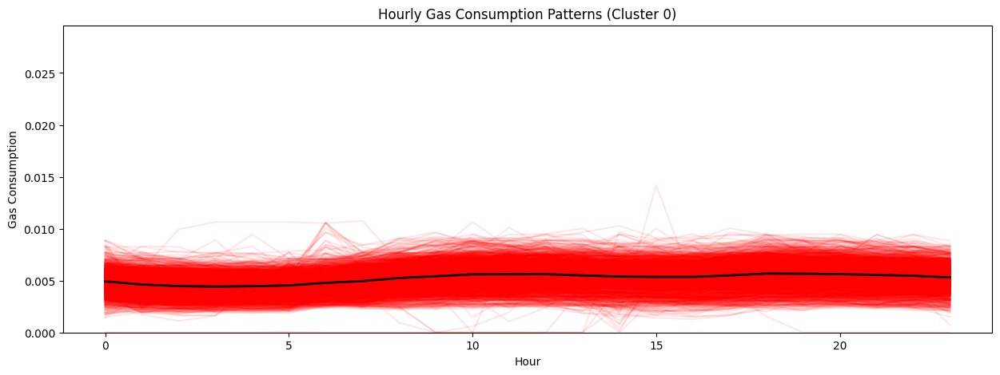

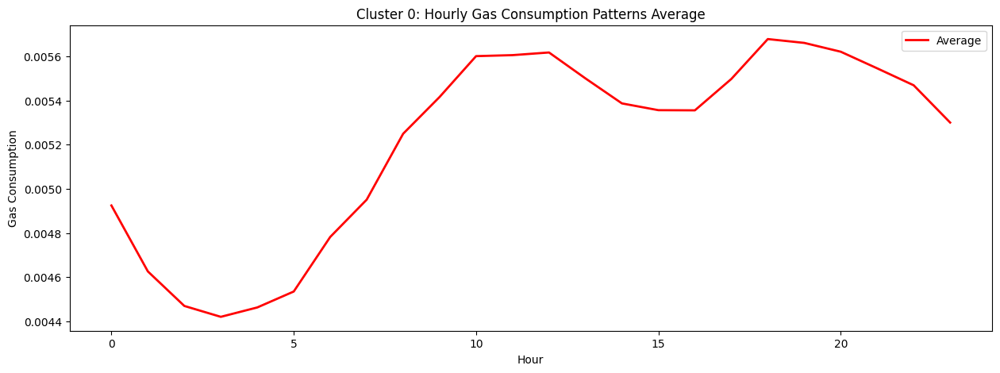

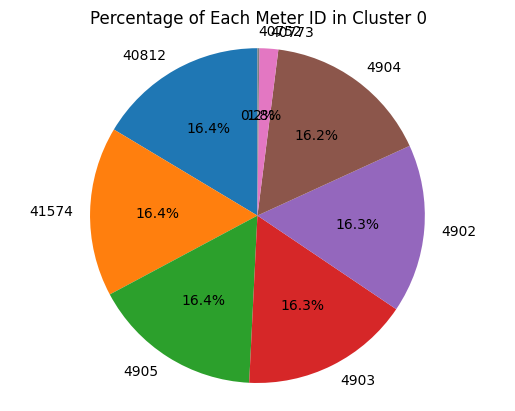

Percentages of each Meter ID in Cluster 0:
Meter ID 40812: 16.4%
Meter ID 41574: 16.4%
Meter ID 4905: 16.4%
Meter ID 4903: 16.3%
Meter ID 4902: 16.3%
Meter ID 4904: 16.2%
Meter ID 40773: 1.8%
Meter ID 40752: 0.2%
Average hourly gas consumption in Cluster 0:
Hour hour_0: 0.00492
Hour hour_1: 0.00463
Hour hour_2: 0.00447
Hour hour_3: 0.00442
Hour hour_4: 0.00446
Hour hour_5: 0.00453
Hour hour_6: 0.00478
Hour hour_7: 0.00495
Hour hour_8: 0.00525
Hour hour_9: 0.00542
Hour hour_10: 0.00560
Hour hour_11: 0.00561
Hour hour_12: 0.00562
Hour hour_13: 0.00550
Hour hour_14: 0.00539
Hour hour_15: 0.00536
Hour hour_16: 0.00536
Hour hour_17: 0.00550
Hour hour_18: 0.00568
Hour hour_19: 0.00566
Hour hour_20: 0.00562
Hour hour_21: 0.00555
Hour hour_22: 0.00547
Hour hour_23: 0.00530
Cluster 1: Count=516, Average=inf


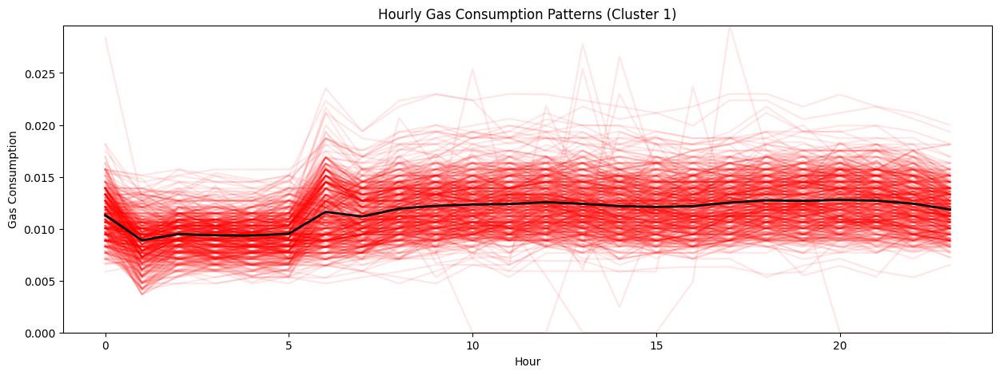

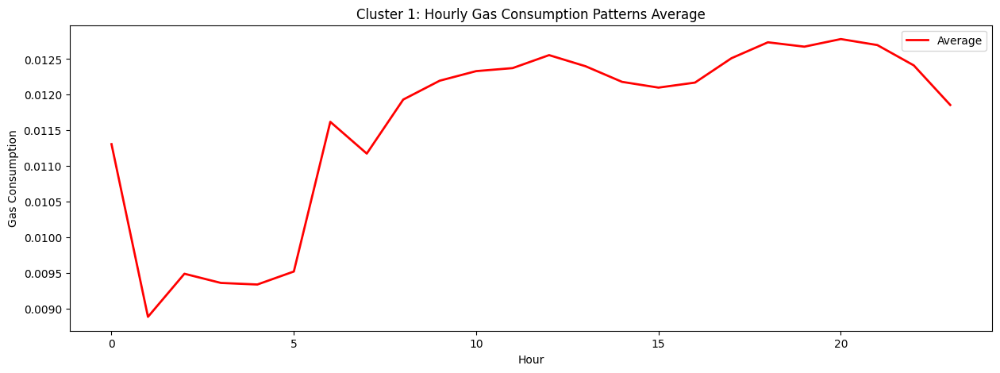

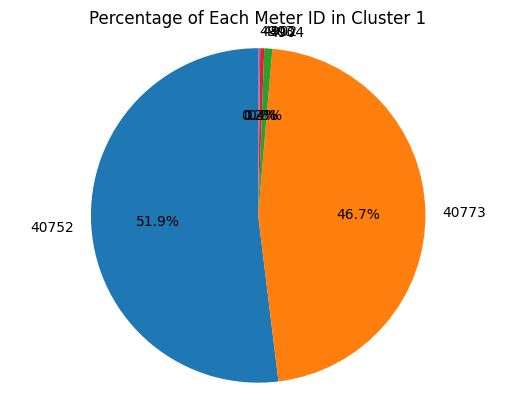

Percentages of each Meter ID in Cluster 1:
Meter ID 40752: 51.9%
Meter ID 40773: 46.7%
Meter ID 4904: 0.8%
Meter ID 4902: 0.4%
Meter ID 4903: 0.2%
Average hourly gas consumption in Cluster 1:
Hour hour_0: 0.01131
Hour hour_1: 0.00888
Hour hour_2: 0.00949
Hour hour_3: 0.00936
Hour hour_4: 0.00934
Hour hour_5: 0.00952
Hour hour_6: 0.01162
Hour hour_7: 0.01117
Hour hour_8: 0.01193
Hour hour_9: 0.01220
Hour hour_10: 0.01233
Hour hour_11: 0.01237
Hour hour_12: 0.01256
Hour hour_13: 0.01240
Hour hour_14: 0.01218
Hour hour_15: 0.01210
Hour hour_16: 0.01217
Hour hour_17: 0.01251
Hour hour_18: 0.01274
Hour hour_19: 0.01267
Hour hour_20: 0.01278
Hour hour_21: 0.01270
Hour hour_22: 0.01241
Hour hour_23: 0.01186


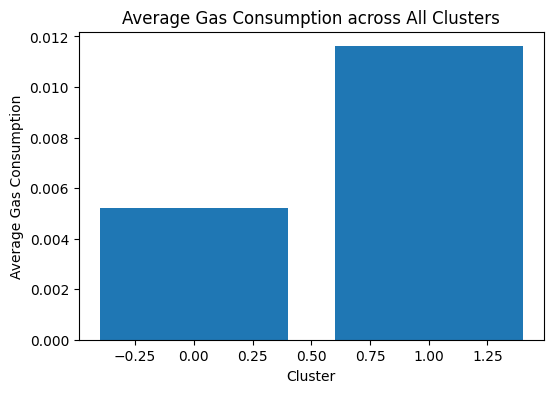

In [30]:
# Call the plotting function
plot_cluster_data(cluster_groups_winter_months_scaled)

Cluster 0: Count=1652, Average=inf
Cluster 1: Count=516, Average=inf


c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:17: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  app.launch_new_instance()


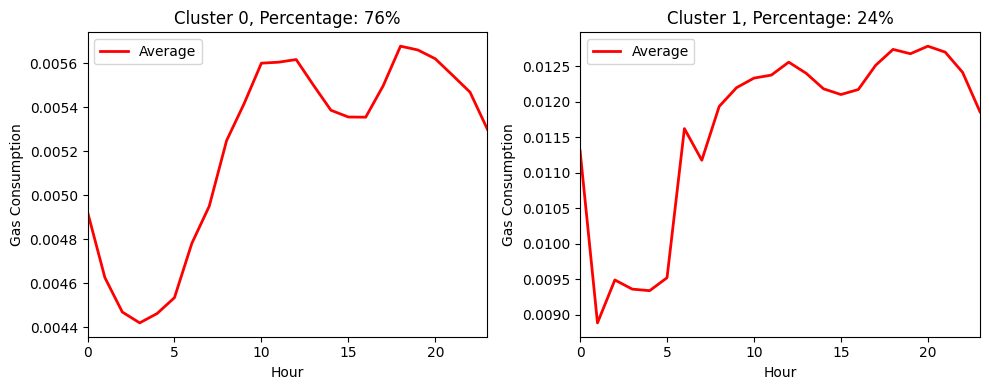

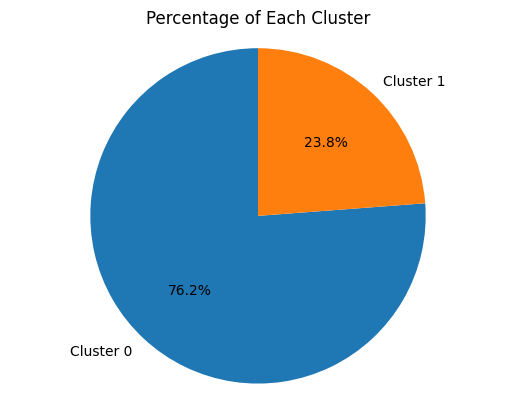

In [23]:
plot_cluster_data_avg(cluster_groups_winter_months_scaled)

c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:17: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  app.launch_new_instance()


Cluster 0: Count=862, Average=inf
Cluster 1: Count=2344, Average=inf
Cluster 2: Count=1890, Average=inf


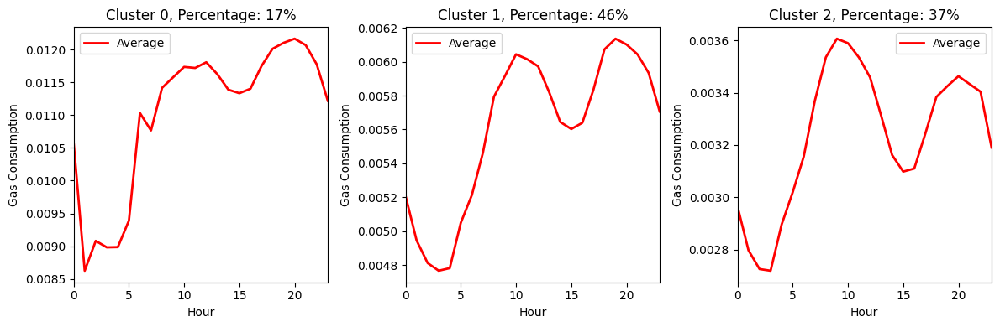

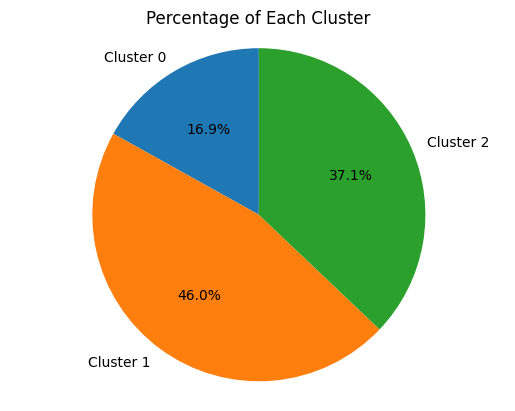

In [23]:
plot_cluster_data_avg(cluster_groups_heating_months_scaled)

c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:17: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  app.launch_new_instance()


Cluster 0: Count=3628, Average=inf
Cluster 1: Count=4251, Average=inf
Cluster 2: Count=889, Average=inf


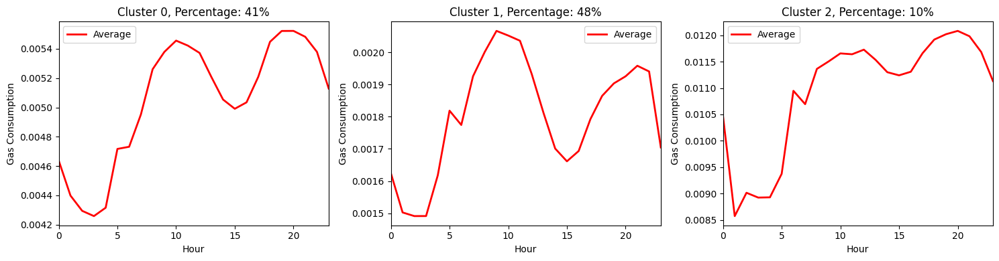

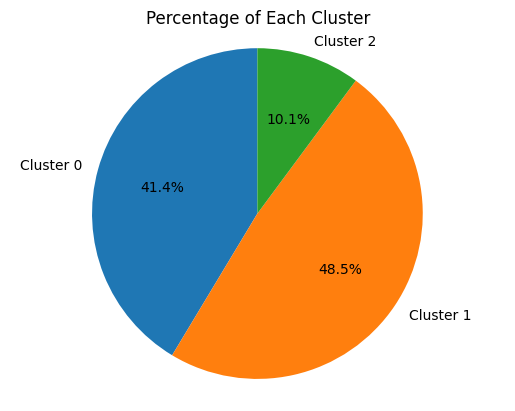

In [16]:
plot_cluster_data_avg(cluster_groups_scaled)

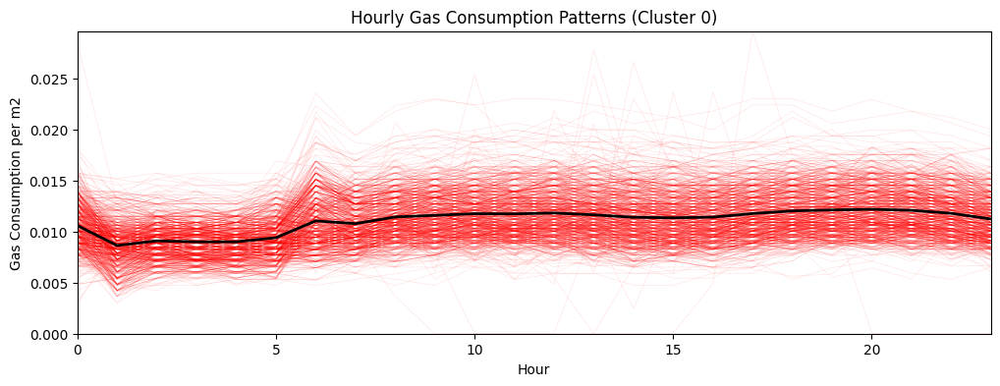

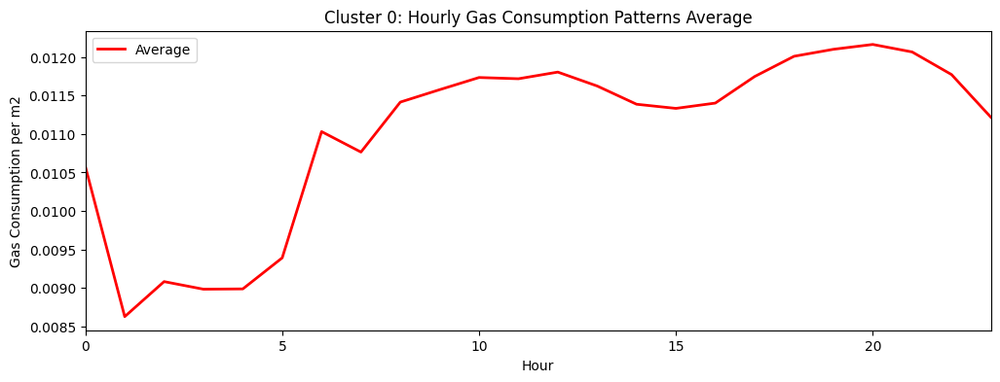

Cluster 0:
Meter ID 40752: Count=491, Percentage=57.0%
Meter ID 40773: Count=363, Percentage=42.1%
Meter ID 4904: Count=5, Percentage=0.6%
Meter ID 4902: Count=2, Percentage=0.2%
Meter ID 4903: Count=1, Percentage=0.1%


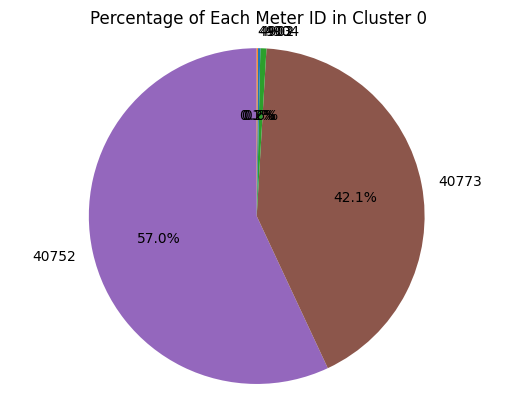

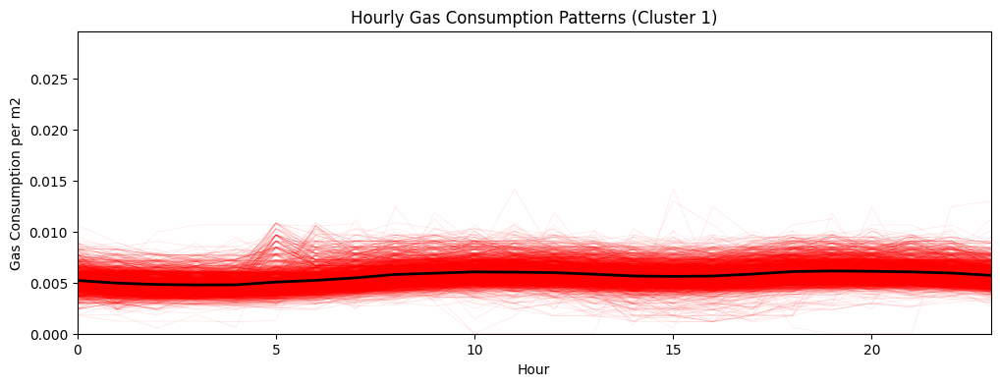

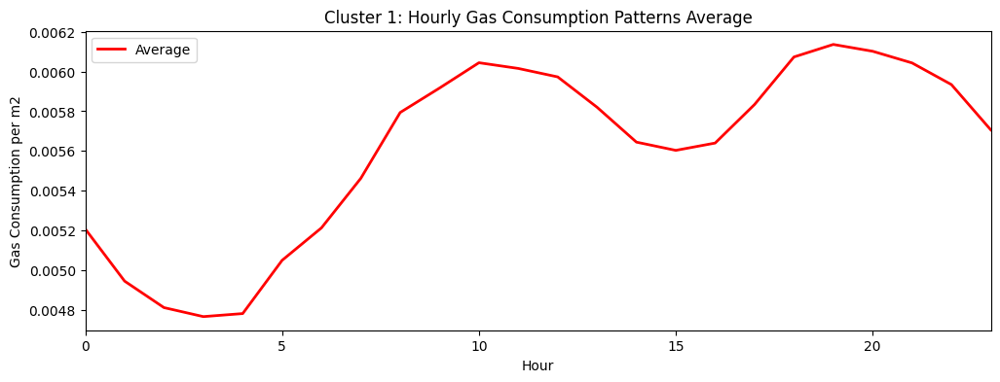

Cluster 1:
Meter ID 4905: Count=452, Percentage=19.3%
Meter ID 4904: Count=421, Percentage=18.0%
Meter ID 4903: Count=403, Percentage=17.2%
Meter ID 4902: Count=328, Percentage=14.0%
Meter ID 40812: Count=271, Percentage=11.6%
Meter ID 40773: Count=234, Percentage=10.0%
Meter ID 40752: Count=146, Percentage=6.2%
Meter ID 41574: Count=89, Percentage=3.8%


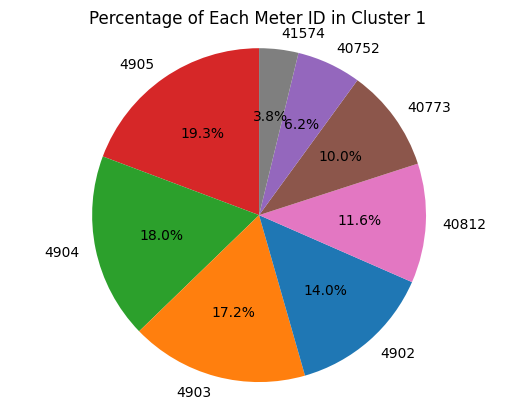

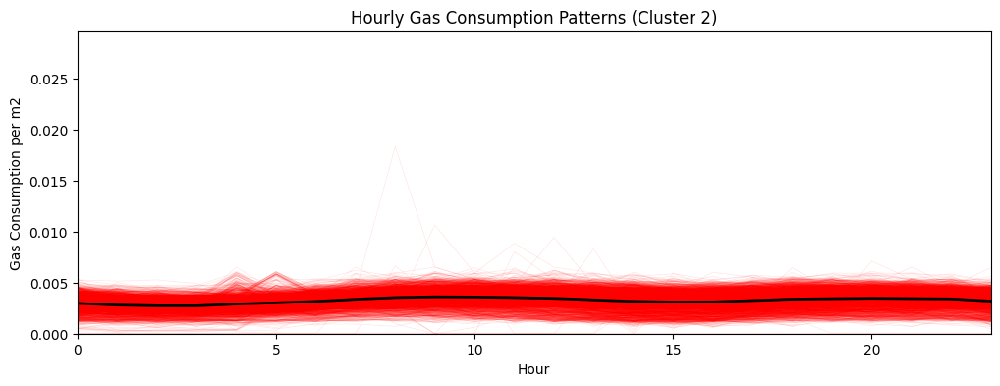

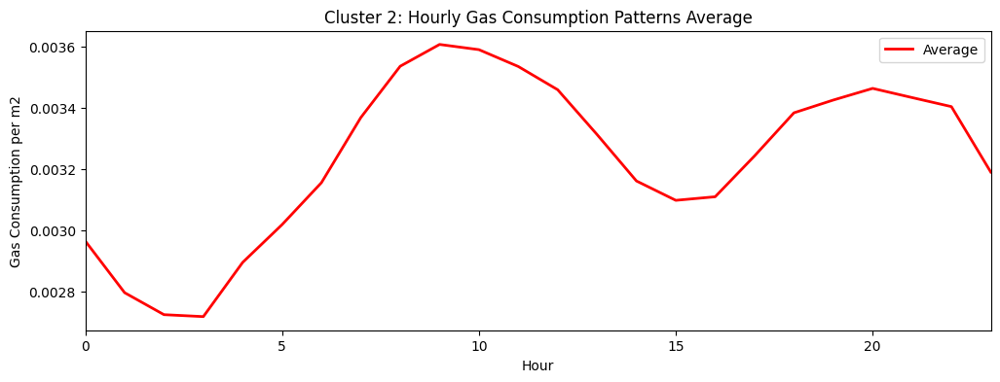

Cluster 2:
Meter ID 41574: Count=548, Percentage=29.0%
Meter ID 40812: Count=366, Percentage=19.4%
Meter ID 4902: Count=307, Percentage=16.2%
Meter ID 4903: Count=233, Percentage=12.3%
Meter ID 4904: Count=211, Percentage=11.2%
Meter ID 4905: Count=185, Percentage=9.8%
Meter ID 40773: Count=40, Percentage=2.1%


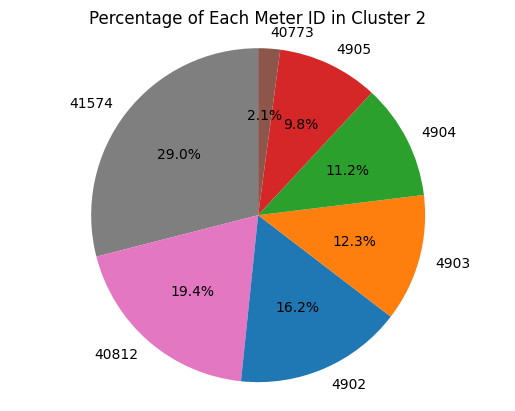

Index(['hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6',
       'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12',
       'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18',
       'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'meter_id',
       'date'],
      dtype='object')
{0: 0.011022154664776277, 1: 0.005604872002566999, 2: 0.0032330299742066096}


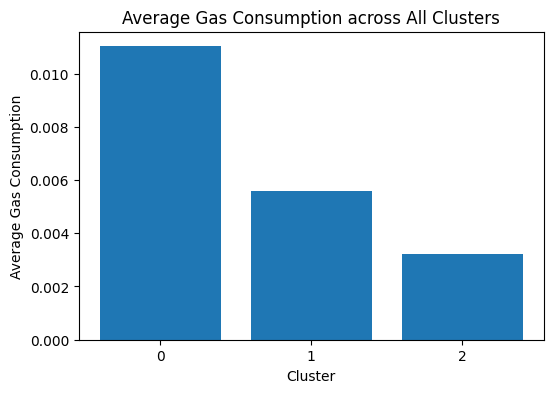

dict_keys([0, 1, 2]) consumptions: dict_values([0.011022154664776277, 0.005604872002566999, 0.0032330299742066096])
Cluster 0: 16.9% of Total Clusters
Cluster 1: 46.0% of Total Clusters
Cluster 2: 37.1% of Total Clusters


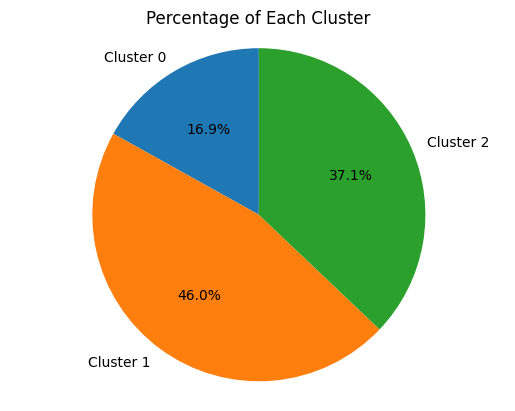

In [13]:
plot_cluster_data_elbow(cluster_groups_heating_months_scaled)

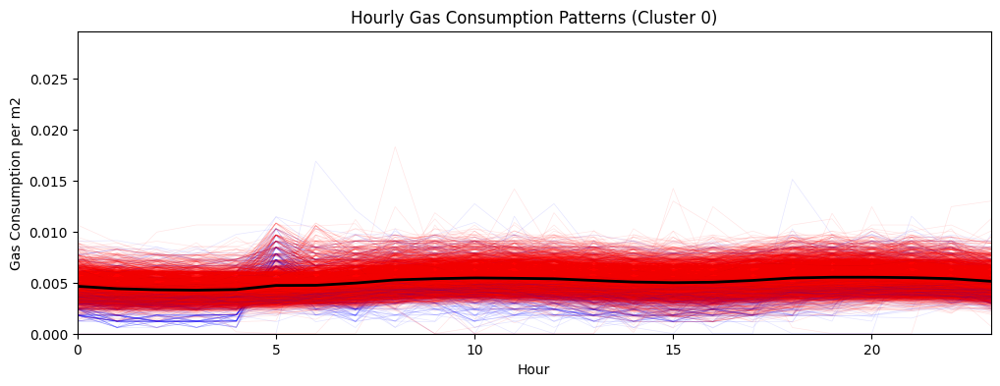

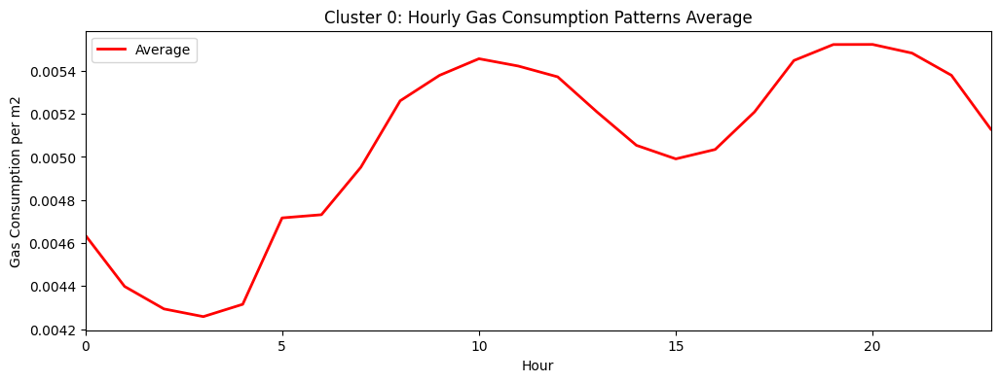

Cluster 0:
Meter ID 4905: Count=615, Percentage=17.0%
Meter ID 4904: Count=522, Percentage=14.4%
Meter ID 4903: Count=508, Percentage=14.0%
Meter ID 40812: Count=482, Percentage=13.3%
Meter ID 4902: Count=455, Percentage=12.5%
Meter ID 40752: Count=353, Percentage=9.7%
Meter ID 40773: Count=351, Percentage=9.7%
Meter ID 41574: Count=342, Percentage=9.4%


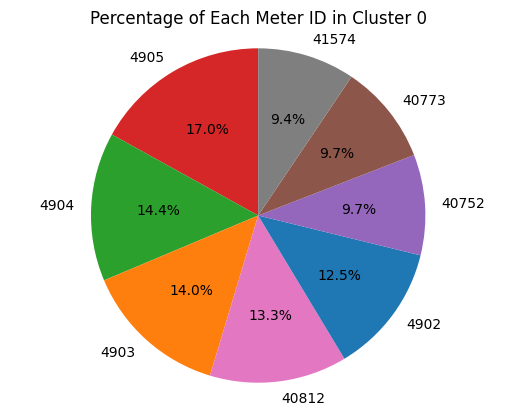

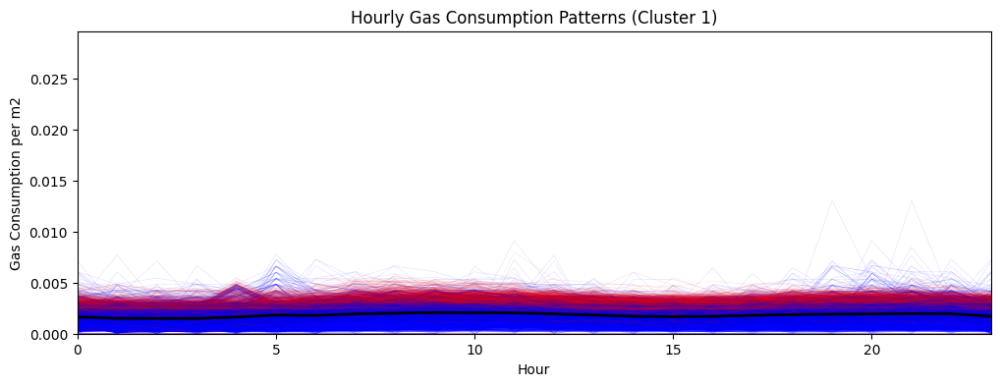

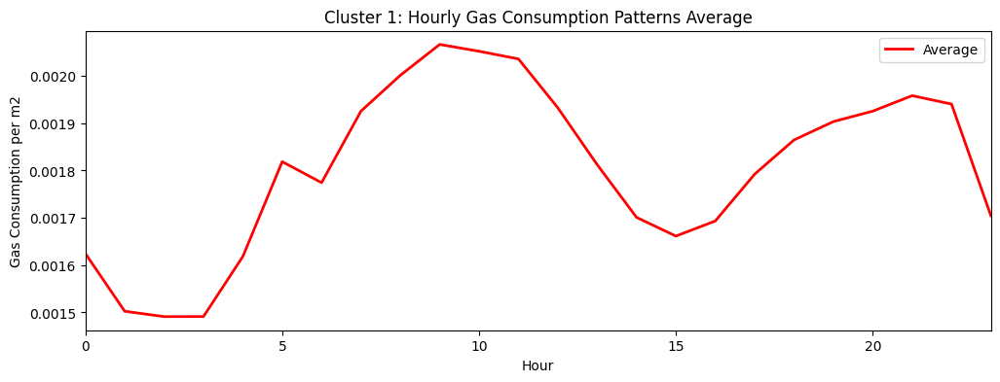

Cluster 1:
Meter ID 41574: Count=754, Percentage=17.7%
Meter ID 4902: Count=639, Percentage=15.0%
Meter ID 40812: Count=614, Percentage=14.4%
Meter ID 4903: Count=587, Percentage=13.8%
Meter ID 4904: Count=568, Percentage=13.4%
Meter ID 4905: Count=481, Percentage=11.3%
Meter ID 40773: Count=374, Percentage=8.8%
Meter ID 40752: Count=234, Percentage=5.5%


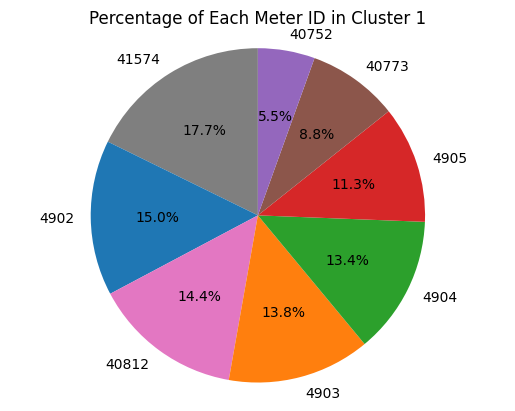

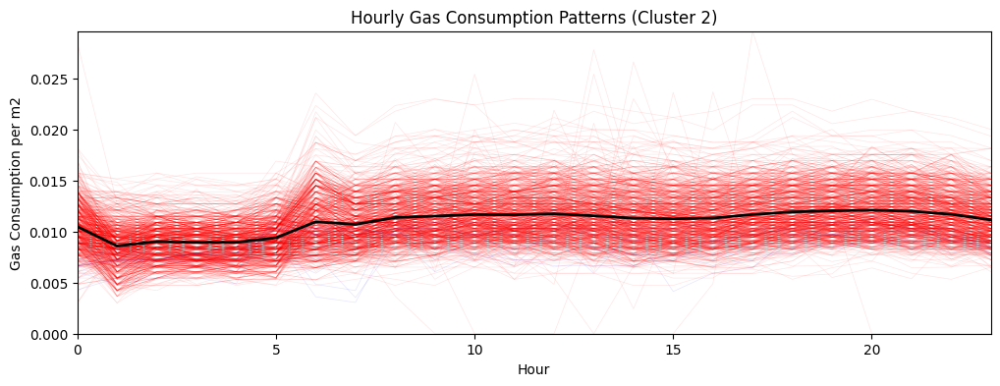

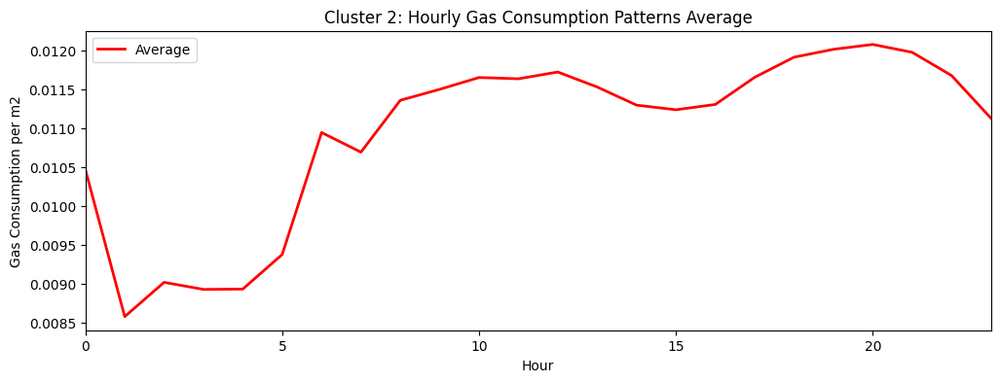

Cluster 2:
Meter ID 40752: Count=509, Percentage=57.3%
Meter ID 40773: Count=371, Percentage=41.7%
Meter ID 4904: Count=6, Percentage=0.7%
Meter ID 4902: Count=2, Percentage=0.2%
Meter ID 4903: Count=1, Percentage=0.1%


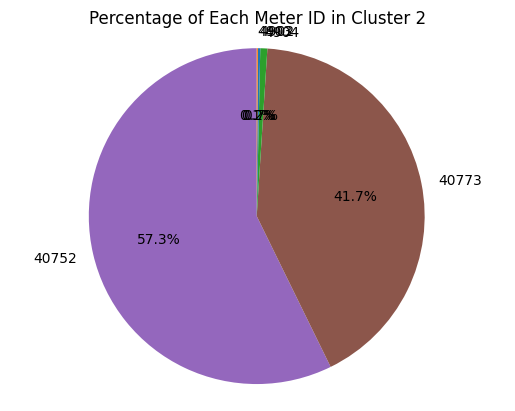

Index(['hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6',
       'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12',
       'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18',
       'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'meter_id',
       'date'],
      dtype='object')
{0: 0.005048863031728321, 1: 0.0018037809533026656, 2: 0.010944424798230351}


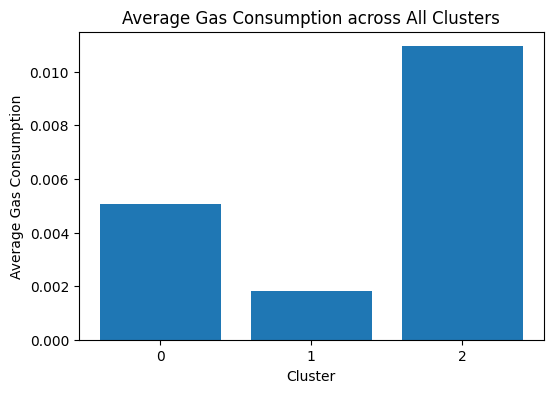

dict_keys([0, 1, 2]) consumptions: dict_values([0.005048863031728321, 0.0018037809533026656, 0.010944424798230351])
Cluster 0: 41.4% of Total Clusters
Cluster 1: 48.5% of Total Clusters
Cluster 2: 10.1% of Total Clusters


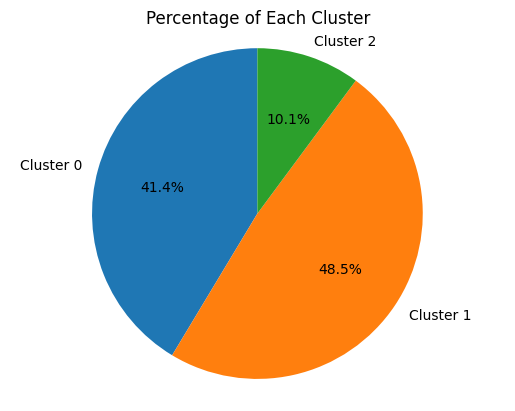

In [47]:
plot_cluster_data_elbow(cluster_groups_scaled)

In [142]:
def plot_cluster_comparison1(cluster_groups1: Dict[int, pd.DataFrame], cluster_groups2: Dict[int, pd.DataFrame]):
    
    cluster_averages1 = {}
    
    for i, cluster_group in cluster_groups1.items():
        
        # Store the average consumption for this cluster
        cluster_averages1[i] = cluster_group.drop(columns=['date', 'meter_id']).mean()
        
    cluster_averages2 = {}
    
    for i, cluster_group in cluster_groups2.items():
        
        # Store the average consumption for this cluster
        cluster_averages2[i] = cluster_group.drop(columns=['date', 'meter_id']).mean()
        
    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours

    for cluster_id in cluster_averages1.keys():
        # Create a new figure for each cluster
        fig, ax = plt.subplots(figsize=(12, 4))

        # Compute percentage differences for each hour
        percent_diff = (cluster_averages2[cluster_id] - cluster_averages1[cluster_id]) / cluster_averages2[cluster_id] * 100

        # Plot the percentage differences
        ax.plot(x_axis_values, percent_diff, color='green', label='Percentage Difference')

        ax.set_xlabel("Hour")
        ax.set_ylabel("Percentage Difference (%)")
        ax.set_title(f"Percentage Difference in Average Gas Consumption for Cluster {cluster_id}")
        ax.legend()

        plt.show()


In [136]:

def plot_cluster_comparison(cluster_groups1: Dict[int, pd.DataFrame], cluster_groups2: Dict[int, pd.DataFrame]):
    
    cluster_averages1 = {}
    
    for i, cluster_group in cluster_groups1.items():
        
        # Store the average consumption for this cluster
        cluster_averages1[i] = cluster_group.drop(columns=['date', 'meter_id']).mean()
        
    cluster_averages2 = {}
    
    for i, cluster_group in cluster_groups2.items():
        
        # Store the average consumption for this cluster
        cluster_averages2[i] = cluster_group.drop(columns=['date', 'meter_id']).mean()
        
    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours\

    for cluster_id in cluster_averages1.keys():
        # Create a new figure for each cluster
        fig, ax = plt.subplots(figsize=(12, 4))

        # Plot the average consumption for each cluster
        ax.plot(np.arange(24), cluster_averages1[cluster_id], label='Without hot tap water consumption', color='blue')
        ax.plot(np.arange(24), cluster_averages2[cluster_id], label='With hot tap water consumption', color='red')

        # Highlight the difference between the two groups
        ax.fill_between(np.arange(24), cluster_averages1[cluster_id], cluster_averages2[cluster_id], color='gray', alpha=0.5)

        ax.set_xlabel("Hour")
        ax.set_ylabel("Average Gas Consumption")
        ax.set_title(f"Comparison of Cluster {cluster_id}")
        ax.legend()

        plt.show()


    

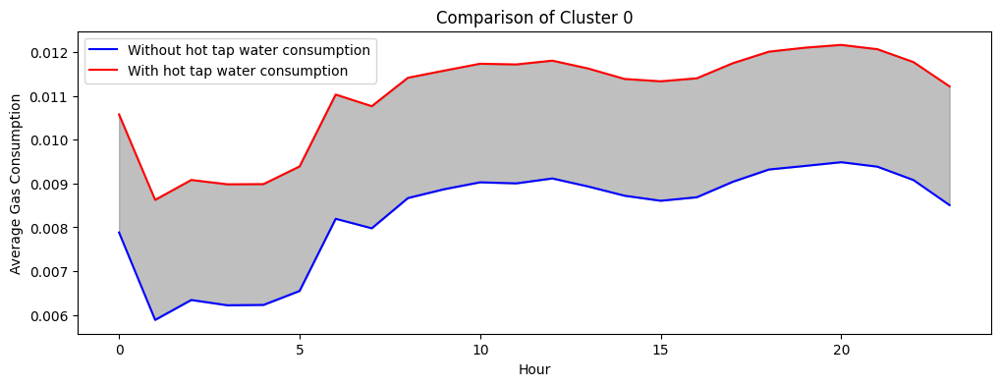

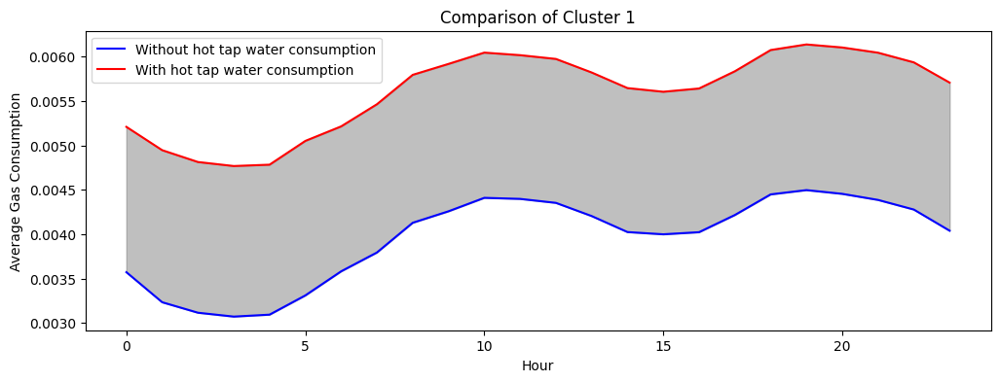

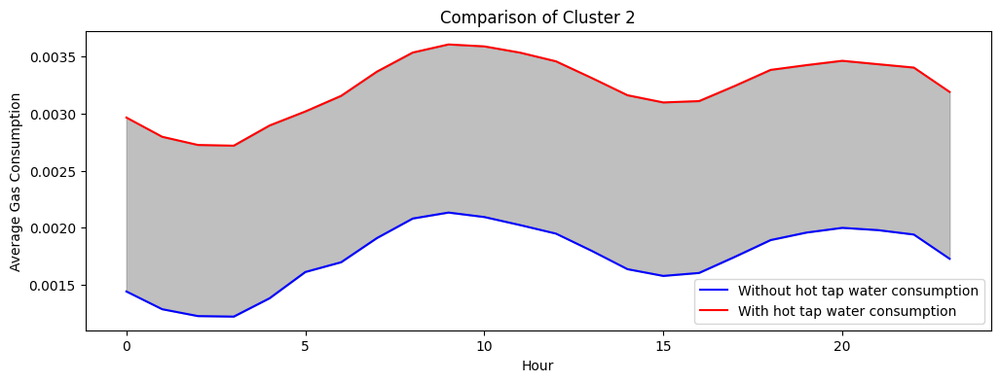

In [137]:
plot_cluster_comparison(cluster_groups_heating_months_scaled_subtracted, cluster_groups_heating_months_scaled)

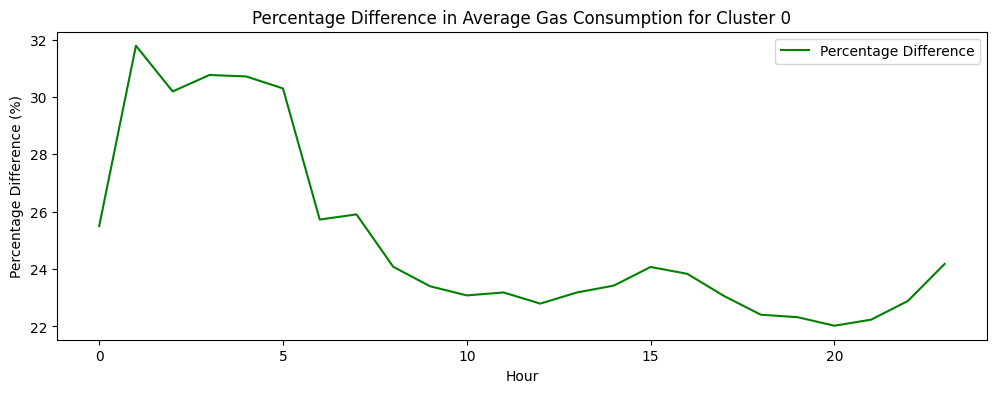

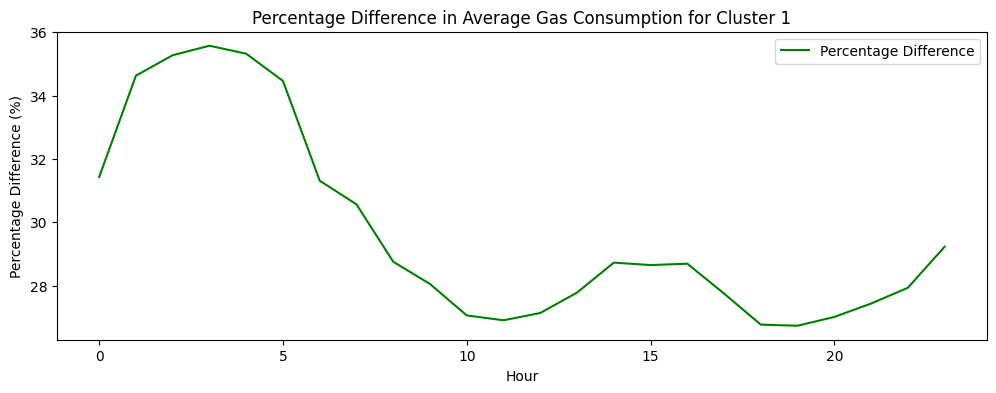

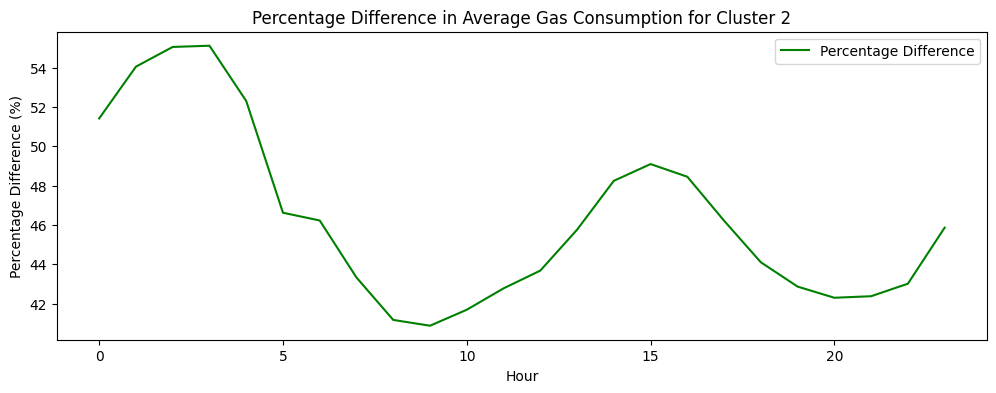

In [143]:
plot_cluster_comparison1(cluster_groups_heating_months_scaled_subtracted, cluster_groups_heating_months_scaled)

In [119]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt

# Define a color for each meter ID
colors_dict = {
    4902: 'C0',  # blue
    4903: 'C1',  # orange
    4904: 'C2',  # green
    4905: 'C3',  # red
    40752: 'C4',  # purple
    40773: 'C5',  # brown
    40812: 'C6',  # pink
    41574: 'C7',  # gray
}

# cluster_groups_heating_months_scaled_subtracted, address: inet-building-clustering-result-elbow_heating_months_scaled_subtracted
# cluster_groups_heating_months_scaled, address: inet-building-clustering-result-elbow_heating_months_scaled_3years

def plot_cluster_data_only_heating_months(cluster_groups: Dict[int, pd.DataFrame], address):
    # Find the global maximum and minimum gas consumption values across all clusters
    global_max = max(cluster_group.drop(columns=['date', 'meter_id']).max().max() for cluster_group in cluster_groups.values())
    global_min = min(cluster_group.drop(columns=['date', 'meter_id']).min().min() for cluster_group in cluster_groups.values())

    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    cluster_averages = {}
    cluster_counts = []  # List to store the counts of each cluster
    n_clusters = len(cluster_groups.keys())
           
    for i, cluster_group in cluster_groups.items():
        cluster_data = cluster_group
        cluster_counts.append(len(cluster_group))  # Add the count of the current cluster to the list
        
        fig, ax = plt.subplots(figsize=(12, 4))
        
        for index, row in cluster_group.drop(columns=['date', 'meter_id']).iterrows():
            # Get the color based on the heating months mask
            color = 'red' 
            ax.plot(x_axis_values, row.values, color=color, alpha=0.1, label=None)

        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
        ax.plot(x_axis_values, cluster_average, color='black', linewidth=2, label='Average')

        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_title(f"Hourly Gas Consumption Patterns (Cluster {i})")

        # Set the y-axis limits to the global maximum and minimum values
        ax.set_ylim(global_min, global_max)
        ax.set_xlim(0, 23)
        plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\{address}\\Cluster_{i}.png")
        plt.show()

        fig, ax = plt.subplots(figsize=(12, 4))
        ax.plot(x_axis_values, cluster_average, color='red', linewidth=2, label='Average')
        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_xlim(0, 23)
        ax.set_title(f"Cluster {i}: Hourly Gas Consumption Patterns Average")
        ax.legend()
        
        # Save the image to a specified location
        plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\{address}\\avg_Cluster_{i}.png")
        plt.show()

        # Create a pie chart for the count of meter_id in the current cluster
        meter_counts = cluster_group['meter_id'].value_counts()

        # Get the colors for the meter_ids in this cluster
        colors = [colors_dict[int(meter_id)] for meter_id in meter_counts.index]

        fig, ax = plt.subplots()
        ax.pie(meter_counts, labels=meter_counts.index, colors=colors, autopct='%1.1f%%', startangle=90)
        ax.set_title(f"Percentage of Each Meter ID in Cluster {i}")
        plt.axis('equal')
        plt.show()

        
#         # Print out the percentage of each meter id in each cluster
#         meter_counts = cluster_group['meter_id'].value_counts()
#         meter_percentages = meter_counts / len(cluster_group) * 100
#         print(f'Percentages of each Meter ID in Cluster {i}:')
#         for meter_id, percentage in meter_percentages.items():
#             print(f'Meter ID {meter_id}: {percentage:.1f}%')
        
        # Print the averaged hourly data consumption for each cluster
        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
#         print(f'Average hourly gas consumption in Cluster {i}:')
#         for hour, avg_consumption in cluster_average.items():
#             print(f'Hour {hour}: {avg_consumption:.5f}')
            
        # Store the average consumption for this cluster
        cluster_averages[i] = cluster_group.drop(columns=['date', 'meter_id']).mean().mean()

    # Create the overall average consumption plot across all clusters
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.bar(cluster_averages.keys(), cluster_averages.values())
    ax.set_xlabel("Cluster")
    ax.set_ylabel("Average Gas Consumption")
    ax.set_title("Average Gas Consumption across All Clusters")
    plt.show()
    
    # Create the pie chart
    fig, ax = plt.subplots()
    ax.pie(cluster_counts, labels=[f'Cluster {i}' for i in range(n_clusters)], autopct='%1.1f%%', startangle=90)
    ax.set_title('Percentage of Each Cluster')
    plt.axis('equal')
    plt.show()
    

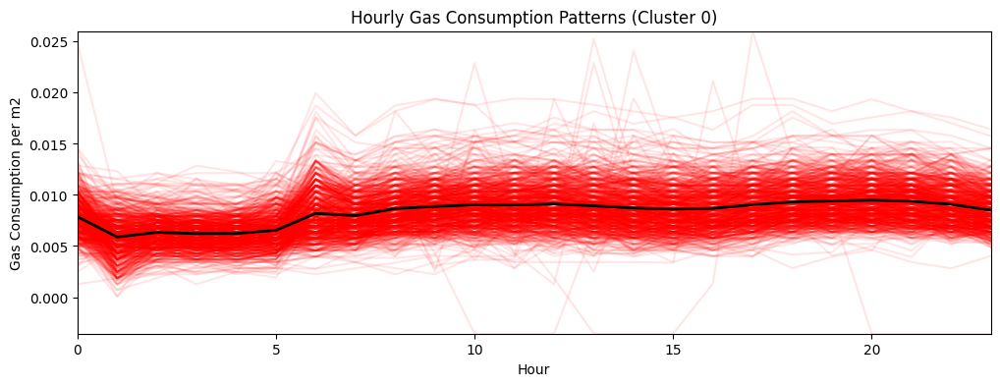

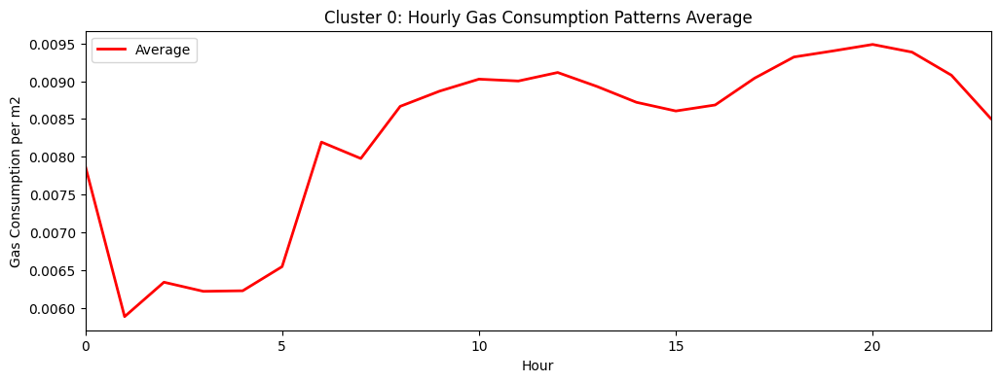

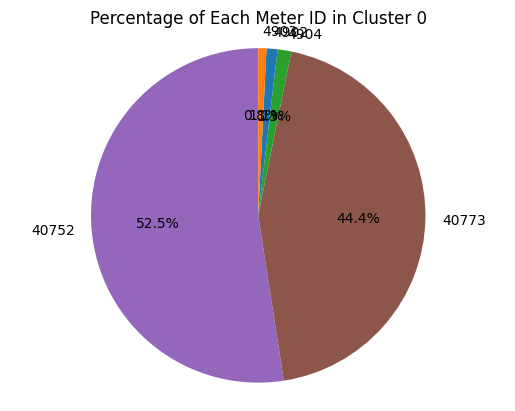

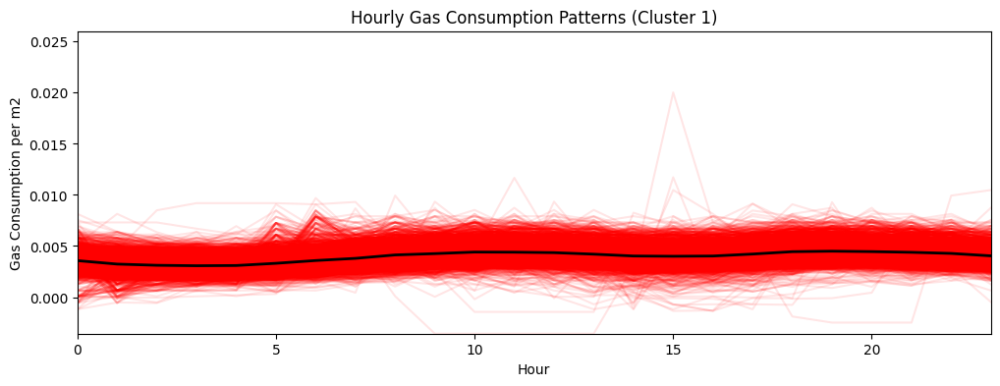

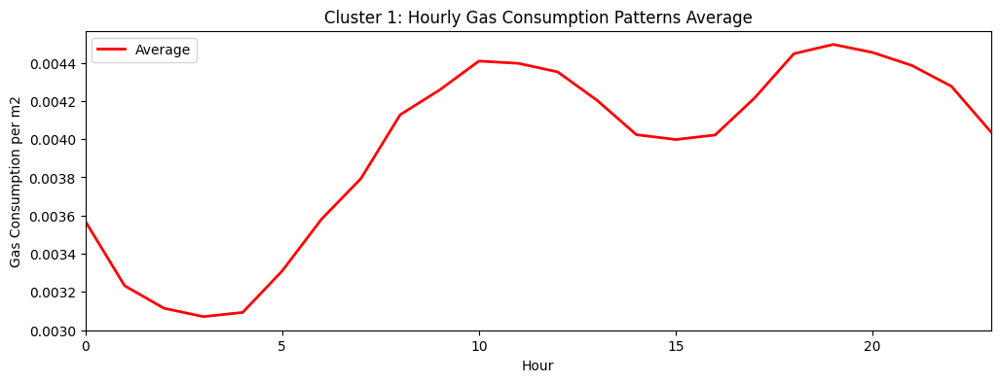

...

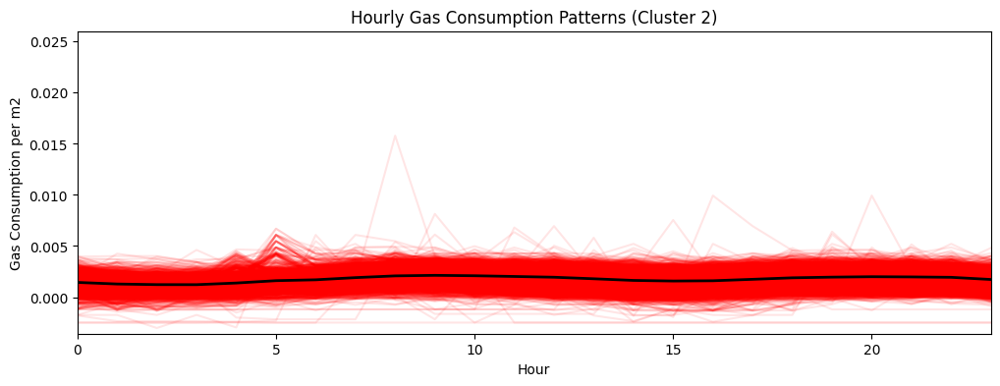

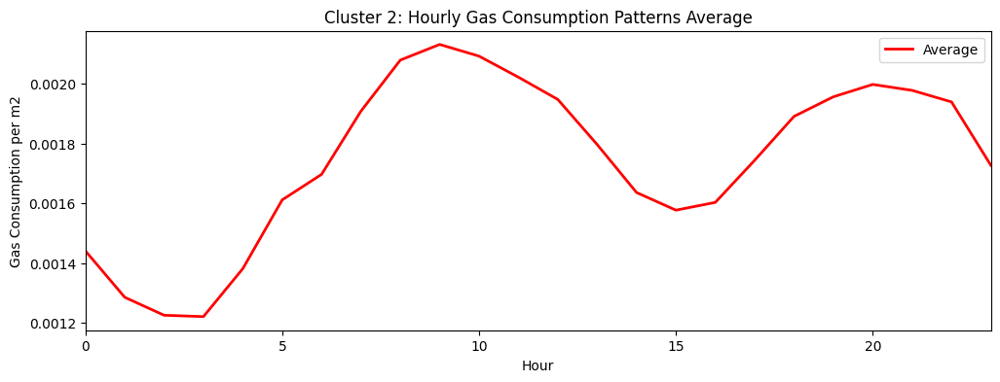

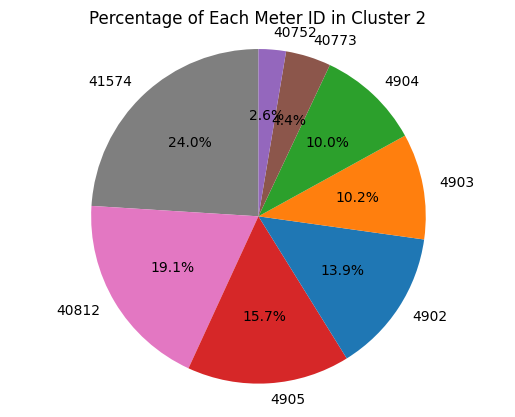

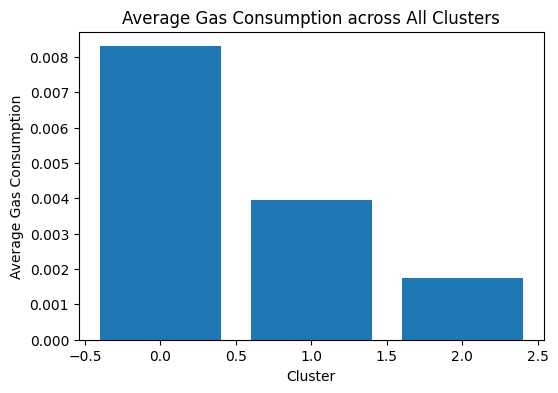

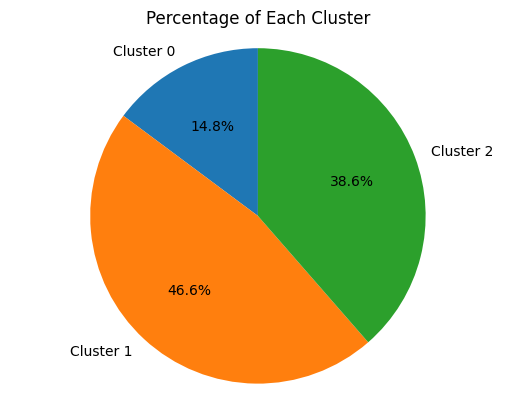

In [121]:
plot_cluster_data_only_heating_months(cluster_groups_heating_months_scaled_subtracted, address='inet-building-clustering-result-elbow_heating_months_scaled_subtracted')

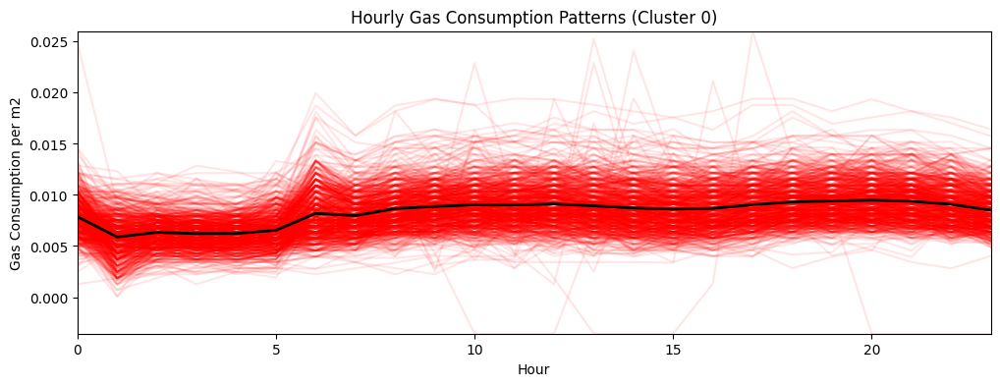

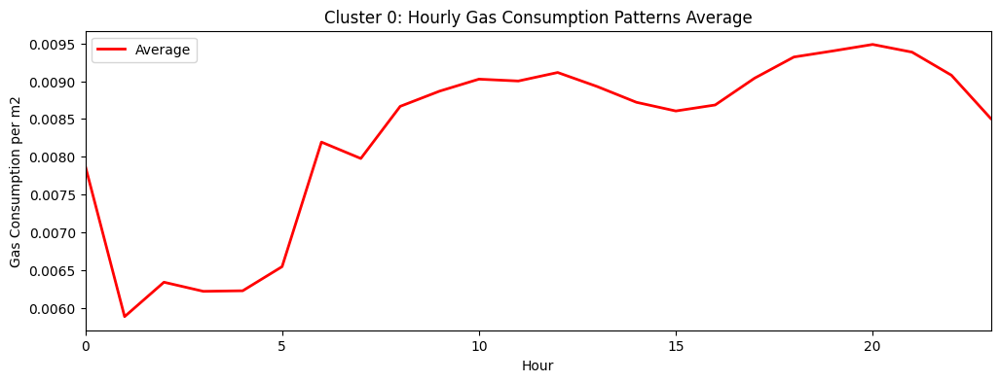

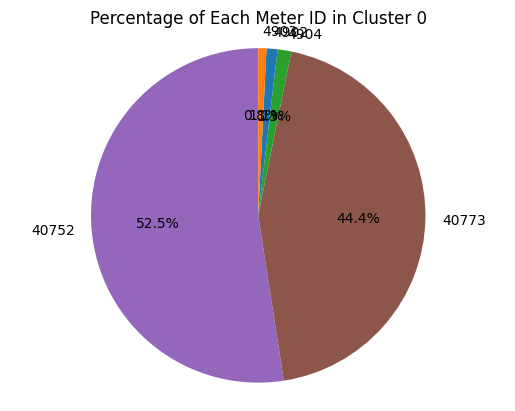

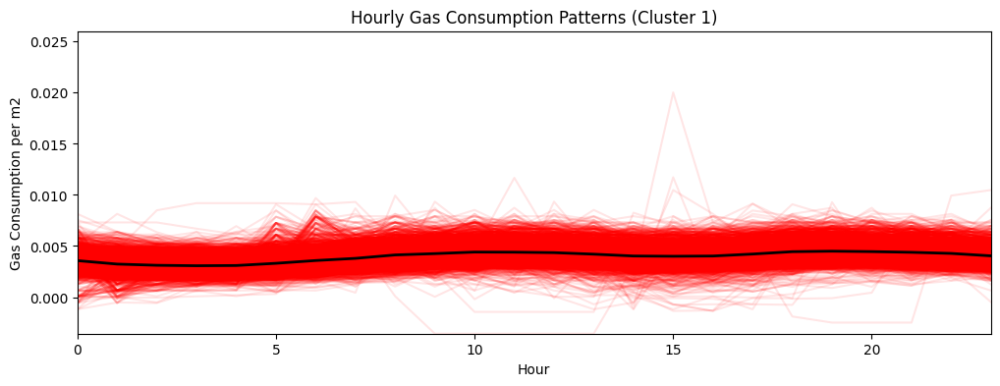

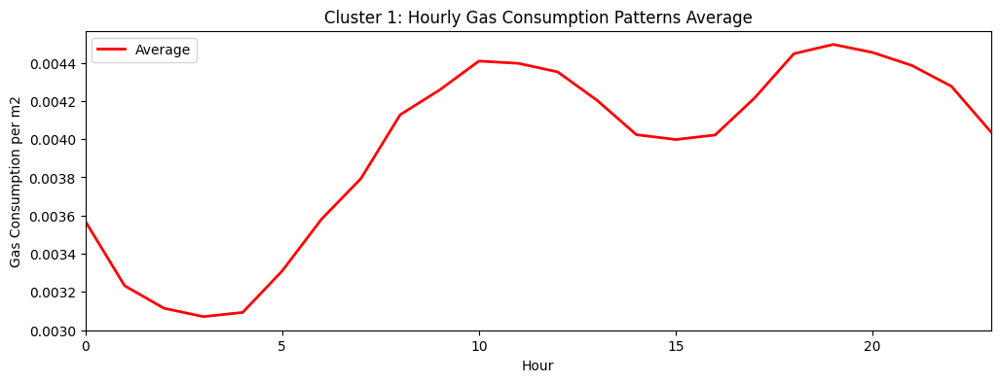

...

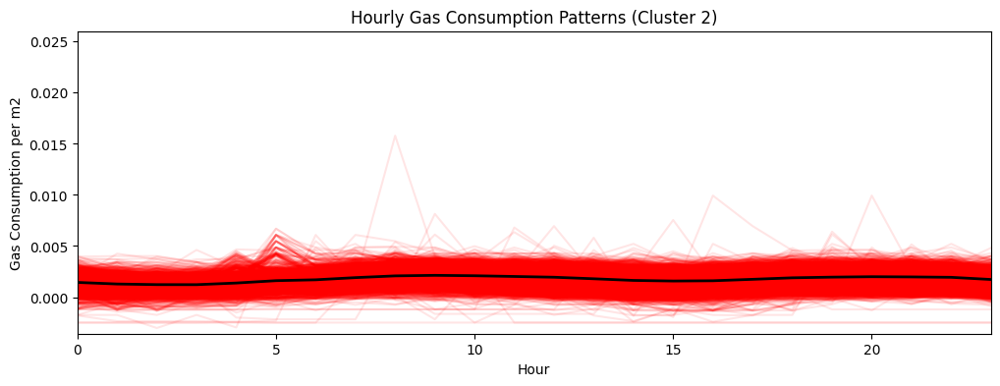

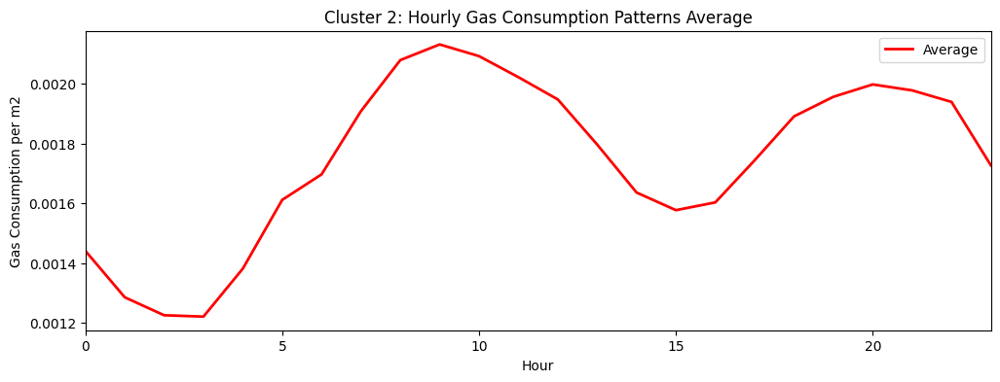

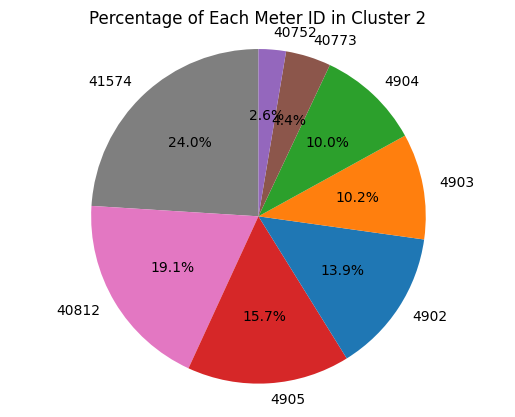

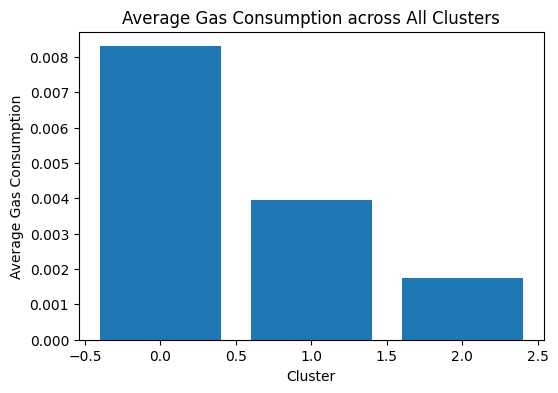

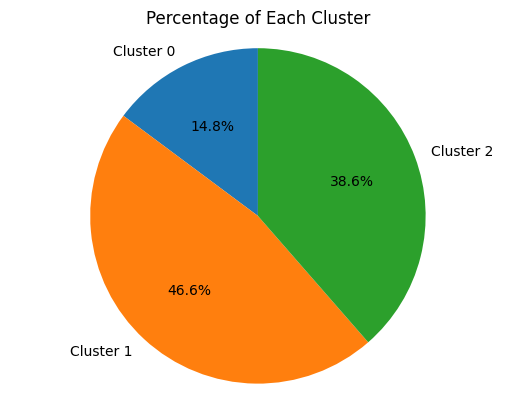

In [120]:
plot_cluster_data_only_heating_months(cluster_groups_heating_months_scaled_subtracted, address='inet-building-clustering-result-elbow_heating_months_scaled_3years')

In [6]:
from tslearn.clustering import TimeSeriesKMeans
def analyze_and_plot_daily_meter_data_kmeans_optimalk(gas_data, optimal_k):
    # Pivot the gas_data
    gas_data_copy = gas_data.copy()
    gas_data_copy['meter_id'] = gas_data_copy['meter_id'].map(str)
    gas_data_pivot = gas_data_copy.pivot_table(index='datetime', columns='meter_id', values='value', aggfunc='mean')
    
    # Preprocess data: Average values across all meter ids and group by date and hour
    data = gas_data_pivot.copy()
    data.index = pd.to_datetime(data.index, utc=True)
    data_daily_grouped = data.groupby([data.index.date, data.index.hour]).mean()
    data_daily_grouped.index.names = ['date', 'hour']
    data_daily_unstacked = data_daily_grouped.unstack(level=-2).transpose()
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked['meter_date'] = data_daily_unstacked['meter_id'].astype(str) + '_' + data_daily_unstacked['date'].astype(str)
    data_daily_unstacked = data_daily_unstacked.drop(columns=['meter_id','date'])
    data_daily_unstacked.set_index('meter_date', inplace=True)

    data_daily_unstacked.columns = [f'hour_{i}' for i in range(24)]
    # Prepare data for Time Series K-Means
    data_prepared = data_daily_unstacked.to_numpy().reshape((data_daily_unstacked.shape[0], -1, 1))

    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Convert index to two separate columns
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked[['meter_id', 'date']] = data_daily_unstacked['meter_date'].str.split('_', expand=True)
    data_daily_unstacked.drop(columns='meter_date', inplace=True)
    data_daily_unstacked['date'] = pd.to_datetime(data_daily_unstacked['date'])

    # Group data by cluster
    cluster_groups = {}
    for cluster in range(optimal_k):
        cluster_data = data_daily_unstacked[cluster_labels == cluster]
        cluster_groups[cluster] = cluster_data

    return cluster_groups, data_daily_unstacked

optimal_k_value = 8
cluster_group, data_daily_unstacked= analyze_and_plot_daily_meter_data_kmeans_optimalk(gas_data, optimal_k_value)

KeyboardInterrupt: 

## considering the area

In [7]:
from tslearn.clustering import TimeSeriesKMeans

def analyze_and_plot_daily_meter_data_kmeans_optimalk_scaled(gas_data, ids_and_area, optimal_k):
    # Copy gas_data and add area column
    gas_data_copy = gas_data.copy()
    gas_data_copy['area'] = gas_data_copy['meter_id'].map(ids_and_area)

    # Scale the value by the area
    gas_data_copy['value'] = gas_data_copy['value'] / gas_data_copy['area']

    # Pivot the gas_data
    gas_data_copy['meter_id'] = gas_data_copy['meter_id'].map(str)
    gas_data_pivot = gas_data_copy.pivot_table(index='datetime', columns='meter_id', values='value', aggfunc='mean')

    # Preprocess data: Average values across all meter ids and group by date and hour
    data = gas_data_pivot.copy()
    data.index = pd.to_datetime(data.index, utc=True)
    data_daily_grouped = data.groupby([data.index.date, data.index.hour]).mean()
    data_daily_grouped.index.names = ['date', 'hour']
    data_daily_unstacked = data_daily_grouped.unstack(level=-2).transpose()
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked['meter_date'] = data_daily_unstacked['meter_id'].astype(str) + '_' + data_daily_unstacked['date'].astype(str)
    data_daily_unstacked = data_daily_unstacked.drop(columns=['meter_id','date'])
    data_daily_unstacked.set_index('meter_date', inplace=True)

    data_daily_unstacked.columns = [f'hour_{i}' for i in range(24)]
    # Prepare data for Time Series K-Means
    data_prepared = data_daily_unstacked.to_numpy().reshape((data_daily_unstacked.shape[0], -1, 1))

    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Convert index to two separate columns
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked[['meter_id', 'date']] = data_daily_unstacked['meter_date'].str.split('_', expand=True)
    data_daily_unstacked.drop(columns='meter_date', inplace=True)
    data_daily_unstacked['date'] = pd.to_datetime(data_daily_unstacked['date'])

    # Group data by cluster
    cluster_groups = {}
    for cluster in range(optimal_k):
        cluster_data = data_daily_unstacked[cluster_labels == cluster]
        cluster_groups[cluster] = cluster_data

    return cluster_groups



In [8]:
optimal_k_value = 3
cluster_group_scaled = analyze_and_plot_daily_meter_data_kmeans_optimalk_scaled(gas_data, ids_and_area, optimal_k_value)


In [9]:
cluster_group_scaled

{0:         hour_0    hour_1    hour_2    hour_3    hour_4    hour_5    hour_6  \
 95    0.009106  0.008440  0.009051  0.008495  0.008495  0.009661  0.008440   
 96    0.007274  0.006607  0.006052  0.006052  0.007274  0.009661  0.006052   
 97    0.007274  0.007885  0.007829  0.007274  0.007885  0.009661  0.007829   
 98    0.005441  0.005441  0.005441  0.005441  0.006052  0.008440  0.006663   
 99    0.006052  0.006052  0.006052  0.005441  0.006052  0.007218  0.006052   
 ...        ...       ...       ...       ...       ...       ...       ...   
 8763  0.004733  0.004211  0.004231  0.004057  0.004211  0.004057  0.004366   
 8764  0.004733  0.004385  0.004211  0.004057  0.004211  0.004211  0.004037   
 8765  0.004385  0.004231  0.004037  0.003709  0.003883  0.003690  0.004037   
 8766  0.004385  0.004559  0.004366  0.004385  0.004211  0.004366  0.004714   
 8767  0.004037  0.004231  0.004037  0.003554  0.003535  0.003535  0.003535   
 
         hour_7    hour_8    hour_9  ...   hour

In [13]:
optimal_k_value = 8
cluster_group_scaled = analyze_and_plot_daily_meter_data_kmeans_optimalk_scaled(gas_data, ids_and_area, optimal_k_value)


## Elbow method

In [6]:
from tslearn.clustering import TimeSeriesKMeans
from kneed import KneeLocator
from tslearn.clustering import TimeSeriesKMeans

def analyze_and_plot_daily_meter_data_kmeans_scaled(gas_data, ids_and_area):
    # Copy gas_data and add area column
    gas_data_copy = gas_data.copy()
    gas_data_copy['area'] = gas_data_copy['meter_id'].map(ids_and_area)

    # Scale the value by the area
    gas_data_copy['value'] = gas_data_copy['value'] / gas_data_copy['area']

    # Pivot the gas_data
    gas_data_copy['meter_id'] = gas_data_copy['meter_id'].map(str)
    gas_data_pivot = gas_data_copy.pivot_table(index='datetime', columns='meter_id', values='value', aggfunc='mean')

    # Preprocess data: Average values across all meter ids and group by date and hour
    data = gas_data_pivot.copy()
    data.index = pd.to_datetime(data.index, utc=True)
    data_daily_grouped = data.groupby([data.index.date, data.index.hour]).mean()
    data_daily_grouped.index.names = ['date', 'hour']
    data_daily_unstacked = data_daily_grouped.unstack(level=-2).transpose()
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked['meter_date'] = data_daily_unstacked['meter_id'].astype(str) + '_' + data_daily_unstacked['date'].astype(str)
    data_daily_unstacked = data_daily_unstacked.drop(columns=['meter_id','date'])
    data_daily_unstacked.set_index('meter_date', inplace=True)

    data_daily_unstacked.columns = [f'hour_{i}' for i in range(24)]
    # Prepare data for Time Series K-Means
    data_prepared = data_daily_unstacked.to_numpy().reshape((data_daily_unstacked.shape[0], -1, 1))
    
    # Fit Time Series K-Means with elbow method to find optimal number of clusters
    wcss = []
    for i in range(1, 11):
        tskmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", random_state=42)
        tskmeans.fit(data_prepared)
        wcss.append(tskmeans.inertia_)
    kneedle = KneeLocator(range(1, 11), wcss, S=1.0, curve="convex", direction="decreasing")
    optimal_k = kneedle.knee


    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Perform clustering with optimal number of clusters
    tskmeans = TimeSeriesKMeans(n_clusters=optimal_k, metric="dtw", random_state=42)
    cluster_labels = tskmeans.fit_predict(data_prepared)

    # Convert index to two separate columns
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked[['meter_id', 'date']] = data_daily_unstacked['meter_date'].str.split('_', expand=True)
    data_daily_unstacked.drop(columns='meter_date', inplace=True)
    data_daily_unstacked['date'] = pd.to_datetime(data_daily_unstacked['date'])

    # Group data by cluster
    cluster_groups = {}
    for cluster in range(optimal_k):
        cluster_data = data_daily_unstacked[cluster_labels == cluster]
        cluster_groups[cluster] = cluster_data

    return cluster_groups, data_daily_unstacked, cluster_labels



In [7]:
data = gas_data.copy()

# Filter out data for the year 2022
start_date = pd.Timestamp('2022-01-01 00:00:00', tz='UTC')
end_date = pd.Timestamp('2022-12-31 23:59:59', tz='UTC')
one_year_data = data.loc[(data['datetime'] >= start_date) & (data['datetime'] <= end_date)]

# Print the filtered data
print(one_year_data)


        meter_id                   datetime  value
140352      4902  2022-01-01 01:00:00+01:00   24.0
140353      4902  2022-01-01 02:00:00+01:00   28.0
140354      4902  2022-01-01 03:00:00+01:00   30.0
140355      4902  2022-01-01 04:00:00+01:00   30.0
140356      4902  2022-01-01 05:00:00+01:00   30.0
...          ...                        ...    ...
210427     41574  2022-12-31 20:00:00+01:00    4.5
210428     41574  2022-12-31 21:00:00+01:00    4.4
210429     41574  2022-12-31 22:00:00+01:00    4.8
210430     41574  2022-12-31 23:00:00+01:00    4.2
210431     41574  2023-01-01 00:00:00+01:00    4.4

[70080 rows x 3 columns]


In [39]:
cluster_groups_elbow, data_daily_unstacked, cluster_labels = analyze_and_plot_daily_meter_data_kmeans_scaled(one_year_data, ids_and_area)

In [29]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt

def plot_cluster_data(cluster_groups: Dict[int, pd.DataFrame]):
    # Find the global maximum and minimum gas consumption values across all clusters
    global_max = max(cluster_group.drop(columns=['date', 'meter_id']).max().max() for cluster_group in cluster_groups.values())
    global_min = min(cluster_group.drop(columns=['date', 'meter_id']).min().min() for cluster_group in cluster_groups.values())

    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    cluster_averages = {}

    for i, cluster_group in cluster_groups.items():
        cluster_data = cluster_group
        print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')

        # Create a boolean mask for the heating months (October to April)
        heating_months = (cluster_group['date'].dt.month >= 10) | (cluster_group['date'].dt.month <= 4)

        fig, ax = plt.subplots(figsize=(15, 5))
        j = 0
        for index, row in cluster_group.drop(columns=['date', 'meter_id']).iterrows():
            # Get the color based on the heating months mask
            color = 'red' if heating_months.iloc[j] else 'blue'
            j += 1
            ax.plot(x_axis_values, row.values, color=color, alpha=0.1, label=None)

        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
        ax.plot(x_axis_values, cluster_average, color='black', linewidth=2, label='Average')

        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption")
        ax.set_title(f"Hourly Gas Consumption Patterns (Cluster {i})")

        # Set the y-axis limits to the global maximum and minimum values
        ax.set_ylim(global_min, global_max)
        plt.show()

        fig, ax = plt.subplots(figsize=(15, 5))
        ax.plot(x_axis_values, cluster_average, color='red', linewidth=2, label='Average')
        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption")
        ax.set_title(f"Cluster {i}: Hourly Gas Consumption Patterns Average")
        ax.legend()
        plt.show()

        # Create a pie chart for the count of meter_id in the current cluster
        meter_counts = cluster_group['meter_id'].value_counts()
        fig, ax = plt.subplots()
        ax.pie(meter_counts, labels=meter_counts.index, autopct='%1.1f%%', startangle=90)
        ax.set_title(f"Percentage of Each Meter ID in Cluster {i}")
        plt.axis('equal')
        plt.show()
        # Print out the percentage of each meter id in each cluster
        meter_counts = cluster_group['meter_id'].value_counts()
        meter_percentages = meter_counts / len(cluster_group) * 100
        print(f'Percentages of each Meter ID in Cluster {i}:')
        for meter_id, percentage in meter_percentages.items():
            print(f'Meter ID {meter_id}: {percentage:.1f}%')
        
        # Print the averaged hourly data consumption for each cluster
        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
        print(f'Average hourly gas consumption in Cluster {i}:')
        for hour, avg_consumption in cluster_average.items():
            print(f'Hour {hour}: {avg_consumption:.5f}')
            
        # Store the average consumption for this cluster
        cluster_averages[i] = cluster_group.drop(columns=['date', 'meter_id']).mean().mean()

    # Create the overall average consumption plot across all clusters
    fig, ax = plt.subplots(figsize=(6,4))
    ax.bar(cluster_averages.keys(), cluster_averages.values())
    ax.set_xlabel("Cluster")
    ax.set_ylabel("Average Gas Consumption")
    ax.set_title("Average Gas Consumption across All Clusters")
    plt.show()



In [50]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt

def plot_cluster_data(cluster_groups: Dict[int, pd.DataFrame]):
    # Find the global maximum and minimum gas consumption values across all clusters
    global_max = max(cluster_group.drop(columns=['date', 'meter_id']).max().max() for cluster_group in cluster_groups.values())
    global_min = min(cluster_group.drop(columns=['date', 'meter_id']).min().min() for cluster_group in cluster_groups.values())

    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    cluster_averages = {}

    for i, cluster_group in cluster_groups.items():
        cluster_data = cluster_group

        # Create a boolean mask for the heating months (October to April)
        heating_months = (cluster_group['date'].dt.month >= 10) | (cluster_group['date'].dt.month <= 4)

        fig, ax = plt.subplots(figsize=(12, 4))
        j = 0
        for index, row in cluster_group.drop(columns=['date', 'meter_id']).iterrows():
            # Get the color based on the heating months mask
            color = 'red' if heating_months.iloc[j] else 'blue'
            j += 1
            ax.plot(x_axis_values, row.values, color=color, alpha=0.1, label=None)

        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
        ax.plot(x_axis_values, cluster_average, color='black', linewidth=2, label='Average')

        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_title(f"Hourly Gas Consumption Patterns (Cluster {i})")

        # Set the y-axis limits to the global maximum and minimum values
        ax.set_ylim(global_min, global_max)
        ax.set_xlim(0, 23)
        plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result\\Cluster_{i}.png")
        plt.show()

        fig, ax = plt.subplots(figsize=(12, 4))
        ax.plot(x_axis_values, cluster_average, color='red', linewidth=2, label='Average')
        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_xlim(0, 23)
        ax.set_title(f"Cluster {i}: Hourly Gas Consumption Patterns Average")
        ax.legend()
        
        # Save the image to a specified location
        plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result\\avg_Cluster_{i}.png")
        plt.show()

#         # Create a pie chart for the count of meter_id in the current cluster
#         meter_counts = cluster_group['meter_id'].value_counts()
#         fig, ax = plt.subplots()
#         ax.pie(meter_counts, labels=meter_counts.index, autopct='%1.1f%%', startangle=90)
#         ax.set_title(f"Percentage of Each Meter ID in Cluster {i}")
#         plt.axis('equal')
#         plt.show()
        
#         # Store the average consumption for this cluster
#         cluster_averages[i] = cluster_group.drop(columns=['date', 'meter_id']).mean().mean()

#     # Create the overall average consumption plot across all clusters
#     fig, ax = plt.subplots(figsize=(15, 5))
#     ax.bar(cluster_averages.keys(), cluster_averages.values())
#     ax.set_xlabel("Cluster")
#     ax.set_ylabel("Average Gas Consumption")
#     ax.set_title("Average Gas Consumption across All Clusters")
#     plt.show()



In [51]:
# Call the plotting function
plot_cluster_data(cluster_group_scaled)

NameError: name 'cluster_group_scaled' is not defined

In [28]:
def plot_cluster_data_All_Clusters_Average2color(cluster_groups: Dict[int, pd.DataFrame]):
#     # Find the global maximum and minimum gas consumption values across all clusters
    global_max = max(cluster_group.drop(columns=['date', 'meter_id']).max().max() for cluster_group in cluster_groups.values())
    global_min = min(cluster_group.drop(columns=['date', 'meter_id']).min().min() for cluster_group in cluster_groups.values())

    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    # Create 4x2 subplots
    fig, axs = plt.subplots(1, 3, figsize=(3*5, 4))
    axs = axs.ravel()  # Flatten the 2D axes array

    for i, cluster_group in cluster_groups.items():
        cluster_data = cluster_group

        # Create a boolean mask for the heating months (October to April)
        heating_months = (cluster_group['date'].dt.month >= 10) | (cluster_group['date'].dt.month <= 4)

        j = 0
        for index, row in cluster_group.drop(columns=['date', 'meter_id']).iterrows():
            # Get the color based on the heating months mask
            color = 'red' if heating_months.iloc[j] else 'blue'
            j += 1
            axs[i].plot(x_axis_values, row.values, color=color, alpha=0.1, label=None)

        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
        axs[i].plot(x_axis_values, cluster_average, color='black', linewidth=2, label='Average')

        axs[i].set_xlabel("Hour")
        axs[i].set_ylabel("Gas Consumption per square meter")
        axs[i].set_title(f"Hourly Gas Consumption Patterns (Cluster {i})")

        # Set the y-axis limits to the global maximum and minimum values
        axs[i].set_ylim(global_min, global_max)

    # Hide the remaining unused subplots
    for ax in axs[i+1:]:
        ax.axis('off')

    # Save the figure to a specified location
    plt.tight_layout()
#     plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result-elbow-3years\\All_Clusters_Average2color.png")
    plt.show()


# Call the plotting function

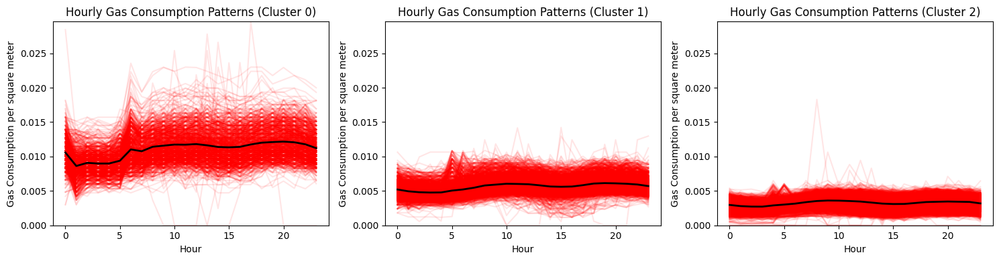

In [29]:
plot_cluster_data_All_Clusters_Average2color(cluster_groups_heating_months_scaled)

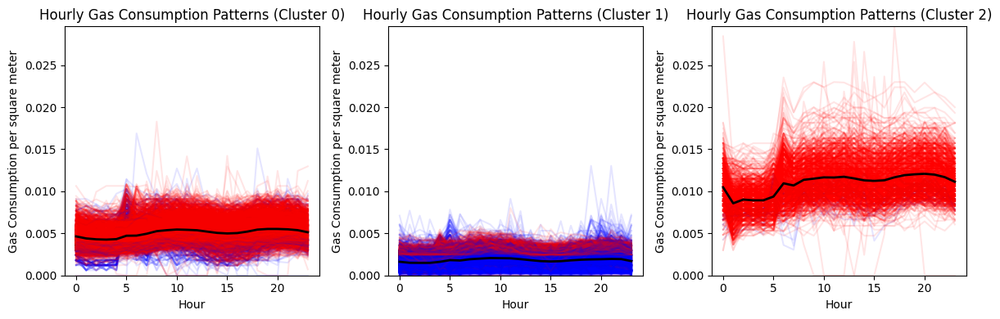

In [53]:
plot_cluster_data_All_Clusters_Average2color(cluster_groups_scaled)

In [85]:
def plot_cluster_average(cluster_groups: Dict[int, pd.DataFrame]):
#     # Find the global maximum and minimum gas consumption values across all clusters
#     global_max = max(cluster_group.drop(columns=['date', 'meter_id']).mean().max() for cluster_group in cluster_groups.values())
#     global_min = min(cluster_group.drop(columns=['date', 'meter_id']).mean().min() for cluster_group in cluster_groups.values())

    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    # Create 4x2 subplots
    fig, axs = plt.subplots(4, 2, figsize=(15, 20))
    axs = axs.ravel()  # Flatten the 2D axes array

    for i, cluster_group in cluster_groups.items():
        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()

        axs[i].plot(x_axis_values, cluster_average, color='red', linewidth=2, label='Average')

        axs[i].set_xlabel("Hour")
        axs[i].set_ylabel("Gas Consumption per square meter")
        axs[i].set_title(f"Cluster {i}: Hourly Gas Consumption Patterns Average")

#         # Set the y-axis limits to the global maximum and minimum values
#         axs[i].set_ylim(global_min, global_max)

    # Hide the remaining unused subplots
    for ax in axs[i+1:]:
        ax.axis('off')

    # Save the figure to a specified location
    plt.tight_layout()
    plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result\\All_Clusters_Average2color.png")
    plt.show()


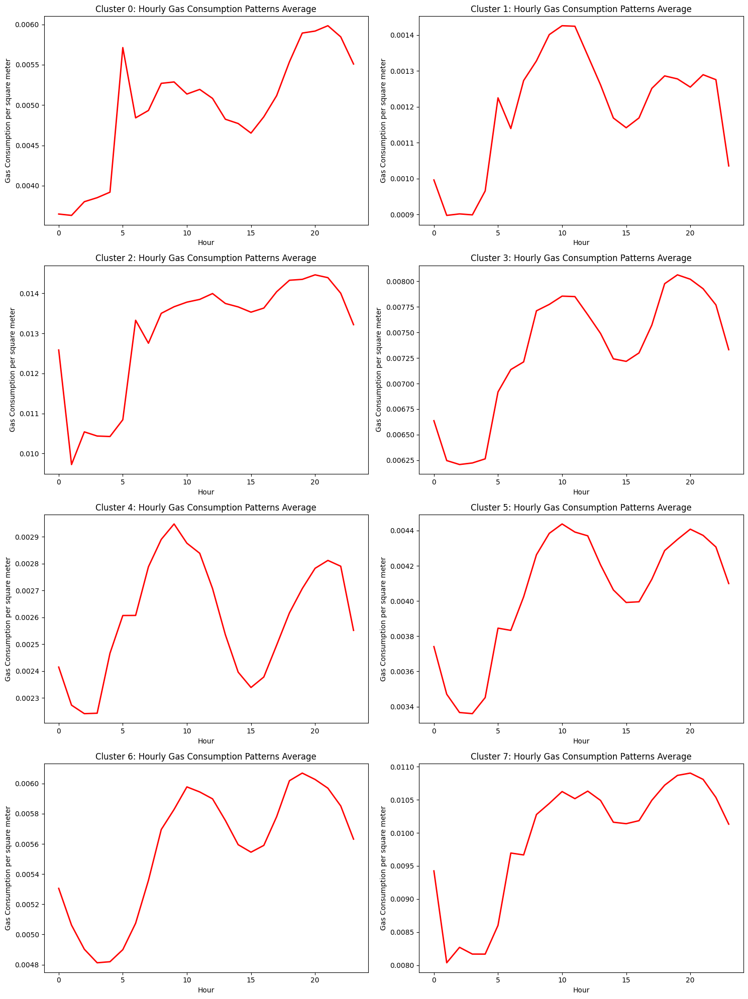

In [86]:
# Call the plotting function
plot_cluster_average(cluster_group_scaled)

In [191]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

def plot_cluster_data(cluster_groups: Dict[int, pd.DataFrame]):
    # Find the global maximum and minimum gas consumption values across all clusters
    global_max = max(cluster_group.drop(columns=['date', 'meter_id']).max().max() for cluster_group in cluster_groups.values())
    global_min = min(cluster_group.drop(columns=['date', 'meter_id']).min().min() for cluster_group in cluster_groups.values())

    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    cluster_averages = {}
    cluster_counts = []  # List to store the counts of each cluster
    n_clusters = len(cluster_groups.keys())

    for i, cluster_group in cluster_groups.items():
        cluster_data = cluster_group
        
        cluster_counts.append(len(cluster_group))  # Add the count of the current cluster to the list
        # Create a boolean mask for the heating months (October to April)
        heating_months = (cluster_group['date'].dt.month >= 10) | (cluster_group['date'].dt.month <= 4)
        
        fig, ax = plt.subplots(figsize=(12, 4))
        j = 0
        for index, row in cluster_group.drop(columns=['date', 'meter_id']).iterrows():
            # Get the color based on the heating months mask
            color = 'red' if heating_months.iloc[j] else 'blue'
            j += 1
            ax.plot(x_axis_values, row.values, color=color, alpha=0.1, label=None)

        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean()
        ax.plot(x_axis_values, cluster_average, color='black', linewidth=2, label='Average')

        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_title(f"Hourly Gas Consumption Patterns (Cluster {i})")

        # Set the y-axis limits to the global maximum and minimum values
        ax.set_ylim(global_min, global_max)
        ax.set_xlim(0, 23)
        plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result\\Cluster_{i}.png")
        plt.show()

        fig, ax = plt.subplots(figsize=(12, 4))
        ax.plot(x_axis_values, cluster_average, color='red', linewidth=2, label='Average')
        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption per m2")
        ax.set_xlim(0, 23)
        ax.set_title(f"Cluster {i}: Hourly Gas Consumption Patterns Average")
        ax.legend()
        
        # Save the image to a specified location
        plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result\\avg_Cluster_{i}.png")
        plt.show()
        
        # Store the average consumption for this cluster
        cluster_averages[i] = cluster_group.drop(columns=['date', 'meter_id']).mean().mean()

        # Create a pie chart for the count of meter_id in the current cluster
        meter_counts = cluster_group['meter_id'].value_counts()
        print(f"Cluster {i}:")
        for meter_id, count in meter_counts.items():
            percentage = (count / len(cluster_group)) * 100
            print(f"Meter ID {meter_id}: Count={count}, Percentage={percentage:.1f}%")

        
        fig, ax = plt.subplots()
        ax.pie(meter_counts, labels=meter_counts.index, autopct='%1.1f%%', startangle=90)
        ax.set_title(f"Percentage of Each Meter ID in Cluster {i}")
        plt.axis('equal')
        # Save the image to a specified location
        plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result\\pie_avg_Cluster_{i}.png")
        plt.show()
        # Store the average consumption for this cluster
        cluster_averages[i] = cluster_group.drop(columns=['date', 'meter_id']).mean().mean()
    
    # Create the overall average consumption plot across all clusters
    fig, ax = plt.subplots(figsize=(15, 5))
    ax.bar(range(len(cluster_averages)), cluster_averages.values())
    ax.set_xticks(range(len(cluster_averages)))
    ax.set_xticklabels(cluster_averages.keys())
    ax.set_xlabel("Cluster")
    ax.set_ylabel("Average Gas Consumption")
    ax.set_title("Average Gas Consumption across All Clusters")
    plt.show()
    
    # Print the percentage of each cluster relative to the total cluster
    total_cluster_count = sum(cluster_counts)
    for i, count in enumerate(cluster_counts):
        cluster_percentage = count / total_cluster_count * 100
        print(f"Cluster {i}: {cluster_percentage:.1f}% of Total Clusters")

    # Create the pie chart
    fig, ax = plt.subplots()
    ax.pie(cluster_counts, labels=[f'Cluster {i}' for i in range(n_clusters)], autopct='%1.1f%%', startangle=90)
    ax.set_title('Percentage of Each Cluster')
    plt.axis('equal')
    plt.show()

In [63]:
optimal_k_value = 3
cluster_group_scaled_three = analyze_and_plot_daily_meter_data_kmeans_optimalk_scaled(gas_data, ids_and_area, optimal_k_value)


Cluster 0:
Meter ID 4905: Count=615, Percentage=17.0%
Meter ID 4904: Count=522, Percentage=14.4%
Meter ID 4903: Count=508, Percentage=14.0%
Meter ID 40812: Count=482, Percentage=13.3%
Meter ID 4902: Count=455, Percentage=12.5%
Meter ID 40752: Count=353, Percentage=9.7%
Meter ID 40773: Count=351, Percentage=9.7%
Meter ID 41574: Count=342, Percentage=9.4%


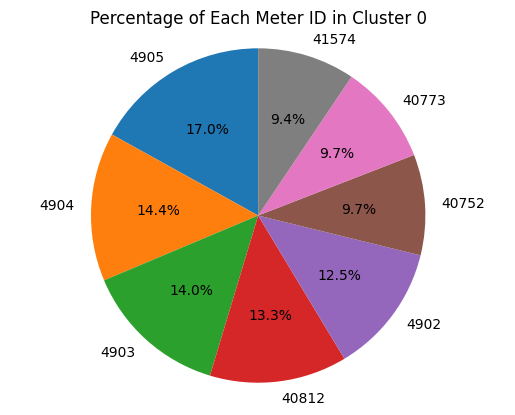

Cluster 1:
Meter ID 41574: Count=754, Percentage=17.7%
Meter ID 4902: Count=639, Percentage=15.0%
Meter ID 40812: Count=614, Percentage=14.4%
Meter ID 4903: Count=587, Percentage=13.8%
Meter ID 4904: Count=568, Percentage=13.4%
Meter ID 4905: Count=481, Percentage=11.3%
Meter ID 40773: Count=374, Percentage=8.8%
Meter ID 40752: Count=234, Percentage=5.5%


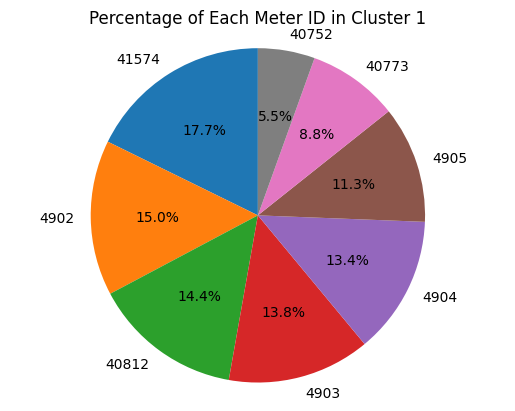

Cluster 2:
Meter ID 40752: Count=509, Percentage=57.3%
Meter ID 40773: Count=371, Percentage=41.7%
Meter ID 4904: Count=6, Percentage=0.7%
Meter ID 4902: Count=2, Percentage=0.2%
Meter ID 4903: Count=1, Percentage=0.1%


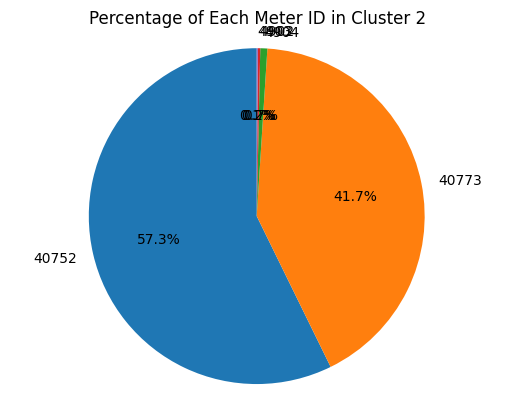

Index(['hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6',
       'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12',
       'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18',
       'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'meter_id',
       'date'],
      dtype='object')
{0: 0.005048863031728321, 1: 0.0018037809533026656, 2: 0.010944424798230351}


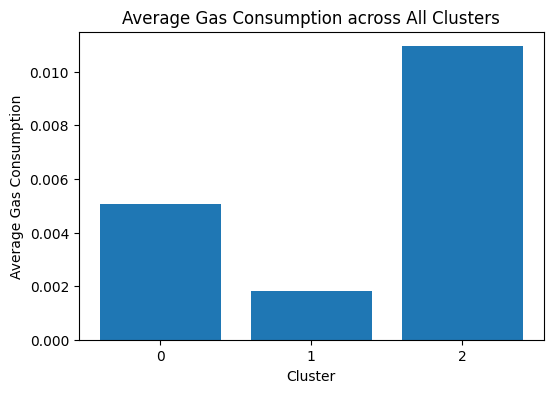

dict_keys([0, 1, 2]) consumptions: dict_values([0.005048863031728321, 0.0018037809533026656, 0.010944424798230351])


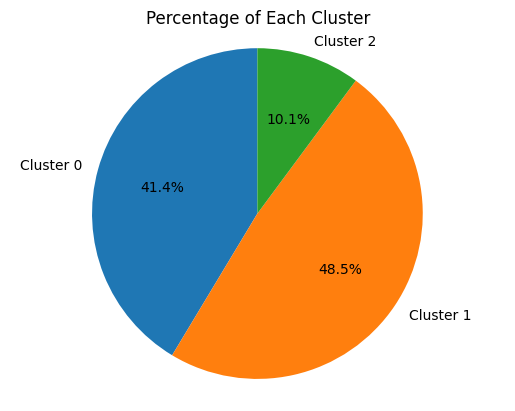

In [65]:
# Call the plotting function
plot_cluster_data_elbow(cluster_group_scaled_three)

In [341]:
# Group data by cluster
cluster_groups = {}
for cluster in range(3):
    cluster_data = data_daily_unstacked[cluster_labels == cluster]
    cluster_groups[cluster] = cluster_data

Index(['hour_0', 'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6',
       'hour_7', 'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12',
       'hour_13', 'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18',
       'hour_19', 'hour_20', 'hour_21', 'hour_22', 'hour_23', 'meter_id',
       'date'],
      dtype='object')
{0: 0.0018037858323414514, 1: 0.0050529841123713535, 2: 0.01092098262458826}


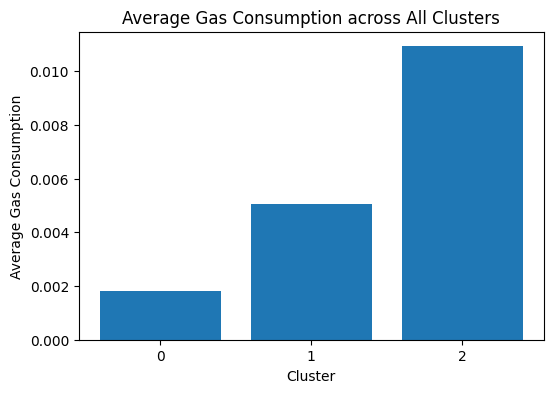

dict_keys([0, 1, 2]) consumptions: dict_values([0.0018037858323414514, 0.0050529841123713535, 0.01092098262458826])


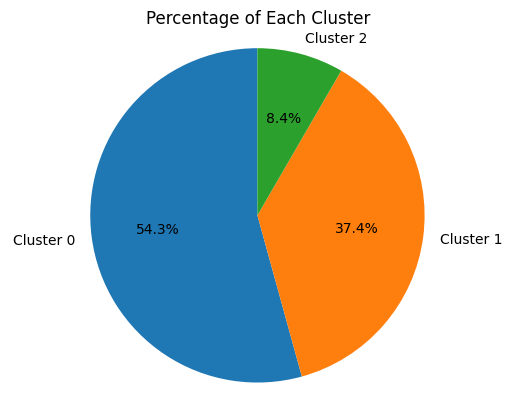

In [344]:
# Call the plotting function
plot_cluster_data_elbow(cluster_groups)

In [60]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_data_pie(cluster_groups: Dict[int, pd.DataFrame]):

    cluster_counts = []  # List to store the counts of each cluster
    meter_ids = []
    meter_counts = []
    
    # Calculate counts for each meter_id within each cluster
    for i, cluster_group in cluster_groups.items():
        cluster_counts.append(len(cluster_group))
        
        # Get the counts for each meter_id in the current cluster
        meter_counts_cluster = cluster_group['meter_id'].value_counts().to_dict()
        for meter_id, count in meter_counts_cluster.items():
            meter_ids.append(f"Cluster {i} Meter {meter_id}")
            meter_counts.append(count)

    # Calculate the percentages for each cluster and each meter_id
    cluster_percentages = np.array(cluster_counts) / sum(cluster_counts) * 100
    meter_percentages = np.array(meter_counts) / sum(meter_counts) * 100

     
    # Map each meter_id to a color
    ids_and_descriptions = {
        4902: '4531g0b Uilenstede 5-61 (Toren 1)',   
        4903: '4534g0b Uilenstede 155-211 (Toren 2)',   
        4904: '4535g0b Uilenstede 405-461 (Toren 3)',
        4905: '4520g0a Uilenstede 106-460',
        40752: '4504g0a UIlenstede 36-70',
        40773: '4501g0a Uilenstede 2-32',
        40812: '4511g0b Uilenstede 102 e-h (trad)',   
        41574: '4510g0b Uilenstede 102 a-d (H-inst)',   
    }
    cmap = plt.get_cmap('Set1')
    meter_colors = cmap(np.linspace(0, 1, len(ids_and_descriptions)))
    meter_color_dict = dict(zip(ids_and_descriptions.keys(), meter_colors))

    # Assign color to each meter_id by stripping the cluster label first
    meter_colors_assigned = [meter_color_dict[int(meter_id.split(" ")[-1])] for meter_id in meter_ids]


    # Create donut chart
    fig, ax = plt.subplots()

    # Plot the outer donut for clusters
    ax.pie(cluster_percentages, textprops={'fontsize': 6}, labels=[f'Cluster {i}' for i in range(len(cluster_groups))], autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.2))
    
    # Plot the inner donut for meter_ids with assigned colors
    ax.pie(meter_percentages, textprops={'fontsize': 6}, labels=meter_ids, colors=meter_colors_assigned, autopct='%1.1f%%', startangle=90, radius=0.8)
    
    ax.set_title('Cluster and Meter ID Distribution')
    plt.axis('equal')
    plt.show()
    
    print(meter_ids)


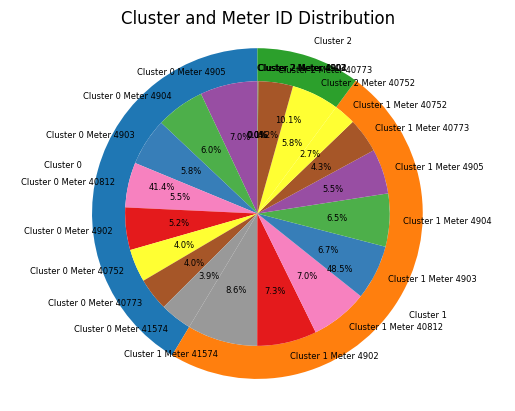

['Cluster 0 Meter 4905', 'Cluster 0 Meter 4904', 'Cluster 0 Meter 4903', 'Cluster 0 Meter 40812', 'Cluster 0 Meter 4902', 'Cluster 0 Meter 40752', 'Cluster 0 Meter 40773', 'Cluster 0 Meter 41574', 'Cluster 1 Meter 41574', 'Cluster 1 Meter 4902', 'Cluster 1 Meter 40812', 'Cluster 1 Meter 4903', 'Cluster 1 Meter 4904', 'Cluster 1 Meter 4905', 'Cluster 1 Meter 40773', 'Cluster 1 Meter 40752', 'Cluster 2 Meter 40752', 'Cluster 2 Meter 40773', 'Cluster 2 Meter 4904', 'Cluster 2 Meter 4902', 'Cluster 2 Meter 4903']


In [61]:
plot_cluster_data_pie(cluster_group_scaled)

In [41]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_data_pie(cluster_groups: Dict[int, pd.DataFrame]):

    cluster_counts = []  # List to store the counts of each cluster
    meter_ids = []
    meter_counts = []
    
    # Calculate counts for each meter_id within each cluster
    for i, cluster_group in cluster_groups.items():
        cluster_counts.append(len(cluster_group))
        
        # Get the counts for each meter_id in the current cluster
        meter_counts_cluster = cluster_group['meter_id'].value_counts().to_dict()
        for meter_id, count in meter_counts_cluster.items():
            meter_ids.append(f"Cluster {i} Meter {meter_id}")
            meter_counts.append(count)

    # Calculate the percentages for each cluster and each meter_id
    cluster_percentages = np.array(cluster_counts) / sum(cluster_counts) * 100
    meter_percentages = np.array(meter_counts) / sum(meter_counts) * 100

    # Map meter ids to colors
    unique_meter_ids = list(set(meter_ids))
    cmap = plt.get_cmap('tab20c')
    meter_colors = cmap(np.linspace(0, 1, len(unique_meter_ids)))
    meter_color_dict = dict(zip(unique_meter_ids, meter_colors))
    meter_colors_assigned = [meter_color_dict[meter_id] for meter_id in meter_ids]

    # Create donut chart
    fig, ax = plt.subplots()

    # Plot the outer donut for clusters
    ax.pie(cluster_percentages, textprops={'fontsize': 6}, labels=[f'Cluster {i}' for i in range(len(cluster_groups))], autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.1))
    
    # Plot the inner donut for meter_ids with assigned colors
    ax.pie(meter_percentages, textprops={'fontsize': 6}, labels=meter_ids, colors=meter_colors_assigned, autopct='%1.1f%%', startangle=90, radius=0.9)
    
    ax.set_title('Cluster and Meter ID Distribution')
    plt.axis('equal')
    plt.show()


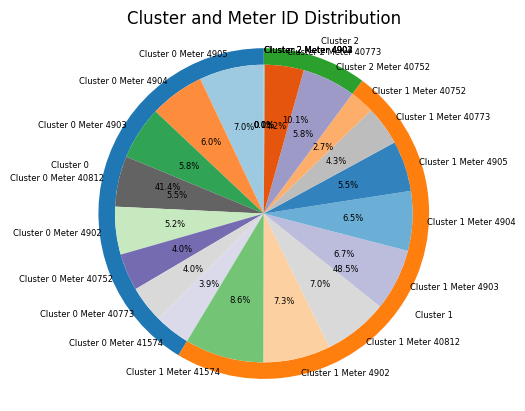

In [42]:
plot_cluster_data_pie(cluster_group_scaled)

## add building features

In [18]:
import pandas as pd

def calculate_non_heating_percentages(gas_data, ids_and_descriptions):
    # Copy gas_data and add area column
    gas_data_scaled = gas_data.copy()
    gas_data_scaled['area'] = gas_data_scaled['meter_id'].map(ids_and_area)

    # Scale the value by the area
    gas_data_scaled['value'] = gas_data_scaled['value'] / gas_data_scaled['area']

    non_heating_percentages = {}

    for meter_id in ids_and_descriptions:
        meter_data = gas_data_scaled[gas_data_scaled['meter_id'] == meter_id]
        
        # Convert 'datetime' column to datetime format
        meter_data['datetime'] = pd.to_datetime(meter_data['datetime'], utc=True)

        # Set datetime column as index
        df = meter_data.set_index('datetime')

        # Reshape the dataframe
        df_temp = df.reset_index().copy()

        # Calculate the non-heating consumption
        heating_months = (df_temp['datetime'].dt.month >= 10) | (df_temp['datetime'].dt.month <= 4)
        non_heating_data = df_temp[~heating_months]
        non_heating_consumption = non_heating_data['value'].mean()

        # Calculate the total consumption for the meter ID
        total_consumption = meter_data['value'].mean()

       
        non_heating_percentage = non_heating_consumption / total_consumption
        non_heating_percentages[meter_id] = non_heating_percentage

    return non_heating_percentages


In [19]:
non_heating_percentages = calculate_non_heating_percentages(gas_data, ids_and_descriptions)

c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


In [20]:
non_heating_percentages

{4902: 0.428778019879786,
 4903: 0.4131867190509238,
 4904: 0.42322412215204,
 4905: 0.5809021197805955,
 40752: 0.46578966202954386,
 40773: 0.4264987535970315,
 40812: 0.5294428537001075,
 41574: 0.4775160726755327}

# Analyze clusters

In [74]:
import pandas as pd

def analyze_clusters(cluster_data, building_info_filepath, non_heating_percentages):
    cluster_groups = cluster_data.copy()
    # Load building information
    building_info = pd.read_excel(building_info_filepath)

    # Print column names for debugging
    print(f"Building info columns: {building_info.columns}")

    # Convert the meter id column to the same type as in the cluster data
    building_info['meter id'] = building_info['meter id'].astype(str)

    # Convert the non_heating_percentages dictionary into a DataFrame
    non_heating_percentages_df = pd.DataFrame(list(non_heating_percentages.items()), columns=['meter_id', 'non_heating_percentage'])
    non_heating_percentages_df['meter_id'] = non_heating_percentages_df['meter_id'].astype(str)

    # Merge building info and non_heating_percentages with each cluster and analyze composition
    for cluster_num, cluster_data in cluster_groups.items():
        # Merge the building info and non_heating_percentages with the cluster data using the meter id
        cluster_data['meter_id'] = cluster_data['meter_id'].astype(str)
        merged_cluster_data = cluster_data.merge(building_info, on='meter id', how='left')
        merged_cluster_data = merged_cluster_data.merge(non_heating_percentages_df, on='meter_id', how='left')

#         # Print column names for debugging
#         print(f"Merged cluster data columns for cluster {cluster_num}: {merged_cluster_data.columns}")

        # Update cluster data with merged data
        cluster_groups[cluster_num] = merged_cluster_data

        print(f"\nCluster {cluster_num}")

        # Check the composition of construction years
        print("Construction Year Composition:")
        print(merged_cluster_data['Construction year'].dropna().value_counts(normalize=True).mul(100).round(1).astype(str) + '%')

        # Check the composition of Avg. roof insulation
        print("Average Roof Insulation Composition:")
        print(merged_cluster_data['Avg. roof insulation [m² K/W]'].dropna().describe().round(2))
        print('\n')

#         # Check the composition of building orientations
#         print("Building Orientation Composition:")
#         print(merged_cluster_data['Normative orientation [-]'].dropna().value_counts())

        # Check the composition of EP1 [kWh/m²]
        print("EP1 [kWh/m²] Composition:")
        print(merged_cluster_data['EP1 [kWh/m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of EP2 [kWh/m²]
        print("EP2 [kWh/m²] Composition:")
        print(merged_cluster_data['EP2 [kWh/m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of EP2 EMG forf. [kWh/m²]
        print("EP2 EMG forf. [kWh/m²] Composition:")
        print(merged_cluster_data['EP2 EMG forf. [kWh/m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Avg. insulation floor [m² K/W]
        print("Average Insulation Floor [m² K/W] Composition:")
        print(merged_cluster_data['Avg. insulation floor [m² K/W]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Avg. insulation facades excl. AOR [m² K/W]
        print("Average Insulation Facades Excl. AOR [m² K/W] Composition:")
        print(merged_cluster_data['Avg. insulation facades excl. AOR [m² K/W]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Until. facades ex AOR [m²]
        print("Until. Facades Ex AOR [m²] Composition:")
        print(merged_cluster_data['Until. facades ex AOR [m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Avg. insulation windows [W/(m² K)]
        print("Average Insulation Windows [W/(m² K)] Composition:")
        print(merged_cluster_data['Avg. insulation windows [W/(m² K)]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Until. window [m²]
        print("Until. Window [m²] Composition:")
        print(merged_cluster_data['Until. window [m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of non_heating_percentages
        print("Non-heating Percentage Composition:")
        print(merged_cluster_data['non_heating_percentage'].dropna().describe().round(2))
        print('\n')
        

In [75]:
import pandas as pd

def analyze_clusters_without_non_heating(cluster_data, building_info_filepath):
    cluster_groups = cluster_data.copy()
    # Load building information
    building_info = pd.read_excel(building_info_filepath)

    # Print column names for debugging
    print(f"Building info columns: {building_info.columns}")

    
    # Rename the 'meter id' column in building_info to 'meter_id'
    building_info = building_info.rename(columns={'meter id': 'meter_id'})

    # Convert the 'meter_id' column to the same type as in the cluster data
    building_info['meter_id'] = building_info['meter_id'].astype(str)


    for cluster_num, cluster_data in cluster_groups.items():
        # Merge the building info awith the cluster data using the meter id
        cluster_data['meter_id'] = cluster_data['meter_id'].astype(str)
        merged_cluster_data = cluster_data.merge(building_info, on='meter_id', how='left')

#         # Print column names for debugging
#         print(f"Merged cluster data columns for cluster {cluster_num}: {merged_cluster_data.columns}")

        # Update cluster data with merged data
        cluster_groups[cluster_num] = merged_cluster_data

        print(f"\nCluster {cluster_num}")

        # Check the composition of construction years
        print("Construction Year Composition:")
        print(merged_cluster_data['Construction year'].dropna().value_counts(normalize=True).mul(100).round(1).astype(str) + '%')
        print('\n')

        # Check the composition of Avg. roof insulation
        print("Average Roof Insulation Composition:")
        print(merged_cluster_data['Avg. roof insulation [m² K/W]'].dropna().describe().round(2))
        print('\n')

#         # Check the composition of building orientations
#         print("Building Orientation Composition:")
#         print(merged_cluster_data['Normative orientation [-]'].dropna().value_counts())

        # Check the composition of EP1 [kWh/m²]
        print("EP1 [kWh/m²] Composition:")
        print(merged_cluster_data['EP1 [kWh/m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of EP2 [kWh/m²]
        print("EP2 [kWh/m²] Composition:")
        print(merged_cluster_data['EP2 [kWh/m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of EP2 EMG forf. [kWh/m²]
        print("EP2 EMG forf. [kWh/m²] Composition:")
        print(merged_cluster_data['EP2 EMG forf. [kWh/m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Avg. insulation floor [m² K/W]
        print("Average Insulation Floor [m² K/W] Composition:")
        print(merged_cluster_data['Avg. insulation floor [m² K/W]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Avg. insulation facades excl. AOR [m² K/W]
        print("Average Insulation Facades Excl. AOR [m² K/W] Composition:")
        print(merged_cluster_data['Avg. insulation facades excl. AOR [m² K/W]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Until. facades ex AOR [m²]
        print("Until. Facades Ex AOR [m²] Composition:")
        print(merged_cluster_data['Until. facades ex AOR [m²]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Avg. insulation windows [W/(m² K)]
        print("Average Insulation Windows [W/(m² K)] Composition:")
        print(merged_cluster_data['Avg. insulation windows [W/(m² K)]'].dropna().describe().round(2))
        print('\n')

        # Check the composition of Until. window [m²]
        print("Until. Window [m²] Composition:")
        print(merged_cluster_data['Until. window [m²]'].dropna().describe().round(2))
        print('\n')


In [77]:
analyze_clusters_without_non_heating(cluster_groups_heating_months_scaled, 'building info.xlsx')

Building info columns: Index(['Location', 'Building no.', 'meter id', 'Construction year',
       'Normative orientation [-]', 'EP1 [kWh/m²]', 'EP2 [kWh/m²]',
       'EP2 EMG forf. [kWh/m²]', 'Avg. insulation floor [m² K/W]',
       'Avg. roof insulation [m² K/W]',
       'Avg. insulation facades excl. AOR [m² K/W]',
       'Until. facades ex AOR [m²]', 'Avg. insulation windows [W/(m² K)]',
       'Until. window [m²]'],
      dtype='object')

Cluster 0
Construction Year Composition:
1991.0    99.7%
1970.0     0.3%
Name: Construction year, dtype: object


Average Roof Insulation Composition:
count    364.00
mean       2.21
std        0.12
min        0.00
25%        2.22
50%        2.22
75%        2.22
max        2.22
Name: Avg. roof insulation [m² K/W], dtype: float64


EP1 [kWh/m²] Composition:
count      1.00
mean     122.22
std         NaN
min      122.22
25%      122.22
50%      122.22
75%      122.22
max      122.22
Name: EP1 [kWh/m²], dtype: float64


EP2 [kWh/m²] Composition:
cou

In [76]:
analyze_clusters(cluster_groups_scaled, 'building info.xlsx', non_heating_percentages)


Building info columns: Index(['Location', 'Building no.', 'meter id', 'Construction year',
       'Normative orientation [-]', 'EP1 [kWh/m²]', 'EP2 [kWh/m²]',
       'EP2 EMG forf. [kWh/m²]', 'Avg. insulation floor [m² K/W]',
       'Avg. roof insulation [m² K/W]',
       'Avg. insulation facades excl. AOR [m² K/W]',
       'Until. facades ex AOR [m²]', 'Avg. insulation windows [W/(m² K)]',
       'Until. window [m²]'],
      dtype='object')

Cluster 0
Construction Year Composition:
2014.0    33.6%
1970.0    30.7%
2012.0    16.8%
1991.0     9.6%
1982.0     9.3%
Name: Construction year, dtype: object
Average Roof Insulation Composition:
count    3661.00
mean        2.91
std         1.85
min         0.00
25%         1.32
50%         4.66
75%         4.66
max         4.66
Name: Avg. roof insulation [m² K/W], dtype: float64


EP1 [kWh/m²] Composition:
count    3310.00
mean      100.64
std        54.30
min        59.68
25%        61.44
50%        65.52
75%       122.22
max       238.72
Name

In [320]:
import pandas as pd

building_info = pd.read_excel('building info.xlsx')

# Convert the meter id column to the same type as in the cluster data
building_info['meter id'] = building_info['meter id'].astype(str)

# Loop through each cluster
for cluster_num, cluster_data in cluster_groups_elbow.items():
    # Merge the building info with the cluster data using the meter id
    cluster_data['meter_id'] = cluster_data['meter_id'].astype(str)

    cluster_data = cluster_data.merge(building_info, left_on='meter_id', right_on='meter id', how='left')
    cluster_groups_elbow[cluster_num] = cluster_data
# For each cluster

for cluster_num, cluster_data in cluster_groups_elbow.items():
    print(f"Cluster {cluster_num}")

    # Check the composition of construction years
    print("Construction Year Composition:")
    print(cluster_data['Construction year'].dropna().value_counts())

    # Check the composition of Avg. roof insulation
    print("Average Roof Insulation Composition:")
    print(cluster_data['Avg. roof insulation [m² K/W]'].dropna().value_counts())

    # Check the composition of building orientations
    print("Building Orientation Composition:")
    print(cluster_data['Normative orientation [-]'].dropna().value_counts())

    print("\n")



Cluster 0
Construction Year Composition:
1970.0    399
2014.0    370
1982.0    283
2012.0    185
1991.0    127
Name: Construction year, dtype: int64
Average Roof Insulation Composition:
4.664444    555
1.300000    283
0.000000    214
1.320561    185
2.220000    127
Name: Avg. roof insulation [m² K/W], dtype: int64
Building Orientation Composition:
West     682
North    312
East     185
South    185
Name: Normative orientation [-], dtype: int64


Cluster 1
Construction Year Composition:
2014.0    360
1970.0    331
2012.0    180
1991.0    138
1982.0     82
Name: Construction year, dtype: int64
Average Roof Insulation Composition:
4.664444    540
1.320561    180
0.000000    151
2.220000    138
1.300000     82
Name: Avg. roof insulation [m² K/W], dtype: int64
Building Orientation Composition:
West     413
North    318
East     180
South    180
Name: Normative orientation [-], dtype: int64


Cluster 2
Construction Year Composition:
1991.0    100
Name: Construction year, dtype: int64
Average

c:\robodk\python37\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [324]:
# Building features
building_features = ['Construction year', 'Normative orientation [-]', 'Avg. insulation floor [m² K/W]',
                     'Avg. roof insulation [m² K/W]', 'Avg. insulation facades excl. AOR [m² K/W]',
                     'Until. facades ex AOR [m²]', 'Avg. insulation windows [W/(m² K)]', 'Until. window [m²]']

# DataFrame to hold the highest values for each feature and cluster
cluster_max_values = pd.DataFrame(columns=['Cluster'] + building_features)

# Loop through each cluster
for cluster_num, cluster_data in cluster_groups_elbow.items():
    max_values = []
    print(f"Cluster {cluster_num}")

    for feature in building_features:
        # Get sorted counts of values
        value_counts = cluster_data[feature].value_counts().sort_values(ascending=False)

        print(f"{feature} Composition:")
        print(value_counts)
        
        # Get the highest non-NaN value
        for value, count in value_counts.items():
            if pd.isna(value):
                continue
            else:
                max_value = value
                break
        
        max_values.append(max_value)

    # Append to the DataFrame
    cluster_max_values = cluster_max_values.append(pd.Series([cluster_num] + max_values, index=cluster_max_values.columns), ignore_index=True)

print(cluster_max_values)


Cluster 0
Construction year Composition:
1970.0    399
2014.0    370
1982.0    283
2012.0    185
1991.0    127
Name: Construction year, dtype: int64
Normative orientation [-] Composition:
West     682
North    312
East     185
South    185
Name: Normative orientation [-], dtype: int64
Avg. insulation floor [m² K/W] Composition:
3.261111    555
0.150000    283
1.225412    214
1.930000    185
1.300000    127
Name: Avg. insulation floor [m² K/W], dtype: int64
Avg. roof insulation [m² K/W] Composition:
4.664444    555
1.300000    283
0.000000    214
1.320561    185
2.220000    127
Name: Avg. roof insulation [m² K/W], dtype: int64
Avg. insulation facades excl. AOR [m² K/W] Composition:
3.471111    555
0.350000    283
0.389246    214
0.920899    185
2.000000    127
Name: Avg. insulation facades excl. AOR [m² K/W], dtype: int64
Until. facades ex AOR [m²] Composition:
13.529722    283
14.407419    214
11.806040    185
10.398836    185
12.836846    185
10.873533    185
29.768197    127
Name: Un

In [325]:
print(cluster_max_values)


  Cluster  Construction year Normative orientation [-]  \
0       0             1970.0                      West   
1       1             2014.0                      West   
2       2             1991.0                     North   

   Avg. insulation floor [m² K/W]  Avg. roof insulation [m² K/W]  \
0                        3.261111                       4.664444   
1                        3.261111                       4.664444   
2                        1.300000                       2.220000   

   Avg. insulation facades excl. AOR [m² K/W]  Until. facades ex AOR [m²]  \
0                                    3.471111                   13.529722   
1                                    3.471111                   11.806040   
2                                    2.000000                   29.768197   

   Avg. insulation windows [W/(m² K)]  Until. window [m²]  
0                            2.300000           11.869861  
1                            2.300000           12.335743  
2    

In [328]:
print('\\begin{table}')
print('\\centering')
print('\\caption{Cluster Information}')
print(cluster_max_values.to_latex(index=False))
print('\\label{tab:clusterinfo}')
print('\\end{table}')


\begin{table}
\centering
\caption{Cluster Information}
\begin{tabular}{lrlrrrrrr}
\toprule
Cluster &  Construction year & Normative orientation [-] &  Avg. insulation floor [m² K/W] &  Avg. roof insulation [m² K/W] &  Avg. insulation facades excl. AOR [m² K/W] &  Until. facades ex AOR [m²] &  Avg. insulation windows [W/(m² K)] &  Until. window [m²] \\
\midrule
      0 &             1970.0 &                      West &                        3.261111 &                       4.664444 &                                    3.471111 &                   13.529722 &                            2.300000 &           11.869861 \\
      1 &             2014.0 &                      West &                        3.261111 &                       4.664444 &                                    3.471111 &                   11.806040 &                            2.300000 &           12.335743 \\
      2 &             1991.0 &                     North &                        1.300000 &                   

In [322]:
# Loop through each cluster
for cluster_num, cluster_data in cluster_groups_elbow.items():

    cluster_counts.append(len(cluster_data))
    print(f'Cluster {cluster_num}: Count={len(cluster_data)}')
    print(f"Cluster {cluster_num}")
    print("\n")

    # Create a list of cluster numbers
    cluster_nums = [f'Cluster {i}' for i in range(len(cluster_counts))]

    for feature in building_features:
        print(f"{feature} Composition:")
        print(cluster_data[feature].value_counts())
        print("\n")


Cluster 0: Count=2140
Cluster 0


Construction year Composition:
1970.0    399
2014.0    370
1982.0    283
2012.0    185
1991.0    127
Name: Construction year, dtype: int64


Normative orientation [-] Composition:
West     682
North    312
East     185
South    185
Name: Normative orientation [-], dtype: int64


Avg. insulation floor [m² K/W] Composition:
3.261111    555
0.150000    283
1.225412    214
1.930000    185
1.300000    127
Name: Avg. insulation floor [m² K/W], dtype: int64


Avg. roof insulation [m² K/W] Composition:
4.664444    555
1.300000    283
0.000000    214
1.320561    185
2.220000    127
Name: Avg. roof insulation [m² K/W], dtype: int64


Avg. insulation facades excl. AOR [m² K/W] Composition:
3.471111    555
0.350000    283
0.389246    214
0.920899    185
2.000000    127
Name: Avg. insulation facades excl. AOR [m² K/W], dtype: int64


Until. facades ex AOR [m²] Composition:
13.529722    283
14.407419    214
11.806040    185
10.398836    185
12.836846    185
10.87353

In [17]:
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt

def plot_cluster_data_avg(cluster_groups: Dict[int, pd.DataFrame]):
    # Plot results for each cluster
    x_axis_values = np.arange(24)  # Create an array with values from 0 to 23 representing hours
    
    n_clusters = len(cluster_groups.keys())
    total_count = sum(len(cluster_group) for cluster_group in cluster_groups.values()) # Compute the total count before loop
    
    fig, axs = plt.subplots(1, n_clusters, figsize=(n_clusters*5, 4))

    cluster_counts = []  # List to store the counts of each cluster

    for i, cluster_group in enumerate(cluster_groups.values()):
        print(f'Cluster {i}: Count={len(cluster_group)}, Average={cluster_group.mean().mean()}')

        cluster_counts.append(len(cluster_group))  # Add the count of the current cluster to the list

        cluster_average = cluster_group.drop(columns=['date', 'meter_id']).mean().values  # Extract values as a NumPy array

        if n_clusters > 1:
            ax = axs[i]
        else:
            ax = axs

        ax.plot(x_axis_values, cluster_average, color='red', linewidth=2, label='Average')
        ax.set_xlabel("Hour")
        ax.set_ylabel("Gas Consumption")
        ax.set_title(f"Cluster {i}, Percentage: {len(cluster_group)/total_count*100:.0f}%") # Compute the percentage of each cluster
        ax.set_xlim(0, 23)
        ax.legend()

#     plt.savefig(f"C:\\Users\\qwero\\OneDrive - Delft University of Technology\\Desktop\\Master Thisis\\inet-building-clustering-result-elbow-3years\\all_avg_Clusters.png")
    plt.tight_layout()
    plt.show()

    # Create the pie chart
    fig, ax = plt.subplots()
    ax.pie(cluster_counts, labels=[f'Cluster {i}' for i in range(n_clusters)], autopct='%1.1f%%', startangle=90)
    ax.set_title('Percentage of Each Cluster')
    plt.axis('equal')
    plt.show()


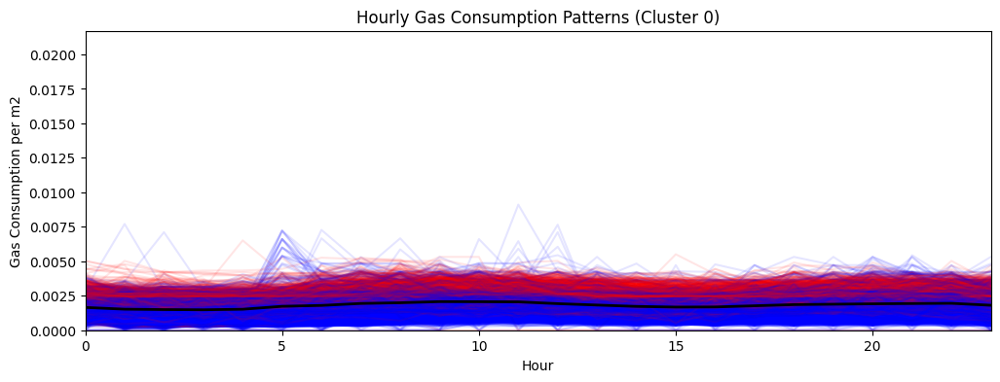

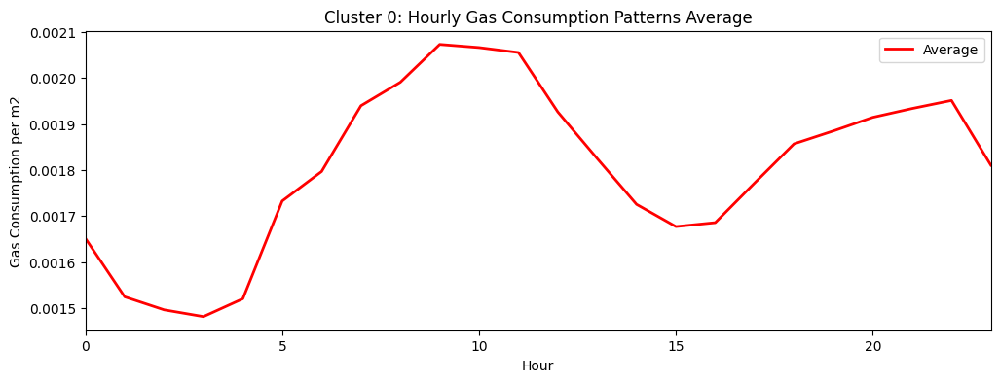

Cluster 0:
Meter ID 41574: Count=283, Percentage=17.9%
Meter ID 4902: Count=229, Percentage=14.4%
Meter ID 40812: Count=228, Percentage=14.4%
Meter ID 4904: Count=216, Percentage=13.6%
Meter ID 4903: Count=214, Percentage=13.5%
Meter ID 4905: Count=185, Percentage=11.7%
Meter ID 40773: Count=127, Percentage=8.0%
Meter ID 40752: Count=103, Percentage=6.5%


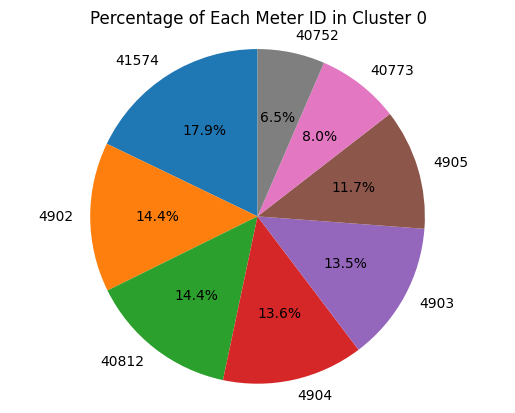

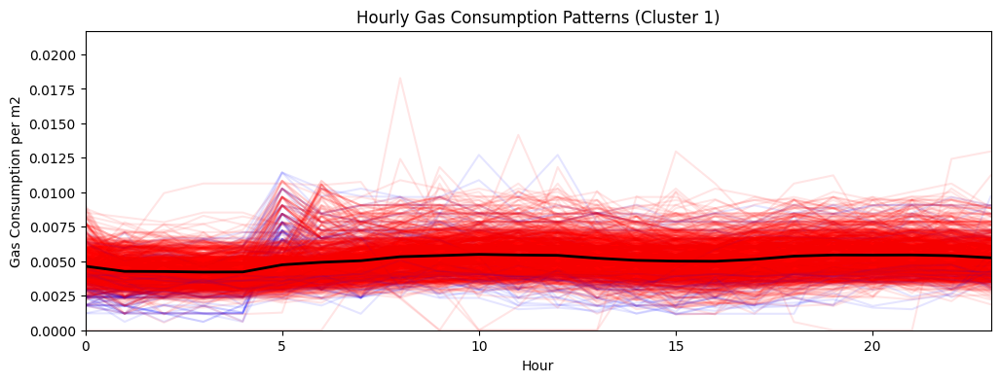

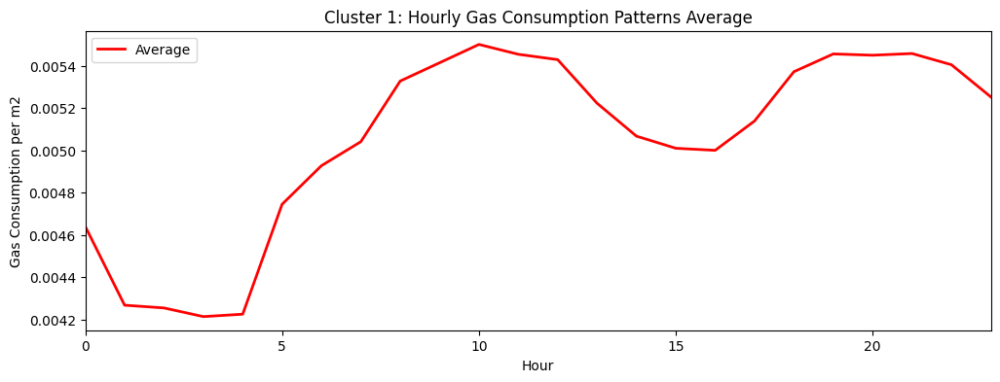

Cluster 1:
Meter ID 4905: Count=180, Percentage=16.5%
Meter ID 4903: Count=151, Percentage=13.8%
Meter ID 4904: Count=148, Percentage=13.6%
Meter ID 40773: Count=138, Percentage=12.6%
Meter ID 40812: Count=137, Percentage=12.6%
Meter ID 4902: Count=136, Percentage=12.5%
Meter ID 40752: Count=119, Percentage=10.9%
Meter ID 41574: Count=82, Percentage=7.5%


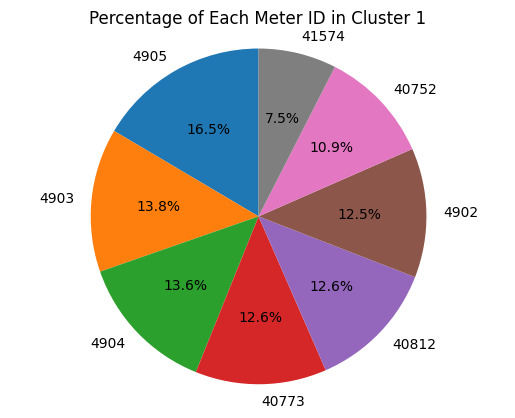

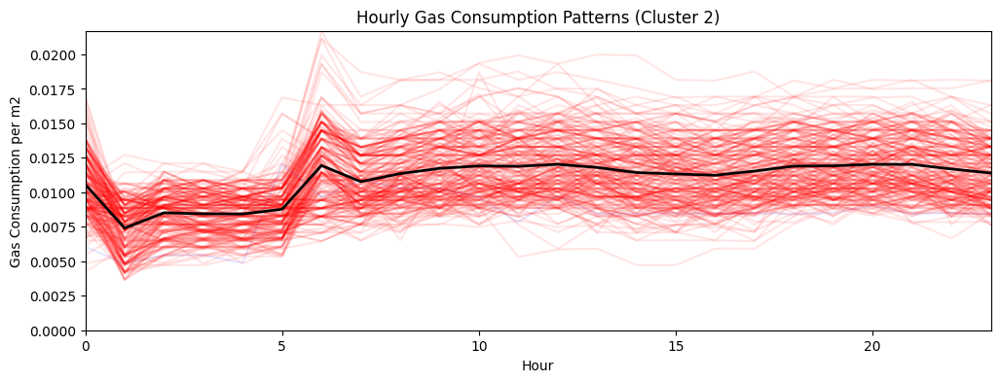

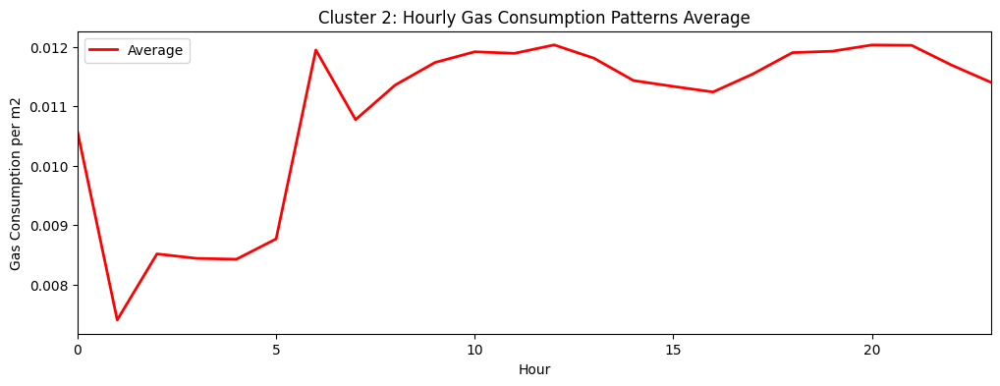

Cluster 2:
Meter ID 40752: Count=143, Percentage=58.6%
Meter ID 40773: Count=100, Percentage=41.0%
Meter ID 4904: Count=1, Percentage=0.4%


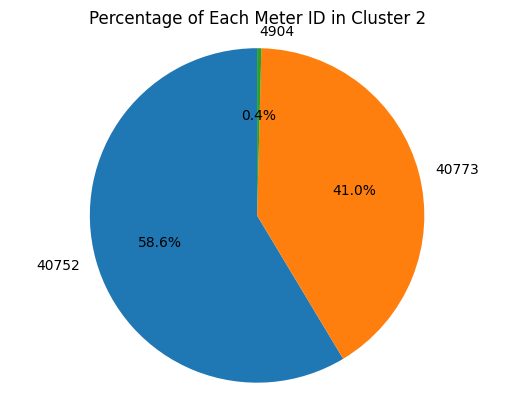

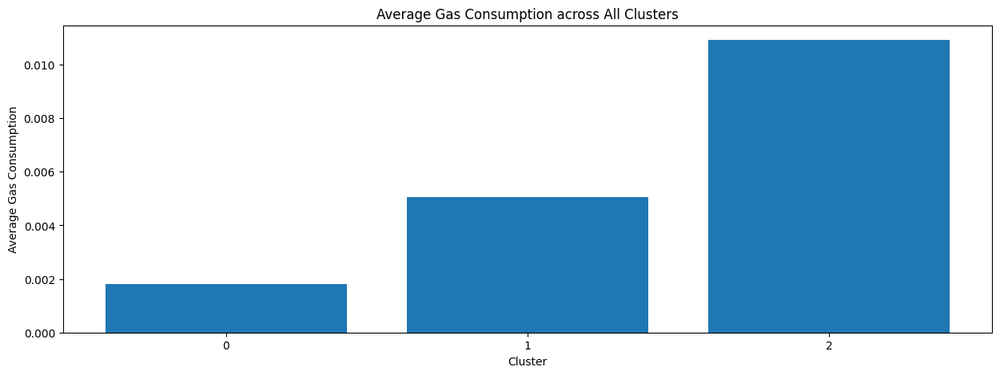

Cluster 0: 54.3% of Total Clusters
Cluster 1: 37.4% of Total Clusters
Cluster 2: 8.4% of Total Clusters


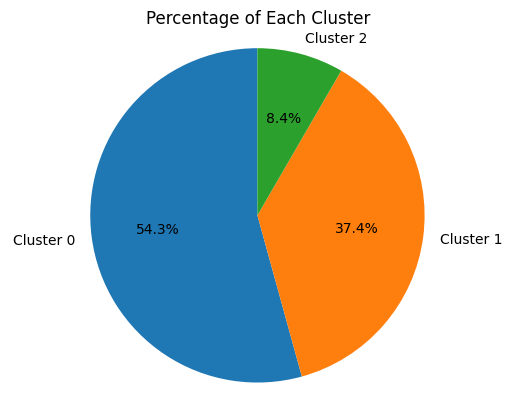

In [195]:
# Call the plotting function
plot_cluster_data(cluster_groups_elbow)

## building features

each cluster:

Averaged consumption per floor area
Persentage of insulations level
Persentage of hot tap water heating
Persentage of months? seasonal data
Persentage of construction year


## Hierarchical clustering

In [18]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from tslearn.metrics import dtw_path
from sklearn.cluster import AgglomerativeClustering
import numpy as np
import matplotlib.pyplot as plt

def analyze_and_plot_daily_meter_data_hierarchical_scaled(gas_data, ids_and_area):
    # Copy gas_data and add area column
    gas_data_copy = gas_data.copy()
    gas_data_copy['area'] = gas_data_copy['meter_id'].map(ids_and_area)

    # Scale the value by the area
    gas_data_copy['value'] = gas_data_copy['value'] / gas_data_copy['area']

    # Pivot the gas_data
    gas_data_copy['meter_id'] = gas_data_copy['meter_id'].map(str)
    gas_data_pivot = gas_data_copy.pivot_table(index='datetime', columns='meter_id', values='value', aggfunc='mean')

    # Preprocess data: Average values across all meter ids and group by date and hour
    data = gas_data_pivot.copy()
    data.index = pd.to_datetime(data.index, utc=True)
    data_daily_grouped = data.groupby([data.index.date, data.index.hour]).mean()
    data_daily_grouped.index.names = ['date', 'hour']
    data_daily_unstacked = data_daily_grouped.unstack(level=-2).transpose()
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked['meter_date'] = data_daily_unstacked['meter_id'].astype(str) + '_' + data_daily_unstacked['date'].astype(str)
    data_daily_unstacked = data_daily_unstacked.drop(columns=['meter_id','date'])
    data_daily_unstacked.set_index('meter_date', inplace=True)

    data_daily_unstacked.columns = [f'hour_{i}' for i in range(24)]
    # Prepare data for Time Series K-Means
    data_prepared = data_daily_unstacked.to_numpy()

    # Compute the pairwise distances using the DTW metric
    n_rows = len(data_daily_unstacked)
    distances = np.zeros((n_rows, n_rows))
    for i in range(n_rows):
        for j in range(i+1, n_rows):
            path, dist = dtw_path(data_daily_unstacked.iloc[i].values, data_daily_unstacked.iloc[j].values)
            distances[i, j] = dist
            distances[j, i] = dist

    # Perform hierarchical clustering using the 'ward' method
    max_clusters = 8
    silhouette_scores = []
    for n_clusters in range(2, max_clusters + 1):
        # Hierarchical clustering
        hierarchical = AgglomerativeClustering(n_clusters=n_clusters, affinity='precomputed', linkage='complete')
        cluster_labels = hierarchical.fit_predict(distances)

        # Calculate the silhouette score
        score = silhouette_score(distances, cluster_labels, metric='precomputed')
        silhouette_scores.append(score)

    # Plot the silhouette scores
    plt.plot(range(2, max_clusters + 1), silhouette_scores)
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Scores for Different Numbers of Clusters')
    plt.show()

    # Find the optimal number of clusters based on the highest silhouette score
    optimal_n_clusters = np.argmax(silhouette_scores) + 2
    print(f"Optimal number of clusters: {optimal_n_clusters}")

    # Convert index to two separate columns
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked[['meter_id', 'date']] = data_daily_unstacked['meter_date'].str.split('_', expand=True)
    data_daily_unstacked.drop(columns='meter_date', inplace=True)
    data_daily_unstacked['date'] = pd.to_datetime(data_daily_unstacked['date'])

    # Perform final clustering with optimal number of clusters
    hierarchical = AgglomerativeClustering(n_clusters=optimal_n_clusters, affinity='precomputed', linkage='complete')
    cluster_labels = hierarchical.fit_predict(distances)

    # Group data by cluster
    cluster_groups = {}
    for cluster in range(optimal_n_clusters):
        cluster_data = data_daily_unstacked[cluster_labels == cluster]
        cluster_groups[cluster] = cluster_data

    return cluster_groups



In [39]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from tslearn.metrics import dtw_path
from sklearn.cluster import AgglomerativeClustering
import numpy as np
import matplotlib.pyplot as plt

def analyze_and_plot_daily_meter_data_hierarchical_optimalk_scaled(gas_data, ids_and_area,optimalk):
    # Copy gas_data and add area column
    gas_data_copy = gas_data.copy()
    gas_data_copy['area'] = gas_data_copy['meter_id'].map(ids_and_area)

    # Scale the value by the area
    gas_data_copy['value'] = gas_data_copy['value'] / gas_data_copy['area']

    # Pivot the gas_data
    gas_data_copy['meter_id'] = gas_data_copy['meter_id'].map(str)
    gas_data_pivot = gas_data_copy.pivot_table(index='datetime', columns='meter_id', values='value', aggfunc='mean')

    # Preprocess data: Average values across all meter ids and group by date and hour
    data = gas_data_pivot.copy()
    data.index = pd.to_datetime(data.index, utc=True)
    data_daily_grouped = data.groupby([data.index.date, data.index.hour]).mean()
    data_daily_grouped.index.names = ['date', 'hour']
    data_daily_unstacked = data_daily_grouped.unstack(level=-2).transpose()
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked['meter_date'] = data_daily_unstacked['meter_id'].astype(str) + '_' + data_daily_unstacked['date'].astype(str)
    data_daily_unstacked = data_daily_unstacked.drop(columns=['meter_id','date'])
    data_daily_unstacked.set_index('meter_date', inplace=True)

    data_daily_unstacked.columns = [f'hour_{i}' for i in range(24)]
    # Prepare data for Time Series K-Means
    data_prepared = data_daily_unstacked.to_numpy()

    # Compute the pairwise distances using the DTW metric
    n_rows = len(data_daily_unstacked)
    distances = np.zeros((n_rows, n_rows))
    for i in range(n_rows):
        for j in range(i+1, n_rows):
            path, dist = dtw_path(data_prepared[i], data_prepared[j])
            distances[i, j] = dist
            distances[j, i] = dist


    hierarchical = AgglomerativeClustering(n_clusters=optimalk, affinity='precomputed', linkage='complete')
    cluster_labels = hierarchical.fit_predict(distances)

    # Convert index to two separate columns
    data_daily_unstacked.reset_index(inplace=True)
    data_daily_unstacked[['meter_id', 'date']] = data_daily_unstacked['meter_date'].str.split('_', expand=True)
    data_daily_unstacked.drop(columns='meter_date', inplace=True)
    data_daily_unstacked['date'] = pd.to_datetime(data_daily_unstacked['date'])


    # Group data by cluster
    cluster_groups = {}
    for cluster in range(optimalk):
        cluster_data = data_daily_unstacked[cluster_labels == cluster]
        cluster_groups[cluster] = cluster_data

    return cluster_groups



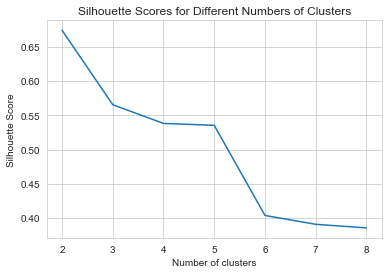

Optimal number of clusters: 2


In [21]:
cluster_group_hierarchical_scaled = analyze_and_plot_daily_meter_data_hierarchical_scaled(one_year_data, ids_and_area)


In [37]:
optimal_k_value = 8
cluster_group_hierarchical_scaled_numpy = analyze_and_plot_daily_meter_data_hierarchical_optimalk_scaled(gas_data, ids_and_area, optimal_k_value)


KeyboardInterrupt: 

In [33]:
optimal_k_value = 8
cluster_group_hierarchical_scaled = analyze_and_plot_daily_meter_data_hierarchical_optimalk_scaled(one_year_data, ids_and_area, optimal_k_value)


In [35]:
cluster_group_hierarchical_scaled

{0:         hour_0    hour_1    hour_2    hour_3    hour_4    hour_5    hour_6  \
 112   0.002443  0.003609  0.004220  0.004220  0.003665  0.007829  0.005441   
 125   0.002443  0.002998  0.004220  0.004220  0.004275  0.007218  0.006052   
 126   0.002388  0.002443  0.002998  0.003665  0.003054  0.007218  0.004831   
 127   0.001777  0.003054  0.003609  0.004220  0.003054  0.007218  0.005441   
 128   0.002443  0.002998  0.004220  0.003665  0.004220  0.007829  0.005441   
 ...        ...       ...       ...       ...       ...       ...       ...   
 2914  0.004231  0.004057  0.004057  0.003883  0.003709  0.003709  0.004037   
 2915  0.004733  0.004211  0.004231  0.004057  0.004211  0.004057  0.004366   
 2916  0.004733  0.004385  0.004211  0.004057  0.004211  0.004211  0.004037   
 2917  0.004385  0.004231  0.004037  0.003709  0.003883  0.003690  0.004037   
 2918  0.004385  0.004559  0.004366  0.004385  0.004211  0.004366  0.004714   
 
         hour_7    hour_8    hour_9  ...   hour

In [44]:
optimal_k_value = 8
cluster_group_scaled_one_year = analyze_and_plot_daily_meter_data_kmeans_optimalk_scaled(one_year_data, ids_and_area, optimal_k_value)

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 0: Count=380, Average=inf


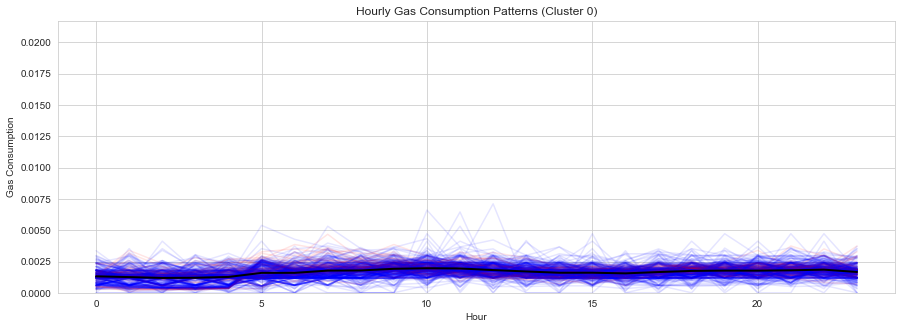

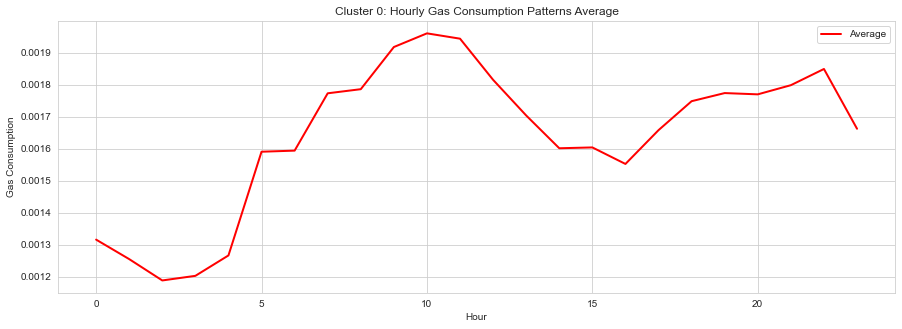

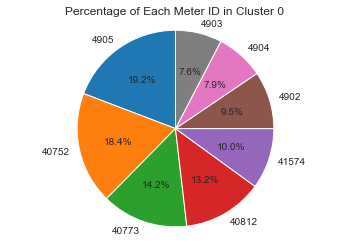

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 1: Count=313, Average=inf


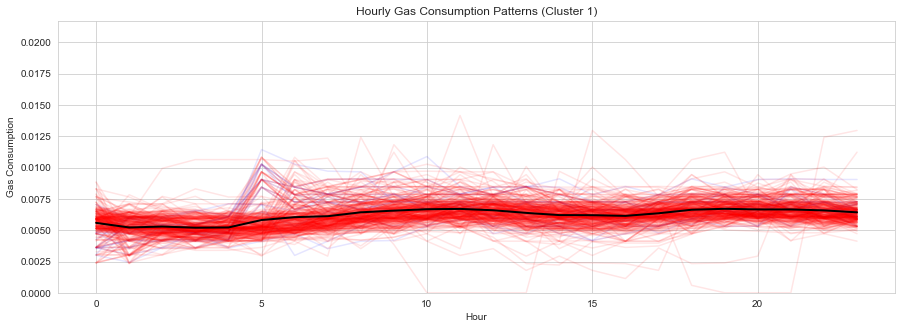

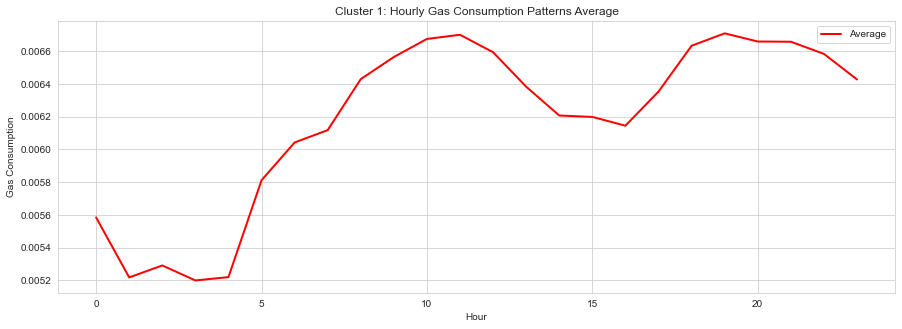

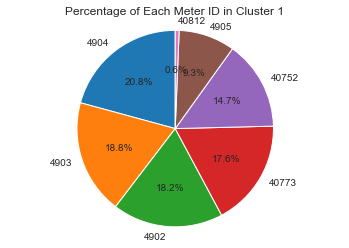

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 2: Count=112, Average=inf


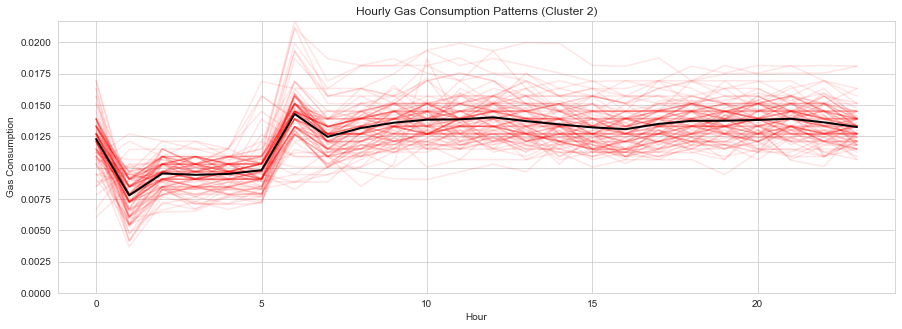

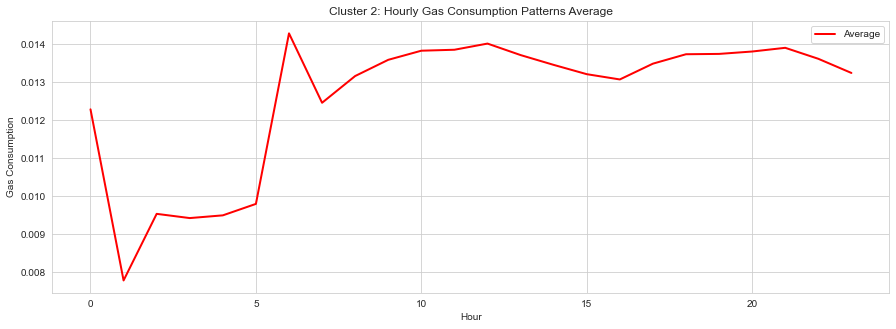

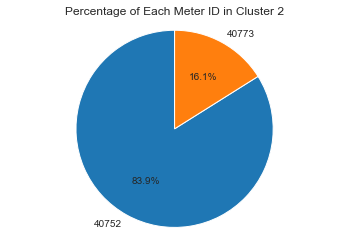

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 3: Count=485, Average=inf


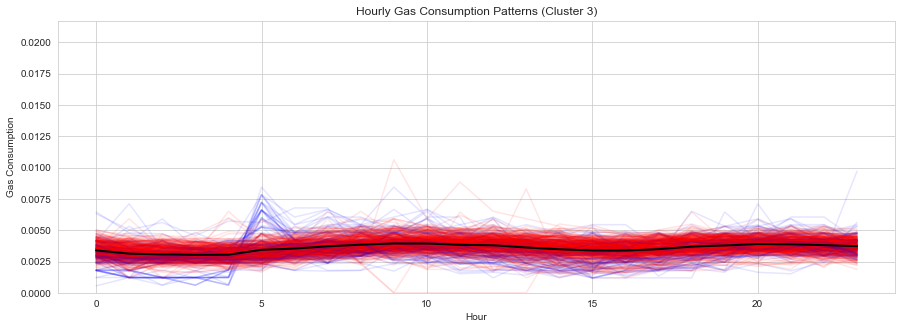

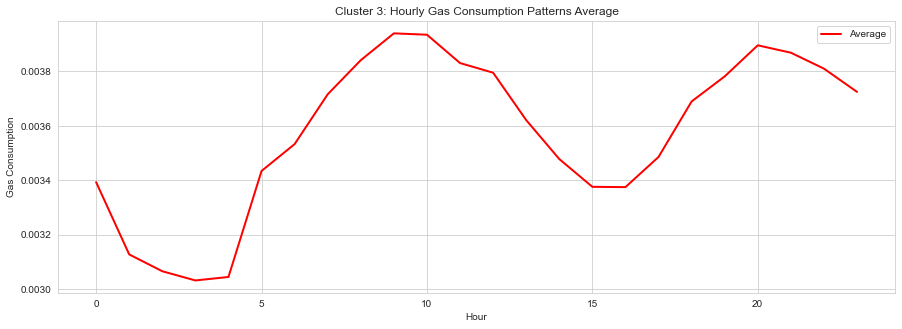

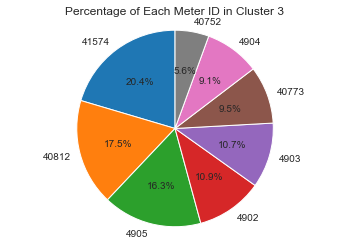

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 4: Count=160, Average=inf


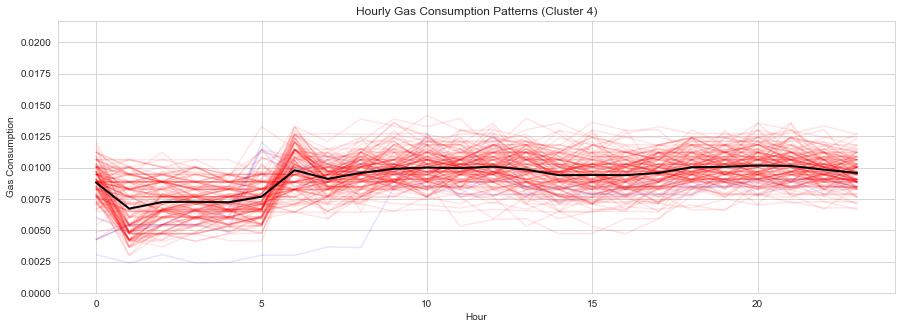

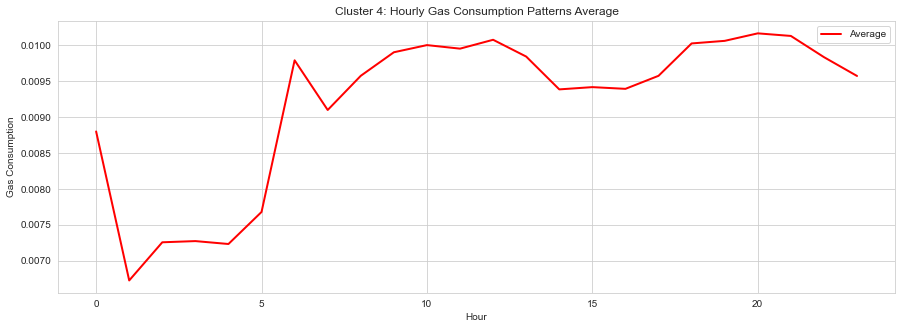

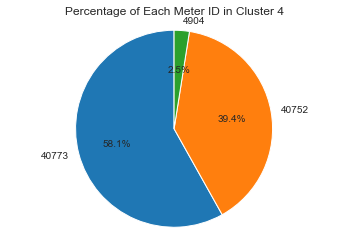

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 5: Count=460, Average=inf


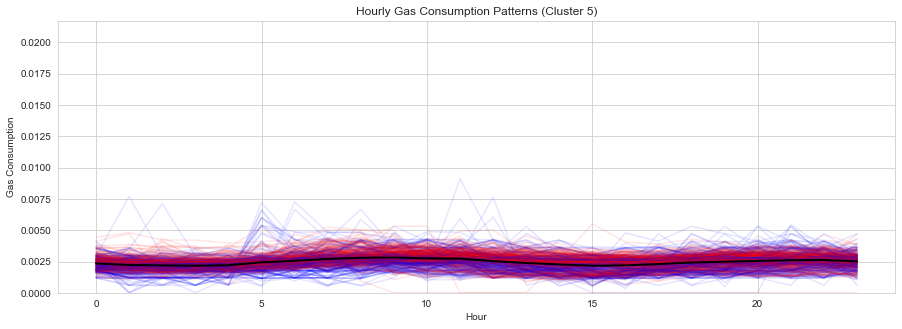

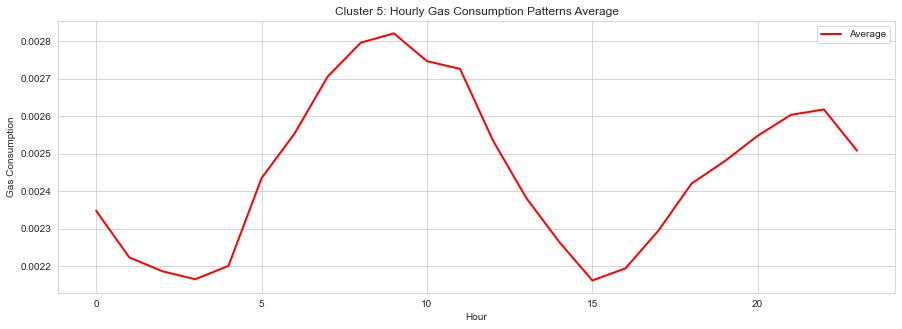

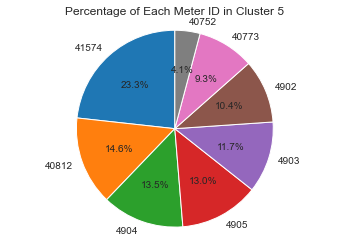

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 6: Count=562, Average=inf


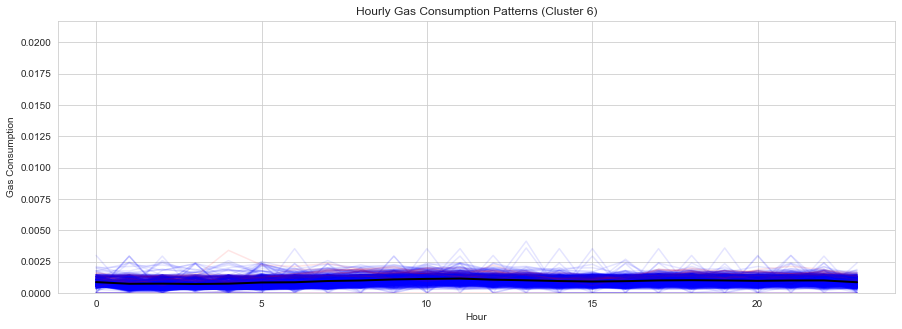

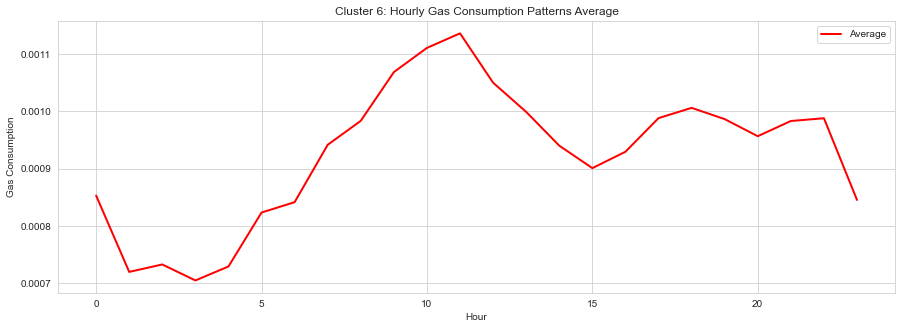

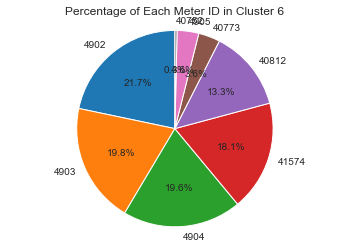

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 7: Count=448, Average=inf


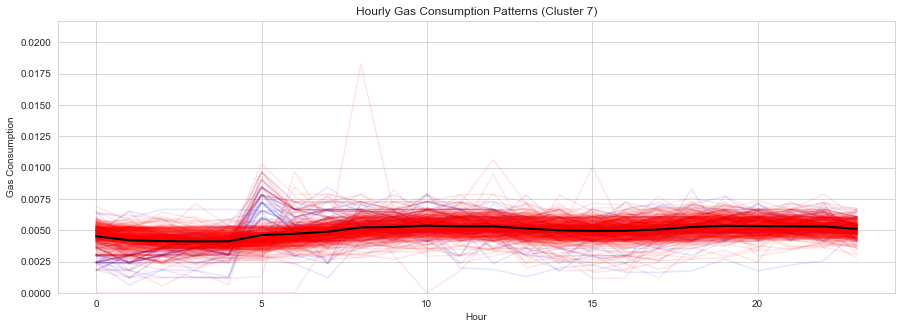

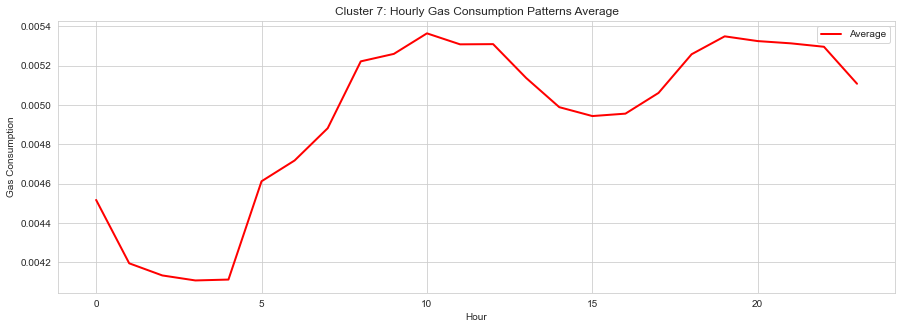

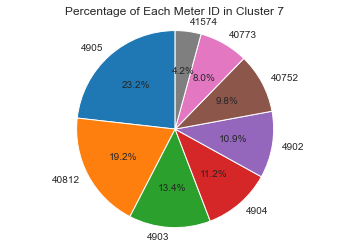

In [45]:
plot_cluster_data(cluster_group_scaled_one_year)

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 0: Count=514, Average=inf


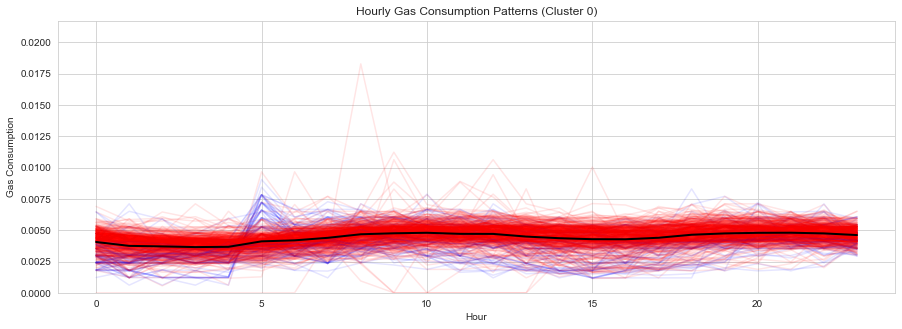

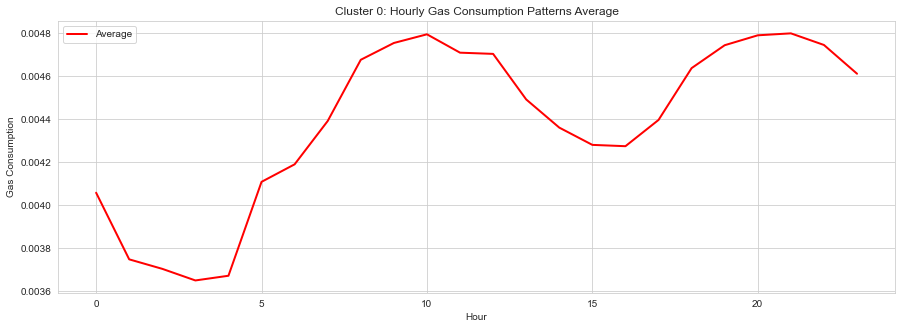

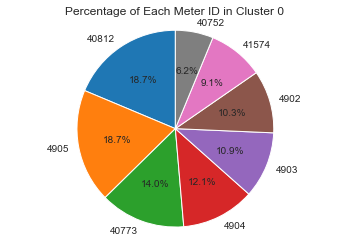

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 1: Count=113, Average=inf


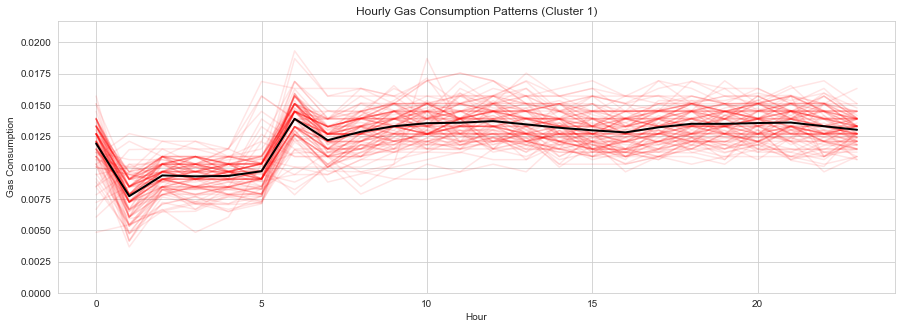

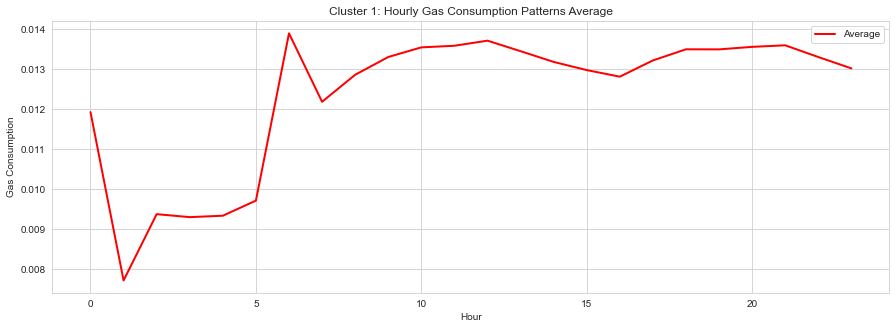

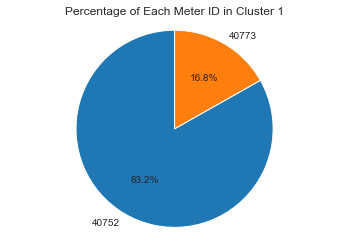

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 2: Count=423, Average=inf


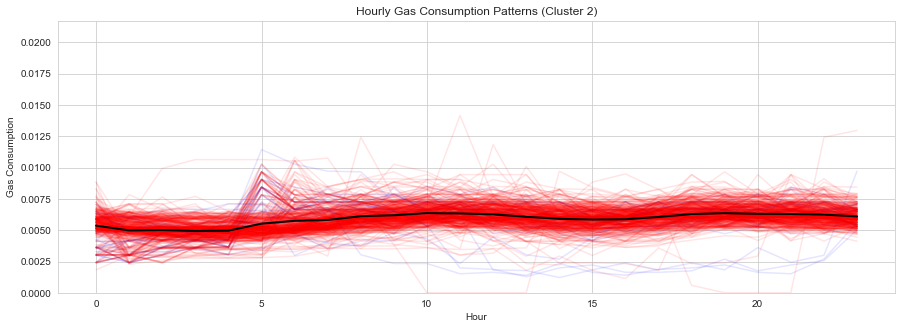

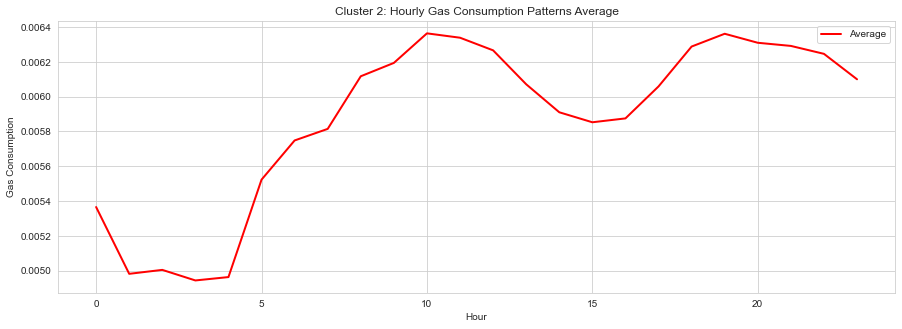

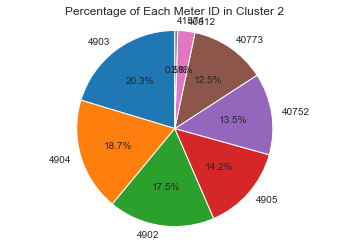

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 3: Count=71, Average=inf


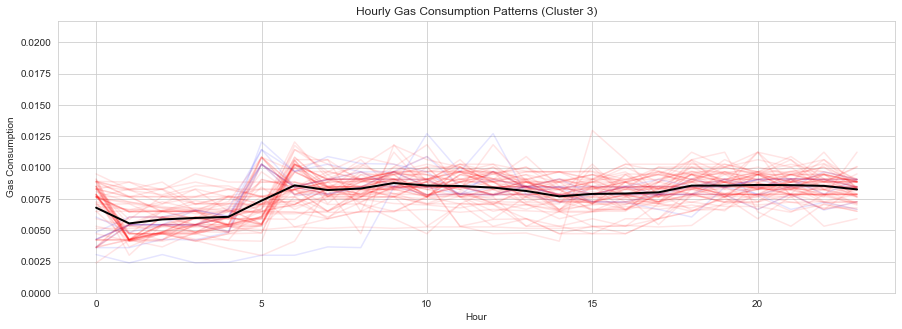

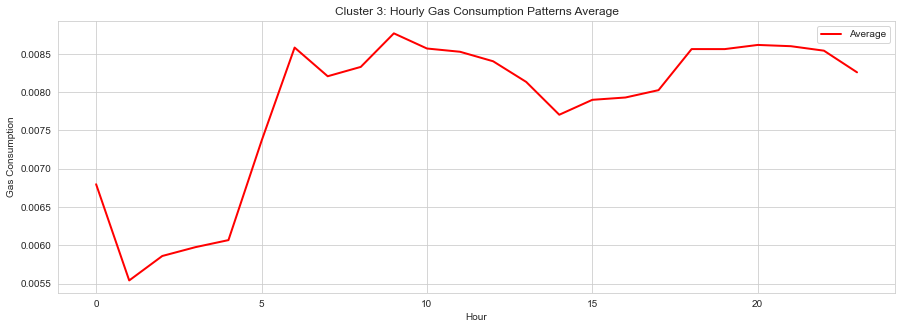

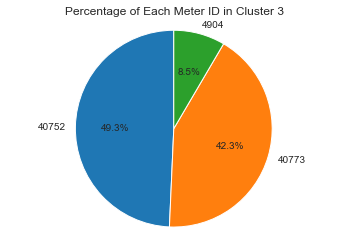

Cluster 4: Count=5, Average=3.2601926019260193e+22


C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


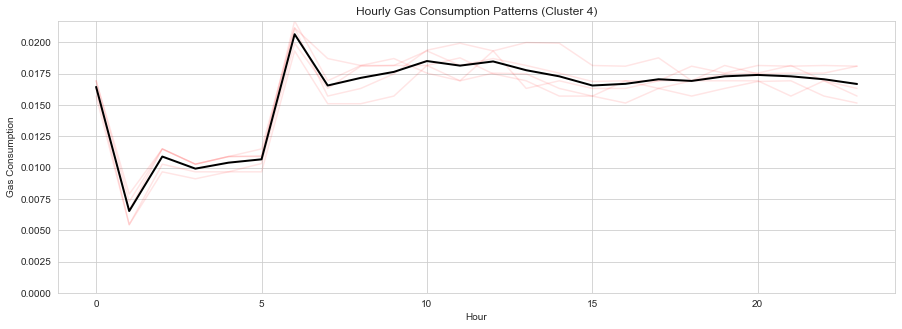

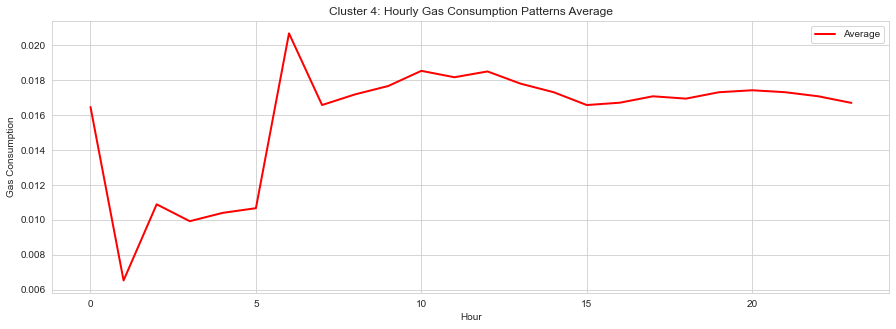

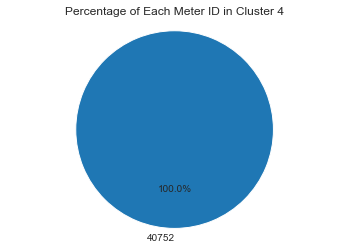

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 5: Count=629, Average=inf


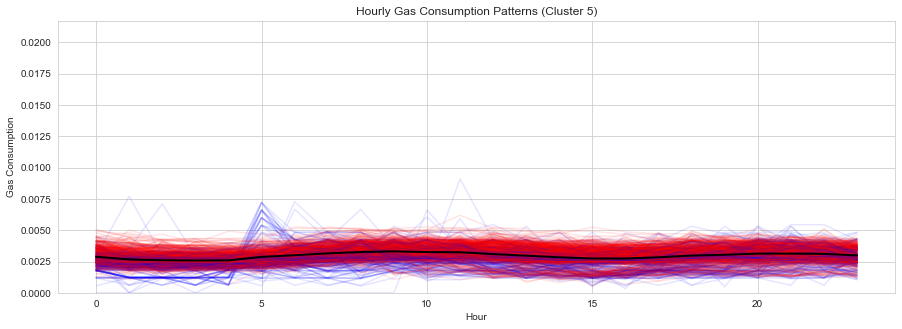

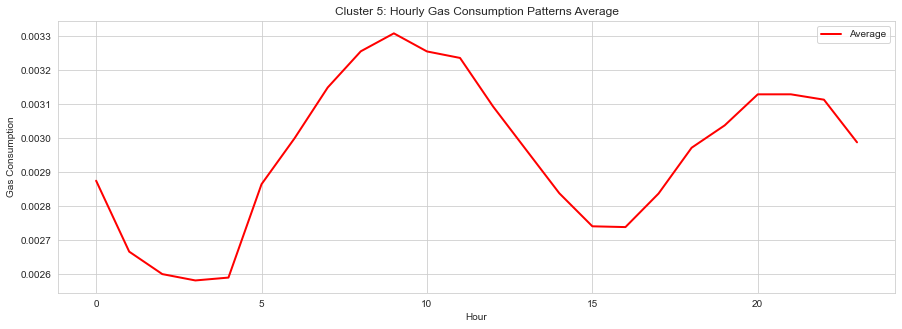

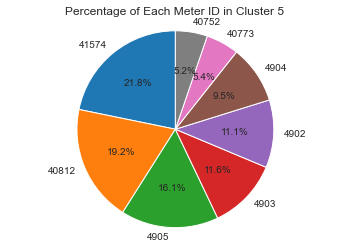

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 6: Count=105, Average=inf


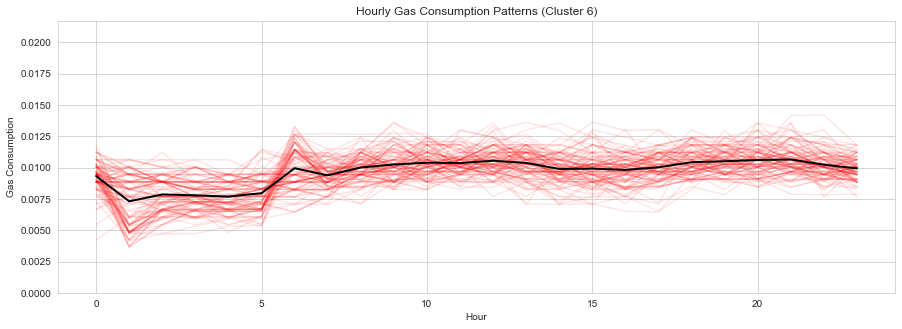

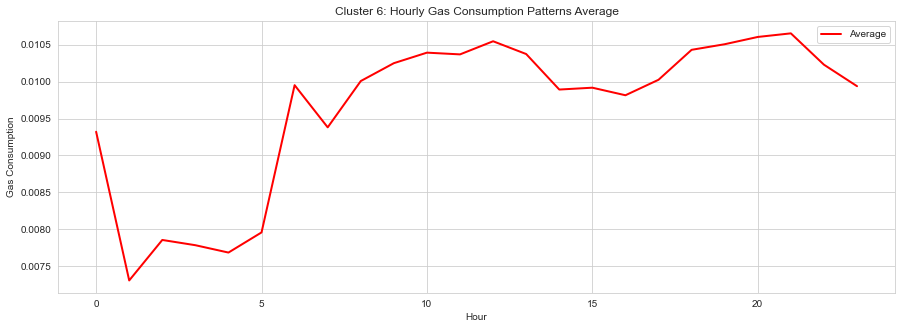

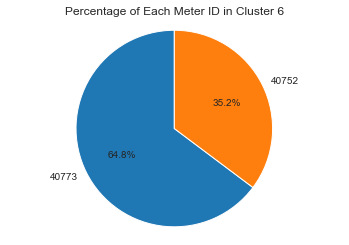

C:\Users\qwero\AppData\Local\Temp\ipykernel_25644\2336034917.py:14: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  print(f'Cluster {i}: Count={len(cluster_data)}, Average={cluster_data.mean().mean()}')


Cluster 7: Count=1060, Average=inf


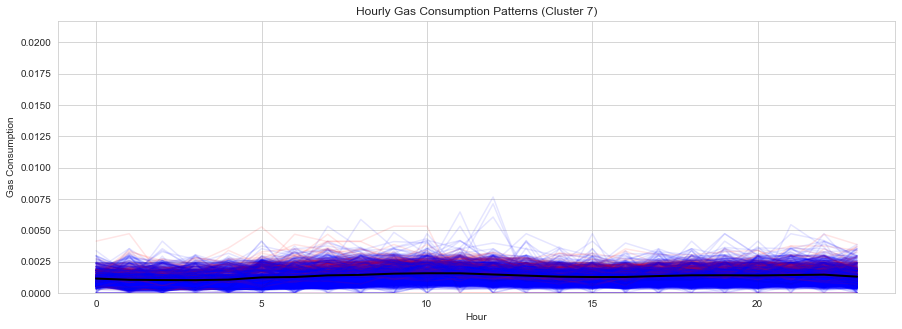

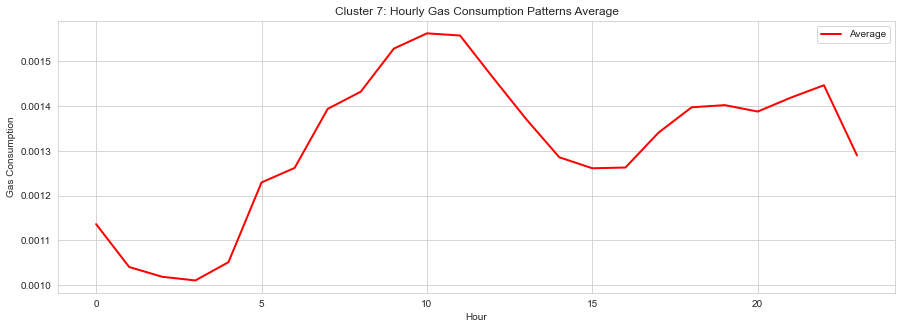

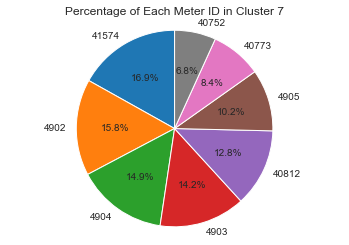

In [36]:
# Call the plotting function
plot_cluster_data(cluster_group_hierarchical_scaled)